# 0. Data Downloading

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
## install finrl library
#!pip install wrds
#!pip install swig
#!pip install -q condacolab
#import condacolab
#condacolab.install()
#!apt-get update -y -qq && apt-get install -y -qq cmake libopenmpi-dev python3-dev zlib1g-dev libgl1-mesa-glx swig
!pip install git+https://github.com/AI4Finance-Foundation/FinRL.git

  Cloning https://github.com/AI4Finance-Foundation/FinRL.git to /tmp/pip-req-build-y9wwywvz
  Running command git clone --filter=blob:none --quiet https://github.com/AI4Finance-Foundation/FinRL.git /tmp/pip-req-build-y9wwywvz
  Resolved https://github.com/AI4Finance-Foundation/FinRL.git to commit f4283de63ca73c915321c5555fa3751698a61eec
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/AI4Finance-Foundation/ElegantRL.git to /tmp/pip-install-u94twwv0/elegantrl_53ccd669df884e0fa75f625505633828
  Running command git clone --filter=blob:none --quiet https://github.com/AI4Finance-Foundation/ElegantRL.git /tmp/pip-install-u94twwv0/elegantrl_53ccd669df884e0fa75f625505633828
  Resolved https://github.com/AI4Finance-Foundation/ElegantRL.git to commit 24228304867bdc80165de435a598ef90b1893598
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.7/1

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import deque

import torch
# import torch.nn as nn
# import torch.optim as optim

from finrl.meta.preprocessor.preprocessors import FeatureEngineer, data_split
from finrl.meta.env_stock_trading.env_stocktrading import StockTradingEnv
from finrl.agents.stablebaselines3.models import DRLAgent, DRLEnsembleAgent
from finrl.plot import backtest_stats, backtest_plot, get_daily_return, get_baseline

from stable_baselines3 import PPO, A2C, DDPG
from stable_baselines3.common.vec_env import DummyVecEnv

from statsmodels.stats.outliers_influence import variance_inflation_factor

SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

%matplotlib inline

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
Users of this version of Gym should be able to simply replace 'import gym' with 'import gymnasium as gym' in the vast majority of cases.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\pyfolio\pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(


In [2]:
processed = pd.read_csv('processed_final_fixed.csv', index_col=0, parse_dates=['date', 'date_available'])

# 1. Best Out-Of-Box Model

### 0. Feature Selection

#### 0.1 Correlation, VIF, Feature Importance

In [3]:
processed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96019 entries, 0 to 96018
Data columns (total 79 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    96019 non-null  datetime64[ns]
 1   close                   96019 non-null  float64       
 2   high                    96019 non-null  float64       
 3   low                     96019 non-null  float64       
 4   open                    96019 non-null  float64       
 5   volume                  96019 non-null  int64         
 6   day                     96019 non-null  int64         
 7   date_available          96019 non-null  datetime64[ns]
 8   op_inc_q                96019 non-null  float64       
 9   rev_q                   96019 non-null  float64       
 10  net_inc_q               96019 non-null  float64       
 11  tot_assets              96019 non-null  float64       
 12  sh_equity               96019 non-null  float64    

In [ ]:
processed['tic'].unique()

array(['AAPL', 'AMGN', 'AMZN', 'AXP', 'BA', 'CAT', 'CRM', 'CSCO', 'CVX',
       'DIS', 'GS', 'HD', 'HON', 'IBM', 'INTC', 'JNJ', 'JPM', 'KO', 'MCD',
       'MMM', 'MRK', 'MSFT', 'NKE', 'PG', 'TRV', 'UNH', 'V', 'VZ', 'WMT'],
      dtype=object)

In [ ]:
# Анализ корреляции с целевой переменной (например, future_return)
correlations = []
analysis_df = processed.sort_values(['tic', 'date']).copy()
target = analysis_df.groupby('tic')['close'].pct_change().shift(-1)  # завтрашняя доходность по тикеру

for col in analysis_df.select_dtypes(include=[np.number]).columns:
    if col != 'close':
        corr = analysis_df[col].corr(target)
        correlations.append((col, abs(corr)))

correlations.sort(key=lambda x: x[1], reverse=True)
print("Топ признаков по корреляции с будущей доходностью:")
for col, corr in correlations:
    print(f"{col}: {corr:.4f}")


Топ признаков по корреляции с будущей доходностью:
forecast_trend: 0.1570
gru_return_forecast_5d: 0.1534
gru_return_forecast_3d: 0.1519
gru_return_forecast_4d: 0.1511
forecast_mean: 0.1501
gru_return_forecast_2d: 0.1417
gru_return_forecast_1d: 0.1281
daily_return: 0.0561
SP500_Trend: 0.0417
VIX: 0.0358
atr_rel: 0.0336
rsi_30: 0.0265
forecast_std: 0.0251
macd: 0.0248
10Y_Yield: 0.0186
cci_30: 0.0174
day: 0.0168
open: 0.0133
low: 0.0133
high: 0.0133
day_cos: 0.0124
PE_ratio: 0.0108
volume_ratio: 0.0107
turbulence: 0.0103
enterprise_value: 0.0092
market_cap: 0.0081
PB_ratio: 0.0076
dividend_yield: 0.0074
EV_EBITDA: 0.0072
dx_30: 0.0064
day_sin: 0.0050
PS_ratio: 0.0048
volume: 0.0039
cur_assets: 0.0038
cash_ratio: 0.0035
eps_incl_ex: 0.0034
EPS: 0.0034
sh_outstanding: 0.0034
obv_pct_change: 0.0031
cur_ratio: 0.0027
quick_ratio: 0.0026
inventories: 0.0025
ROE: 0.0024
div_per_sh: 0.0024
DPS: 0.0024
long_debt: 0.0023
short_debt: 0.0022
Market_Regime: 0.0020
debt_ratio: 0.0020
NPM: 0.0016
inv_

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
TOP_CORRELATED_FEATURES = [
    # 1. Прогнозы GRU
    'forecast_trend',
    'gru_return_forecast_4d',
    'gru_return_forecast_5d',
    'forecast_mean',
    'gru_return_forecast_3d',
    'gru_return_forecast_2d',
    'gru_return_forecast_1d',
    'forecast_std',

    # 2. Ценовые данные и доходность
    'daily_return',
    'open',
    'low',
    'high',

    # 3. Макроэкономические индикаторы
    '10Y_Yield',
    'SP500_Trend',
    'VIX',

    # 4. Рыночные режимы (HMM)
    'Regime_0_Prob',
    'Regime_1_Prob',
    'Market_Regime',

    # 5. Технические индикаторы
    'atr_rel',
    'rsi_30',
    'macd',
    'atr',
    'dx_30',
    'cci_30',

    # 6. Фундаментальные показатели (оценка компании)
    'PE_ratio',
    'PB_ratio',
    'PS_ratio',
    'EV_EBITDA',

    # 7. Размер компании
    'enterprise_value',
    'market_cap',
    'sh_outstanding',

    # 8. Дивидендные показатели
    'dividend_yield',
    'div_per_sh',
    'DPS',

    # 9. Показатели риска и долга
    'debt_ratio',
    'turbulence',
    'long_debt',
    'short_debt',

    # 10. Показатели эффективности и прибыли
    'net_inc_q',
    'revenue_growth',
    'op_inc_q',
    'ROE',
    'EPS',
    'eps_incl_ex',
    'NPM',

    # 11. Показатели ликвидности
    'cur_ratio',
    'cash_ratio',
    'quick_ratio',

    # 12. Объемные показатели
    'volume_ratio',
    'volume',
    'obv_pct_change',

    # 13. Временные признаки (сезонность)
    'day_sin',
    'day',
    'day_cos',

    # 14. Показатели деловой активности
    'acc_pay_turnover',
    'acc_rec_turnover',

    # 15. Балансовые показатели
    'tot_liabilities',
    'tot_assets',
    'inventories',
    'payables',
    'receivables',
    'cash_eq',
    'sh_equity',

    # 16. Прочие показатели
    'rev_q',
    'eps_growth',
    'OPM',
    'inv_turnover',
    'BPS',
    'ROA',
    'cogs_q',
]

In [ ]:
print(f"Отобранных признаков: {len(TOP_CORRELATED_FEATURES)}")
# Создаем DataFrame с выбранными признаками
features_df = processed[TOP_CORRELATED_FEATURES].dropna()

Отобранных признаков: 70


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def pca_feature_reduction(data, features, n_components=0.95):
    """
    Сокращение признаков с помощью PCA
    """
    df = data[features].copy().fillna(method='ffill')

    # Стандартизация
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df)

    # PCA
    pca = PCA(n_components=n_components)
    pca_data = pca.fit_transform(scaled_data)

    print(f"PCA результаты:")
    print(f"Оригинальные признаки: {len(features)}")
    print(f"PCA компоненты: {pca.n_components_}")
    print(f"Объясненная дисперсия: {pca.explained_variance_ratio_.sum():.3f}")

    # Важность признаков в каждой компоненте
    loadings = pd.DataFrame(
        pca.components_.T,
        columns=[f'PC{i+1}' for i in range(pca.n_components_)],
        index=features
    )

    print("\nТоп признаков по важности в первой компоненте:")
    print(loadings['PC1'].abs().sort_values(ascending=False))
    print("\nТоп признаков по важности в второй компоненте:")
    print(loadings['PC2'].abs().sort_values(ascending=False))
    return pca_data, loadings

# Если VIF показывает высокую мультиколлинеарность
pca_features, loadings = pca_feature_reduction(
    processed,
    TOP_CORRELATED_FEATURES,
    n_components=0.95  # объяснить 95% дисперсии
)

/tmp/ipykernel_1167/2211732497.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = data[features].copy().fillna(method='ffill')
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


PCA результаты:
Оригинальные признаки: 70
PCA компоненты: 31
Объясненная дисперсия: 0.952

Топ признаков по важности в первой компоненте:
long_debt                 0.297496
cash_eq                   0.293456
tot_assets                0.293091
tot_liabilities           0.290776
receivables               0.283170
payables                  0.272242
short_debt                0.270721
sh_equity                 0.237344
op_inc_q                  0.216404
net_inc_q                 0.173198
BPS                       0.169037
acc_pay_turnover          0.163484
inventories               0.137976
enterprise_value          0.132828
atr                       0.128945
market_cap                0.126769
high                      0.116200
open                      0.115811
low                       0.115483
debt_ratio                0.114491
PS_ratio                  0.106267
OPM                       0.095321
eps_incl_ex               0.092034
EPS                       0.092034
sh_outstanding        

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

def feature_importance_analysis(data, features, target='close'):
    """Анализ важности признаков"""
    data = data.sort_values(['tic', 'date']).copy()

    # Подготовка данных
    X = data[features].copy()
    X = X.groupby(data['tic']).ffill()
    y = data.groupby('tic')[target].pct_change().shift(-1)  # будущая доходность по тикеру

    # Выравнивание
    aligned_idx = X.index.intersection(y.dropna().index)
    X = X.loc[aligned_idx]
    y = y.loc[aligned_idx]

    # Разделение
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, shuffle=False
    )

    # Обучение
    rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(X_train, y_train)

    # Важность признаков
    importance = pd.DataFrame({
        'feature': features,
        'importance': rf.feature_importances_
    }).sort_values('importance', ascending=False)

    print("Топ-15 важных признаков по RandomForest:")
    print(importance.head(15).to_string())

    return importance

# Анализ
importance_df = feature_importance_analysis(processed, TOP_CORRELATED_FEATURES)

# Выбор признаков по порогу важности
threshold = 0.01  # 1%
selected_features = importance_df[importance_df['importance'] > threshold]['feature'].tolist()
print(f"\nПризнаки с важностью >{threshold}: {len(selected_features)}")
print(selected_features)


Топ-15 важных признаков по RandomForest:
           feature  importance
13     SP500_Trend    0.064171
14             VIX    0.057042
12       10Y_Yield    0.054242
35      turbulence    0.053268
8     daily_return    0.052222
48    volume_ratio    0.042452
18         atr_rel    0.039997
20            macd    0.030598
50  obv_pct_change    0.029224
22           dx_30    0.029113
23          cci_30    0.028877
16   Regime_1_Prob    0.026748
19          rsi_30    0.026096
49          volume    0.024836
21             atr    0.019781

Признаки с важностью >0.01: 32
['SP500_Trend', 'VIX', '10Y_Yield', 'turbulence', 'daily_return', 'volume_ratio', 'atr_rel', 'macd', 'obv_pct_change', 'dx_30', 'cci_30', 'Regime_1_Prob', 'rsi_30', 'volume', 'atr', 'forecast_trend', 'PE_ratio', 'gru_return_forecast_5d', 'EV_EBITDA', 'market_cap', 'PS_ratio', 'gru_return_forecast_4d', 'enterprise_value', 'day_sin', 'forecast_std', 'PB_ratio', 'dividend_yield', 'gru_return_forecast_1d', 'gru_return_forecast_3d',

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
importance_df


,feature,importance
13,SP500_Trend,0.064171
14,VIX,0.057042
12,10Y_Yield,0.054242
35,turbulence,0.053268
8,daily_return,0.052222
48,volume_ratio,0.042452
18,atr_rel,0.039997
20,macd,0.030598
50,obv_pct_change,0.029224
22,dx_30,0.029113


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


#### 0.2 Visualisations

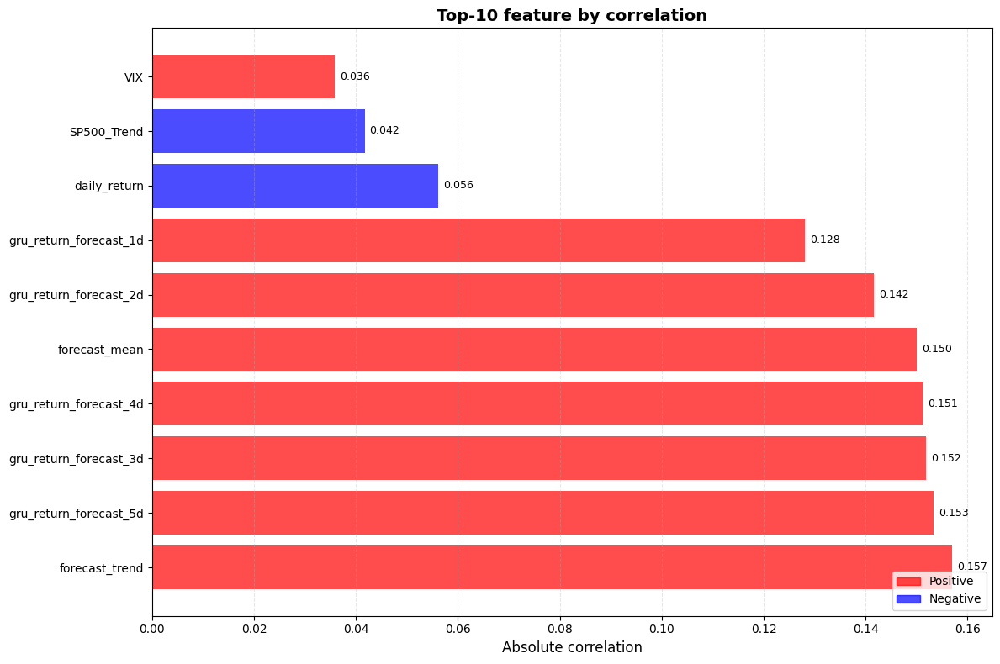

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_correlation_results(correlations, top_n=20):
    """
    График корреляций признаков с целевой переменной
    """
    # Берем топ-N признаков
    top_corr = correlations[:top_n]
    features, corr_values = zip(*top_corr)

    # Создаем цветовую схему (красный для положительной, синий для отрицательной корреляции)
    colors = ['red' if processed[feat].corr(target) > 0 else 'blue'
              for feat in features]

    fig, ax = plt.subplots(figsize=(12, 8))

    # Горизонтальный барплот
    bars = ax.barh(features, corr_values, color=colors, alpha=0.7)
    ax.set_xlabel('Absolute correlation', fontsize=12)
    ax.set_title(f'Top-{top_n} feature by correlation',
                 fontsize=14, fontweight='bold')
    ax.grid(axis='x', alpha=0.3, linestyle='--')

    # Добавляем значения на бары
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.001, bar.get_y() + bar.get_height()/2,
                f'{width:.3f}', ha='left', va='center', fontsize=9)

    # Линия нулевой корреляции
    ax.axvline(x=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)

    # Легенда
    import matplotlib.patches as mpatches
    red_patch = mpatches.Patch(color='red', alpha=0.7, label='Positive')
    blue_patch = mpatches.Patch(color='blue', alpha=0.7, label='Negative')
    ax.legend(handles=[red_patch, blue_patch], loc='lower right')

    plt.tight_layout()
    return fig

# Использование
fig1 = plot_correlation_results(correlations, top_n=10)
plt.show()

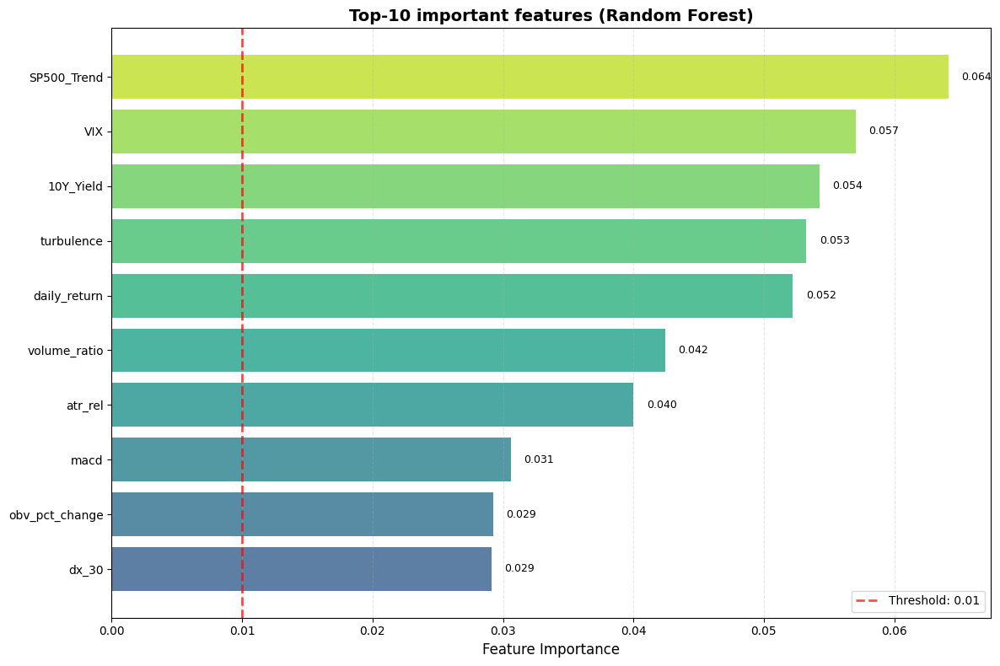

In [ ]:
def plot_feature_importance(importance_df, top_n=20, threshold=None):
    """
    График важности признаков из Random Forest
    """
    fig, ax = plt.subplots(figsize=(12, 8))

    # Берем топ-N признаков
    top_features = importance_df.head(top_n).copy()

    # Сортировка для горизонтального графика
    top_features = top_features.sort_values('importance', ascending=True)

    # Создаем градиент цветов
    colors = plt.cm.viridis(np.linspace(0.3, 0.9, len(top_features)))

    # Горизонтальный барплот
    bars = ax.barh(top_features['feature'], top_features['importance'],
                   color=colors, alpha=0.8)

    ax.set_xlabel('Feature Importance', fontsize=12)
    ax.set_title(f'Top-{top_n} important features (Random Forest)',
                 fontsize=14, fontweight='bold')
    ax.grid(axis='x', alpha=0.3, linestyle='--')

    # Добавляем пороговую линию если указана
    if threshold:
        ax.axvline(x=threshold, color='red', linestyle='--',
                   linewidth=2, alpha=0.7, label=f'Threshold: {threshold}')
        ax.legend()

    # Добавляем значения на бары
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.001, bar.get_y() + bar.get_height()/2,
                f'{width:.3f}', ha='left', va='center', fontsize=9)

    plt.tight_layout()
    return fig

# Использование
fig2 = plot_feature_importance(importance_df, top_n=10, threshold=0.01)
plt.show()

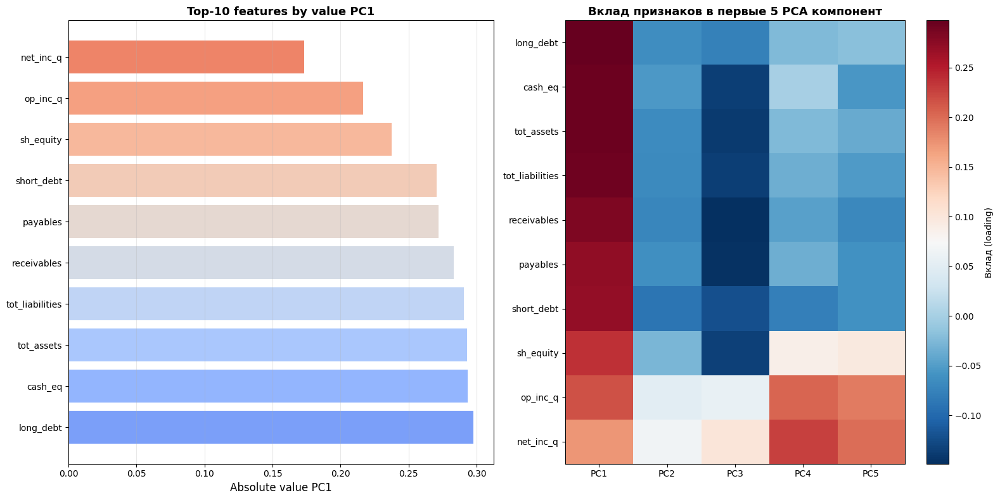

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
def plot_pca_loadings(loadings, top_n=15):
    """
    График вклада признаков в основные PCA компоненты
    """
    # Берем топ-N признаков по первой компоненте
    top_loadings = loadings['PC1'].abs().sort_values(ascending=False).head(top_n)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # График 1: Вклад в первую компоненту
    colors1 = plt.cm.coolwarm(np.linspace(0.2, 0.8, len(top_loadings)))
    bars1 = axes[0].barh(top_loadings.index, top_loadings.values, color=colors1)
    axes[0].set_xlabel('Absolute value PC1', fontsize=12)
    axes[0].set_title(f'Top-{top_n} features by value PC1',
                     fontsize=13, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)

    # График 2: Heatmap вкладов в первые 5 компонент
    # Берем топ-10 признаков по PC1 и смотрим их вклад в первые 5 компонент
    top_features = top_loadings.index[:10]
    component_loadings = loadings.loc[top_features, ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']]

    # Heatmap
    im = axes[1].imshow(component_loadings.values, cmap='RdBu_r', aspect='auto')
    axes[1].set_xticks(range(5))
    axes[1].set_xticklabels(['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
    axes[1].set_yticks(range(len(top_features)))
    axes[1].set_yticklabels(top_features)
    axes[1].set_title('Вклад признаков в первые 5 PCA компонент',
                     fontsize=13, fontweight='bold')

    # Цветовая шкала
    plt.colorbar(im, ax=axes[1], label='Вклад (loading)')

    plt.tight_layout()
    return fig

# Использование
fig3 = plot_pca_loadings(loadings, top_n=10)
plt.show()

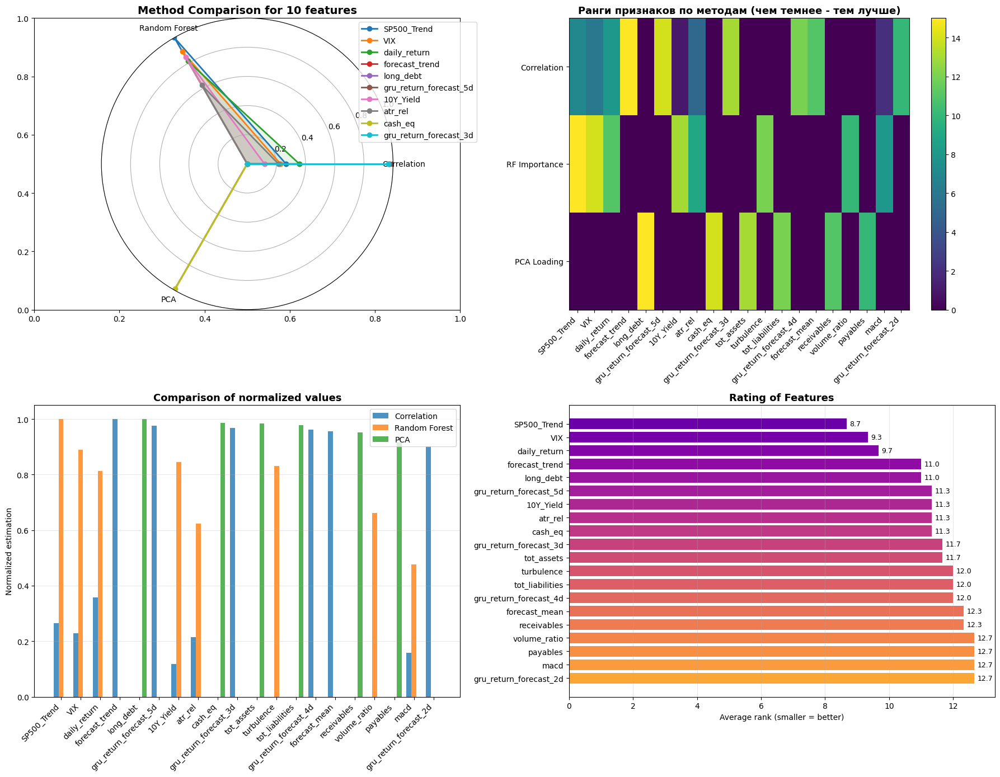

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
def plot_comparative_analysis(correlations, importance_df, loadings, top_n=15):
    """
    Комбинированный график сравнения трех методов отбора признаков
    """
    # Подготовка данных
    # 1. Корреляции
    corr_features = [f[0] for f in correlations[:top_n]]
    corr_scores = [abs(f[1]) for f in correlations[:top_n]]

    # 2. Важность признаков
    imp_features = importance_df.head(top_n)['feature'].tolist()
    imp_scores = importance_df.head(top_n)['importance'].tolist()

    # 3. PCA loadings
    pca_features = loadings['PC1'].abs().sort_values(ascending=False).head(top_n).index.tolist()
    pca_scores = loadings['PC1'].abs().sort_values(ascending=False).head(top_n).values.tolist()

    # Находим общие признаки
    all_features = set(corr_features) | set(imp_features) | set(pca_features)

    # Создаем DataFrame для сравнения
    comparison_data = []
    for feature in all_features:
        row = {'feature': feature}

        # Получаем ранги из каждого метода
        row['corr_rank'] = corr_features.index(feature) + 1 if feature in corr_features else top_n + 1
        row['rf_rank'] = imp_features.index(feature) + 1 if feature in imp_features else top_n + 1
        row['pca_rank'] = pca_features.index(feature) + 1 if feature in pca_features else top_n + 1

        # Нормализованные оценки
        row['corr_score'] = corr_scores[corr_features.index(feature)] if feature in corr_features else 0
        row['rf_score'] = imp_scores[imp_features.index(feature)] if feature in imp_features else 0
        row['pca_score'] = pca_scores[pca_features.index(feature)] if feature in pca_features else 0

        comparison_data.append(row)

    comparison_df = pd.DataFrame(comparison_data)

    # Нормализуем оценки для сравнения
    for col in ['corr_score', 'rf_score', 'pca_score']:
        comparison_df[f'{col}_norm'] = comparison_df[col] / comparison_df[col].max()

    # Берем топ-20 признаков по сумме рангов
    comparison_df['avg_rank'] = comparison_df[['corr_rank', 'rf_rank', 'pca_rank']].mean(axis=1)
    comparison_df = comparison_df.sort_values('avg_rank').head(20)

    # Создаем график
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))

    # График 1: Radar chart для топ-5 признаков
    top5 = comparison_df.head(10)['feature'].tolist()

    # Данные для radar chart
    categories = ['Correlation', 'Random Forest', 'PCA']
    N = len(categories)

    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]

    ax1 = fig.add_subplot(2, 2, 1, polar=True)
    colors = plt.cm.tab10(np.linspace(0, 1, len(top5)))

    for idx, feature in enumerate(top5):
        row = comparison_df[comparison_df['feature'] == feature].iloc[0]
        values = [row['corr_score_norm'], row['rf_score_norm'], row['pca_score_norm']]
        values += values[:1]

        ax1.plot(angles, values, 'o-', linewidth=2, label=feature, color=colors[idx])
        ax1.fill(angles, values, alpha=0.1, color=colors[idx])

    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(categories)
    ax1.set_ylim(0, 1)
    ax1.set_title('Method Comparison for 10 features', fontsize=14, fontweight='bold')
    ax1.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))

    # График 2: Heatmap рангов
    ax2 = axes[0, 1]
    rank_data = comparison_df.set_index('feature')[['corr_rank', 'rf_rank', 'pca_rank']]

    # Инвертируем ранги для лучшей визуализации (1 = лучший)
    rank_data_inv = (top_n + 1) - rank_data

    im2 = ax2.imshow(rank_data_inv.T, cmap='viridis', aspect='auto')
    ax2.set_xticks(range(len(rank_data)))
    ax2.set_xticklabels(rank_data.index, rotation=45, ha='right')
    ax2.set_yticks(range(3))
    ax2.set_yticklabels(['Correlation', 'RF Importance', 'PCA Loading'])
    ax2.set_title('Ранги признаков по методам (чем темнее - тем лучше)',
                 fontsize=13, fontweight='bold')

    plt.colorbar(im2, ax=ax2)

    # График 3: Сравнение нормализованных оценок
    ax3 = axes[1, 0]

    x = np.arange(len(comparison_df))
    width = 0.25

    bars1 = ax3.bar(x - width, comparison_df['corr_score_norm'], width,
                    label='Correlation', alpha=0.8)
    bars2 = ax3.bar(x, comparison_df['rf_score_norm'], width,
                    label='Random Forest', alpha=0.8)
    bars3 = ax3.bar(x + width, comparison_df['pca_score_norm'], width,
                    label='PCA', alpha=0.8)

    ax3.set_xticks(x)
    ax3.set_xticklabels(comparison_df['feature'], rotation=45, ha='right')
    ax3.set_ylabel('Normalized estimation')
    ax3.set_title('Comparison of normalized values',
                 fontsize=13, fontweight='bold')
    ax3.legend()
    ax3.grid(axis='y', alpha=0.3)

    # График 4: Консенсус (средний ранг)
    ax4 = axes[1, 1]

    # Сортируем по среднему рангу
    consensus_df = comparison_df.sort_values('avg_rank')

    colors_consensus = plt.cm.plasma(np.linspace(0.2, 0.8, len(consensus_df)))
    bars = ax4.barh(consensus_df['feature'], consensus_df['avg_rank'],
                    color=colors_consensus)

    ax4.set_xlabel('Average rank (smaller = better)')
    ax4.set_title('Rating of Features',
                 fontsize=13, fontweight='bold')
    ax4.invert_yaxis()  # Лучшие признаки сверху
    ax4.grid(axis='x', alpha=0.3)

    # Добавляем значения
    for bar in bars:
        width = bar.get_width()
        ax4.text(width + 0.1, bar.get_y() + bar.get_height()/2,
                f'{width:.1f}', ha='left', va='center', fontsize=9)

    plt.tight_layout()
    return fig, comparison_df

# Использование
fig4, comparison_df = plot_comparative_analysis(correlations, importance_df, loadings, top_n=15)
plt.show()

AttributeError: 'Index' object has no attribute 'to_period'

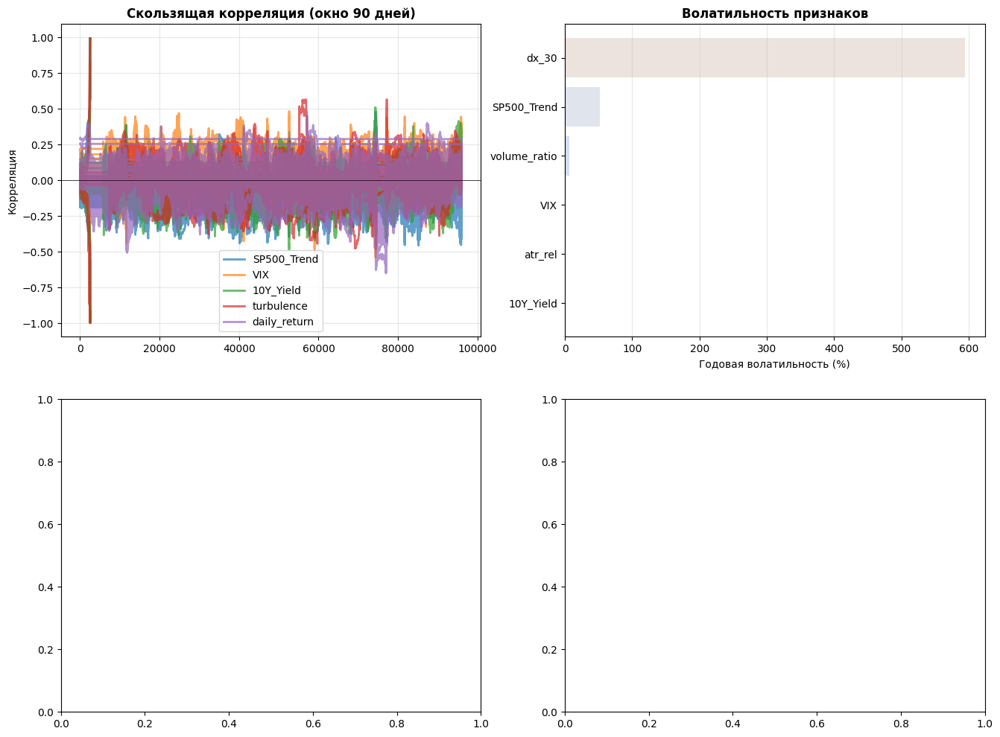

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
def plot_temporal_feature_stability(data, selected_features, window_days=90):
    """
    Анализ стабильности важности признаков во времени
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # 1. Скользящая корреляция для топ-5 признаков
    top_features = selected_features[:5]

    for feature in top_features:
        # Скользящая корреляция с целевой переменной
        rolling_corr = data[feature].rolling(window=window_days).corr(
            data['close'].pct_change().shift(-1)
        )
        axes[0, 0].plot(rolling_corr.index, rolling_corr.values,
                       label=feature, linewidth=2, alpha=0.7)

    axes[0, 0].set_title(f'Скользящая корреляция (окно {window_days} дней)',
                        fontsize=12, fontweight='bold')
    axes[0, 0].set_ylabel('Корреляция')
    axes[0, 0].legend()
    axes[0, 0].grid(alpha=0.3)
    axes[0, 0].axhline(y=0, color='black', linestyle='-', linewidth=0.5)

    # 2. Волатильность важности признаков
    volatility_data = []
    for feature in selected_features[:10]:
        feature_series = data[feature].dropna()
        # Мера изменчивости (стандартное отклонение изменений)
        volatility = feature_series.pct_change().std() * np.sqrt(252)  # Годовая волатильность
        volatility_data.append((feature, volatility))

    volatility_df = pd.DataFrame(volatility_data, columns=['feature', 'volatility'])
    volatility_df = volatility_df.sort_values('volatility')

    colors_vol = plt.cm.coolwarm(np.linspace(0.2, 0.8, len(volatility_df)))
    axes[0, 1].barh(volatility_df['feature'], volatility_df['volatility'],
                    color=colors_vol, alpha=0.7)
    axes[0, 1].set_title('Волатильность признаков', fontsize=12, fontweight='bold')
    axes[0, 1].set_xlabel('Годовая волатильность (%)')
    axes[0, 1].grid(axis='x', alpha=0.3)

    # 3. Heatmap важности по периодам (кварталам)
    data['quarter'] = data.index.to_period('Q')
    quarterly_importance = []

    for quarter in sorted(data['quarter'].unique())[-8:]:  # Последние 8 кварталов
        quarter_data = data[data['quarter'] == quarter]
        if len(quarter_data) > 30:  # Минимум 30 наблюдений
            correlations_q = []
            target_q = quarter_data['close'].pct_change().shift(-1)

            for feature in selected_features[:15]:
                corr = quarter_data[feature].corr(target_q)
                correlations_q.append(abs(corr) if not pd.isna(corr) else 0)

            quarterly_importance.append(correlations_q)

    if quarterly_importance:
        quarterly_df = pd.DataFrame(
            quarterly_importance,
            columns=selected_features[:15],
            index=sorted(data['quarter'].unique())[-len(quarterly_importance):]
        )

        im = axes[1, 0].imshow(quarterly_df.T, cmap='YlOrRd', aspect='auto')
        axes[1, 0].set_xticks(range(len(quarterly_df)))
        axes[1, 0].set_xticklabels([str(q) for q in quarterly_df.index], rotation=45)
        axes[1, 0].set_yticks(range(len(quarterly_df.columns)))
        axes[1, 0].set_yticklabels(quarterly_df.columns)
        axes[1, 0].set_title('Важность признаков по кварталам',
                           fontsize=12, fontweight='bold')
        plt.colorbar(im, ax=axes[1, 0])

    # 4. Матрица консенсуса методов
    consensus_matrix = np.zeros((len(selected_features[:10]), 3))

    for i, feature in enumerate(selected_features[:10]):
        # Корреляция
        corr_rank = next((idx for idx, (f, _) in enumerate(correlations)
                         if f == feature), 100)
        consensus_matrix[i, 0] = 1 / (corr_rank + 1)  # Обратный ранг

        # Random Forest
        rf_row = importance_df[importance_df['feature'] == feature]
        consensus_matrix[i, 1] = rf_row['importance'].values[0] if not rf_row.empty else 0

        # PCA
        if feature in loadings.index:
            consensus_matrix[i, 2] = abs(loadings.loc[feature, 'PC1'])

    # Нормализация
    consensus_matrix = consensus_matrix / consensus_matrix.max(axis=0)

    x = np.arange(len(selected_features[:10]))
    width = 0.25

    axes[1, 1].bar(x - width, consensus_matrix[:, 0], width,
                   label='Correlation', alpha=0.8, color='blue')
    axes[1, 1].bar(x, consensus_matrix[:, 1], width,
                   label='RF Importance', alpha=0.8, color='green')
    axes[1, 1].bar(x + width, consensus_matrix[:, 2], width,
                   label='PCA Loading', alpha=0.8, color='red')

    axes[1, 1].set_xticks(x)
    axes[1, 1].set_xticklabels(selected_features[:10], rotation=45, ha='right')
    axes[1, 1].set_ylabel('Нормализованная оценка')
    axes[1, 1].set_title('Консенсус методов по топ-10 признакам',
                        fontsize=12, fontweight='bold')
    axes[1, 1].legend()
    axes[1, 1].grid(axis='y', alpha=0.3)

    plt.suptitle('АНАЛИЗ СТАБИЛЬНОСТИ И КОНСЕНСУСА ПРИЗНАКОВ',
                fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()

    return fig

# Использование
fig5 = plot_temporal_feature_stability(processed, selected_features, window_days=90)
plt.show()

Используем только прогнозы GRU по следующим причинам:

Прогнозы GRU уже включают информацию о ценах (они обучены на них)

PCA показывает, что прогнозы имеют максимальную нагрузку в первой компоненте

Избегаем мультиколлинеарности - убираем open, close

Сохраняем информативность - прогнозы лучше чем сырые цены

Таким образом оптимальный набор

#### 0.3 Final Features

In [ ]:
def check_final_vif(data, features):
    """Проверка VIF для финального набора"""
    df = data[features].copy().fillna(method='ffill')

    vif_data = pd.DataFrame()
    vif_data["feature"] = df.columns
    vif_data["VIF"] = [
        variance_inflation_factor(df.values, i)
        for i in range(len(df.columns))
    ]

    vif_data = vif_data.sort_values("VIF", ascending=False)

    print("Мультиколлинеарность финального набора:")
    print(vif_data.to_string())
    print(f"\nМаксимальный VIF: {vif_data['VIF'].max():.2f}")
    print(f"Средний VIF: {vif_data['VIF'].mean():.2f}")

    # Проверка порогов
    high_vif = vif_data[vif_data['VIF'] > 10]
    moderate_vif = vif_data[(vif_data['VIF'] > 5) & (vif_data['VIF'] <= 10)]

    if len(high_vif) > 0:
        print(f"\n⚠️  ВНИМАНИЕ: {len(high_vif)} признаков с VIF > 10:")
        print(high_vif[['feature', 'VIF']].to_string())
    else:
        print("✓ Нет признаков с VIF > 10")

    return vif_data

In [3]:
# Финальный список колонок для State Space
RL_FEATURES =[
    # Макро и ML
    'Regime_1_Prob', 'SP500_Trend', 'forecast_std',
    'gru_return_forecast_1d', 'gru_return_forecast_5d',

    # Риски
    'turbulence', '10Y_Yield', 'VIX', 'atr_rel',

    # Техника и объемы
    'daily_return', 'macd', 'rsi_30', 'cci_30', 'dx_30',
    'volume_ratio', 'obv_pct_change',

    # Фундаментал
    'PE_ratio', 'PB_ratio', 'dividend_yield',
    'debt_ratio', 'revenue_growth', 'EV_EBITDA'
]



In [ ]:
# 3. Проверяем VIF
print("Проверка финального набора...")
final_vif = check_final_vif(processed,RL_FEATURES)

Проверка финального набора...


/tmp/ipykernel_1167/3380345563.py:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = data[features].copy().fillna(method='ffill')
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Мультиколлинеарность финального набора:
                   feature        VIF
11                  rsi_30  72.440208
7                      VIX  29.063325
6                10Y_Yield  13.203939
8                  atr_rel  13.158346
19              debt_ratio  12.701806
4   gru_return_forecast_5d   8.179149
3   gru_return_forecast_1d   7.752592
14            volume_ratio   7.272152
0            Regime_1_Prob   4.070550
13                   dx_30   3.232210
17                PB_ratio   3.219970
16                PE_ratio   3.150134
1              SP500_Trend   3.106785
18          dividend_yield   3.008372
12                  cci_30   2.343266
5               turbulence   2.109806
2             forecast_std   1.826311
10                    macd   1.689306
20          revenue_growth   1.346142
9             daily_return   1.141697
21               EV_EBITDA   1.036030
15          obv_pct_change   1.000133

Максимальный VIF: 72.44
Средний VIF: 8.91

⚠️  ВНИМАНИЕ: 5 признаков с VIF > 10:
    

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [4]:
# Создание финального датасета для среды
final_rl_df = processed[['date', 'tic', 'close'] + RL_FEATURES] # 'close' нужен только среде для расчета баланса

In [5]:
final_rl_df.shape

(96019, 25)

### 1.0 Setting up Train / Validation / Frozen Test periods, Environment and Model


In [6]:
final_rl_df = final_rl_df.sort_values(['date', 'tic']).reset_index(drop=True)

In [7]:
from finrl.config import (
    DATA_SAVE_DIR,
    TRAINED_MODEL_DIR,
    TENSORBOARD_LOG_DIR,
    RESULTS_DIR,
    INDICATORS,
    TRAIN_START_DATE,
    TRAIN_END_DATE,
    TEST_START_DATE,
    TEST_END_DATE,
    TRADE_START_DATE,
    TRADE_END_DATE,
)

TRAIN_START_DATE = '2010-01-01'
TRAIN_END_DATE = '2021-10-01'
VAL_START_DATE = '2021-10-01'
VAL_END_DATE = '2022-01-03'
TEST_START_DATE = '2022-01-03'
TEST_END_DATE = '2023-03-01'


In [8]:
# Data split: train -> validation -> frozen test
train_start = TRAIN_START_DATE
train_end = TRAIN_END_DATE
val_start = VAL_START_DATE
val_end = VAL_END_DATE
test_start = TEST_START_DATE
test_end = TEST_END_DATE


In [9]:
train = data_split(final_rl_df, train_start, train_end)
validation = data_split(final_rl_df, val_start, val_end)
test = data_split(final_rl_df, test_start, test_end)

# Backward-compatible alias: trade is used only for validation/model selection.
trade = validation.copy()

print(f"Train dates: {train.date.min()} to {train.date.max()}")
print(f"Validation dates: {validation.date.min()} to {validation.date.max()}")
print(f"Frozen test dates: {test.date.min()} to {test.date.max()}")

assert train.date.max() < validation.date.min(), "Validation must start strictly after train."
assert validation.date.max() < test.date.min(), "Test must start strictly after validation."


Train dates: 2010-01-04 00:00:00 to 2021-09-30 00:00:00
Validation dates: 2021-10-01 00:00:00 to 2021-12-31 00:00:00
Frozen test dates: 2022-01-03 00:00:00 to 2023-02-28 00:00:00


In [ ]:
A2C_model_kwargs = {
                    'n_steps': 5,
                    'ent_coef': 0.005,
                    'learning_rate': 0.0007
                    }

PPO_model_kwargs = {
                    "ent_coef":0.01,
                    "n_steps": 2048,
                    "learning_rate": 0.00025,
                    "batch_size": 128
                    }

DDPG_model_kwargs = {
                      #"action_noise":"ornstein_uhlenbeck",
                      "buffer_size": 10_000,
                      "learning_rate": 0.0005,
                      "batch_size": 64
                    }

In [10]:
stock_dimension = len(train['tic'].unique())

# Расчет State Space: [Баланс] + [Цены закрытия всех акций] + [Кол-во акций в портфеле] +[Индикаторы * Кол-во акций]
state_space = 1 + (2 * stock_dimension) + (len(RL_FEATURES) * stock_dimension)
print(f"Количество акций: {stock_dimension}")
print(f"Размерность State Space: {state_space}")

env_kwargs = {
    "hmax": 100,                                 # Макс. количество акций на одну сделку
    "initial_amount": 1000000,                   # Стартовый капитал ($1M)
    "num_stock_shares": [0] * stock_dimension,   # Изначально у нас 0 акций каждой компании
    "buy_cost_pct": [0.001] * stock_dimension,   # Комиссия за покупку (0.1%)
    "sell_cost_pct": [0.001] * stock_dimension,  # Комиссия за продажу (0.1%)
    "state_space": state_space,
    "stock_dim": stock_dimension,
    "tech_indicator_list": RL_FEATURES,
    "action_space": stock_dimension,
    "reward_scaling": 1e-4                       # Скейлинг награды (важно для сходимости PPO)
}


Количество акций: 29
Размерность State Space: 697


In [11]:
#Establish the training environment using StockTradingEnv() class
e_train_gym = StockTradingEnv(df = train, **env_kwargs)

In [12]:
env_train, _ = e_train_gym.get_sb_env()
print(type(env_train))

<class 'stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv'>


### 1.1 Train Out-Of-Box Models

In [ ]:
agent = DRLAgent(env = env_train)

model_ppo = agent.get_model("ppo",model_kwargs = PPO_model_kwargs)
trained_ppo = agent.train_model(model=model_ppo,
                             tb_log_name='ppo',
                             total_timesteps=100000)

In [ ]:
agent = DRLAgent(env = env_train)
model_ddpg = agent.get_model("ddpg",model_kwargs = DDPG_model_kwargs)
trained_ddpg = agent.train_model(model=model_ddpg,
                             tb_log_name='ddpg',
                             total_timesteps=100000)

In [ ]:
agent = DRLAgent(env = env_train)
model_a2c = agent.get_model("a2c",model_kwargs = A2C_model_kwargs)
trained_a2c = agent.train_model(model=model_a2c,
                             tb_log_name='a2c',
                             total_timesteps=100900)

In [ ]:
e_val_gym = StockTradingEnv(df=validation, **env_kwargs)


In [ ]:
df_account_value_ppo, df_actions_ppo = DRLAgent.DRL_prediction(
    model=trained_ppo,
    environment=e_val_gym)


In [ ]:
df_account_value_ddpg, df_actions_ddpg = DRLAgent.DRL_prediction(
    model=trained_ddpg,
    environment=e_val_gym)

df_account_value_a2c, df_actions_a2c = DRLAgent.DRL_prediction(
    model=trained_a2c,
    environment=e_val_gym)


### 1.2 Backtest Out-Of-Box Models

In [ ]:
perf_stats_ppo = backtest_stats(account_value=df_account_value_ppo)
perf_stats_ppo = pd.DataFrame(perf_stats_ppo)

In [ ]:
perf_stats_ppo

In [ ]:
perf_stats_ddpg = backtest_stats(account_value=df_account_value_ddpg)
perf_stats_ddpg = pd.DataFrame(perf_stats_ddpg)

In [ ]:
perf_stats_a2c = backtest_stats(account_value=df_account_value_a2c)
perf_stats_a2c = pd.DataFrame(perf_stats_a2c)

In [15]:
#baseline stats
print("==============Get Baseline Stats===========")
df_dji_ = get_baseline(
        ticker="^DJI",
        start = df_account_value_ppo.loc[0,'date'],
        end = df_account_value_ppo.loc[len(df_account_value_ppo)-1,'date'])

perf_stats_dji = backtest_stats(df_dji_, value_col_name = 'close')

==============Get Baseline Stats===========


NameError: name 'df_account_value_ppo' is not defined

# 2. Combinations

## In the next section I'll test 6 different approaches using PPO model

- There're 3 different reward functions and 2 NN of policies


### 2.1 Reward functions


#### 2.1.1 Custom Environment with Quadratic Utility Reward

In [13]:
class CustomStockTradingEnv(StockTradingEnv):
    """
    Среда с Квадратичной Полезностью (Quadratic Utility Reward).
    Адаптирована для мульти-активного портфеля.
    """
    def __init__(self, *args, sigma_target=0.15/252**0.5, lambda_param=0.01, **kwargs):
        super().__init__(*args, **kwargs)
        self.sigma_target = sigma_target
        self.lambda_param = lambda_param
        self.returns_history = []
        self.window_size = 20

    def _get_total_asset(self):
        prices = np.asarray(self.state[1 : 1 + self.stock_dim], dtype=float)
        shares = np.asarray(self.state[1 + self.stock_dim : 1 + (2 * self.stock_dim)], dtype=float)
        cash = float(self.state[0])
        return float(cash + np.dot(prices, shares))

    def _get_scale_factor(self):
        hist = self.returns_history[-self.window_size :]
        current_sigma = np.std(hist) if len(hist) > 1 else 0.01
        current_sigma = max(current_sigma, 1e-4)
        return self.sigma_target / current_sigma

    def step(self, actions):
        # Считаем капитал как total asset, а не как cash-компонент state[0]
        asset_before = self._get_total_asset()
        scale_factor = self._get_scale_factor()

        # Выполняем шаг через родительский класс (он сам купит/продаст и вычтет комиссии)
        step_result = super().step(actions)

        # Поддержка разных версий gym (может возвращать 4 или 5 элементов)
        if len(step_result) == 5:
            state, base_reward, done, truncated, info = step_result
        else:
            state, base_reward, done, info = step_result
            truncated = False

        asset_after = self._get_total_asset()
        port_return = (asset_after - asset_before) / asset_before if asset_before > 0 else 0.0

        # Квадратичная полезность: U = r - λ * r^2
        utility = port_return - self.lambda_param * (port_return ** 2)
        custom_reward = scale_factor * utility * asset_before * self.reward_scaling

        self.returns_history.append(port_return)
        if len(self.returns_history) > self.window_size:
            self.returns_history.pop(0)

        if len(step_result) == 5:
            return state, custom_reward, done, truncated, info
        return state, custom_reward, done, info


#### 2.1.2 Custom Environment
- "Deep Reinforcement Learning for Trading" Zihao Zhang, Stefan Zohren, and Stephen Roberts

In [14]:
class ZhangStockTradingEnv(StockTradingEnv):
    """
    Среда с вознаграждением из статьи Zhang et al. (2019).
    """
    def __init__(self, *args, sigma_target=0.15/252**0.5, mu=1.0, **kwargs):
        super().__init__(*args, **kwargs)
        self.sigma_target = sigma_target
        self.mu = mu
        self.returns_history = []
        self.window_size = 20

    def _get_total_asset(self):
        prices = np.asarray(self.state[1 : 1 + self.stock_dim], dtype=float)
        shares = np.asarray(self.state[1 + self.stock_dim : 1 + (2 * self.stock_dim)], dtype=float)
        cash = float(self.state[0])
        return float(cash + np.dot(prices, shares))

    def _get_scale_factor(self):
        hist = self.returns_history[-self.window_size :]
        current_sigma = np.std(hist) if len(hist) > 1 else 0.01
        current_sigma = max(current_sigma, 1e-4)
        return self.sigma_target / current_sigma

    def step(self, actions):
        asset_before = self._get_total_asset()
        scale_factor = self._get_scale_factor()

        step_result = super().step(actions)
        if len(step_result) == 5:
            state, base_reward, done, truncated, info = step_result
        else:
            state, base_reward, done, info = step_result
            truncated = False

        asset_after = self._get_total_asset()
        port_return = (asset_after - asset_before) / asset_before if asset_before > 0 else 0.0
        custom_reward = self.mu * scale_factor * port_return * asset_before * self.reward_scaling

        self.returns_history.append(port_return)
        if len(self.returns_history) > self.window_size:
            self.returns_history.pop(0)

        if len(step_result) == 5:
            return state, custom_reward, done, truncated, info
        return state, custom_reward, done, info


#### 2.1.3 FinRL Environment

In [15]:
sigma_target = 0.15 / (252 ** 0.5)  # Целевая волатильность (15% годовых)
lambda_param = 0.01  # Коэффициент неприятия риска для вашей функции
mu_param = 1.0  # Коэффициент масштабирования для функции Zhang
finrl_policy_kwargs = None

### 2.2 Custom Policy

In [16]:
custom_policy_kwargs = dict(
    net_arch=dict(
        pi=[256, 128, 64],
        vf=[256, 128, 64]
    ),
    activation_fn=torch.nn.ReLU,
    ortho_init=True
)

### 2.3 Creating Combinations

In [17]:
# ==================== СОЗДАНИЕ ВСЕХ 6 КОНФИГУРАЦИЙ ====================
env_kwargs = {
    "hmax": 100,
    "initial_amount": 1000000,
    "buy_cost_pct": [0.001] * stock_dimension,
    "sell_cost_pct": [0.001] * stock_dimension,
    "state_space": state_space,
    "stock_dim": stock_dimension,
    "tech_indicator_list": RL_FEATURES,
    "action_space": stock_dimension,
    "reward_scaling": 1e-4,
    "print_verbosity": 5,
}

def build_env_bundle(env_cls, policy_kwargs, extra_kwargs=None):
    extra_kwargs = extra_kwargs or {}
    common_kwargs = {**env_kwargs, **extra_kwargs}

    train_env = env_cls(df=train, num_stock_shares=[0] * stock_dimension, **common_kwargs)
    env_train, _ = train_env.get_sb_env()

    validation_env = env_cls(
        df=validation,
        num_stock_shares=[0] * stock_dimension,
        turbulence_threshold=70,
        risk_indicator_col='turbulence',
        **common_kwargs,
    )

    test_env = env_cls(
        df=test,
        num_stock_shares=[0] * stock_dimension,
        turbulence_threshold=70,
        risk_indicator_col='turbulence',
        **common_kwargs,
    )

    return env_train, train_env, validation_env, test_env, policy_kwargs

env_configs = {
    'finrl_finrl': (StockTradingEnv, finrl_policy_kwargs, {}),
    'finrl_custom': (StockTradingEnv, custom_policy_kwargs, {}),
    'zhang_finrl': (ZhangStockTradingEnv, finrl_policy_kwargs, {'sigma_target': sigma_target, 'mu': mu_param}),
    'zhang_custom': (ZhangStockTradingEnv, custom_policy_kwargs, {'sigma_target': sigma_target, 'mu': mu_param}),
    'custom_finrl': (CustomStockTradingEnv, finrl_policy_kwargs, {'sigma_target': sigma_target, 'lambda_param': lambda_param}),
    'custom_custom': (CustomStockTradingEnv, custom_policy_kwargs, {'sigma_target': sigma_target, 'lambda_param': lambda_param}),
}

train_environments = {}
validation_environments = {}
test_environments = {}

for config_name, (env_cls, policy_kwargs, extra_kwargs) in env_configs.items():
    env_train, train_env, validation_env, test_env, policy_kwargs = build_env_bundle(
        env_cls=env_cls,
        policy_kwargs=policy_kwargs,
        extra_kwargs=extra_kwargs,
    )
    train_environments[config_name] = (env_train, train_env, policy_kwargs)
    validation_environments[config_name] = validation_env
    test_environments[config_name] = test_env

# Backward-compatible alias: trade envs now mean validation envs only.
trade_environments = validation_environments


### 2.4 Train & Backtest 6 different approaches
- PPO, FinRL env, FinRL policy
- PPO, FinRL env, Custom policy
- PPO, Zhang env, FinRL policy
- PPO, Zhang env, Custom policy
- PPO, Custom env, FinRL policy
- PPO, Custom env, Custom policy

# 5. Compare PPO configurations on 200 000 timestamps + Early Stopping & Dropout

In [18]:
import os
import re
import glob
import json
import shutil
import random
from copy import deepcopy

import numpy as np
import pandas as pd
import torch
import torch.nn as nn

from stable_baselines3 import PPO
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
from stable_baselines3.common.callbacks import (
    CallbackList,
    CheckpointCallback,
    EvalCallback,
    StopTrainingOnNoModelImprovement,
)
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, VecMonitor

from finrl.agents.stablebaselines3.models import DRLAgent
from finrl.plot import backtest_stats


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, module="jupyter_client.session")
warnings.filterwarnings("ignore", category=DeprecationWarning, module="ipywidgets.widgets.widget_output")
warnings.filterwarnings("ignore", category=DeprecationWarning, module="ipykernel.kernelbase")


def set_all_seeds(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

In [19]:
state_space

697

In [20]:
import torch
import torch.nn as nn
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor

class CustomDropoutExtractor(BaseFeaturesExtractor):
    def __init__(
        self,
        observation_space,
        features_dim=256,
        hidden_dims=(512, 256),
        dropout_p=0.1,
    ):
        super().__init__(observation_space, features_dim)

        input_dim = observation_space.shape[0]
        layers = []

        prev_dim = input_dim
        for h in hidden_dims:
            layers.append(nn.Linear(prev_dim, h))
            layers.append(nn.ReLU())
            if dropout_p > 0:
                layers.append(nn.Dropout(dropout_p))
            prev_dim = h

        layers.append(nn.Linear(prev_dim, features_dim))
        layers.append(nn.ReLU())

        self.extractor = nn.Sequential(*layers)

    def forward(self, observations):
        return self.extractor(observations)



In [21]:
def build_custom_policy_kwargs(
    dropout_p=0.1,
    features_dim=256,
    hidden_dims=(512, 256),
    pi_arch=(256, 128, 64),
    vf_arch=(256, 128, 64),
):
    return dict(
        features_extractor_class=CustomDropoutExtractor,
        features_extractor_kwargs=dict(
            features_dim=features_dim,
            hidden_dims=hidden_dims,
            dropout_p=dropout_p,
        ),
        net_arch=dict(
            pi=list(pi_arch),
            vf=list(vf_arch),
        ),
        activation_fn=torch.nn.ReLU,
        ortho_init=True,
    )

In [22]:
PPO_model_kwargs = {
    "learning_rate": 1e-4,
    "n_steps": 4096,
    "batch_size": 256,
    "n_epochs": 10,
    "gamma": 0.99,
    "gae_lambda": 0.95,
    "clip_range": 0.2,
    "ent_coef": 0.02,
    "vf_coef": 0.5,
    "max_grad_norm": 0.5,
    "device": "cpu",
}


In [23]:
def wrap_eval_env(eval_env):
    if isinstance(eval_env, DummyVecEnv):
        # Если это уже VecEnv, добавим VecMonitor, если ещё не обёрнут
        if not isinstance(eval_env, VecMonitor):
            eval_env = VecMonitor(eval_env)
        return eval_env
    else:
        return Monitor(eval_env)

In [24]:
def build_callbacks(
    eval_env,
    run_dir,
    es_mode="current",
    eval_freq=4096,
    checkpoint_freq=4096,
    verbose=1,
):
    os.makedirs(run_dir, exist_ok=True)
    best_model_dir = os.path.join(run_dir, "best_model")
    checkpoints_dir = os.path.join(run_dir, "checkpoints")
    logs_dir = os.path.join(run_dir, "eval_logs")

    os.makedirs(best_model_dir, exist_ok=True)
    os.makedirs(checkpoints_dir, exist_ok=True)
    os.makedirs(logs_dir, exist_ok=True)

    eval_env = wrap_eval_env(eval_env)

    checkpoint_callback = CheckpointCallback(
        save_freq=checkpoint_freq,
        save_path=checkpoints_dir,
        name_prefix="rl_model",
        save_replay_buffer=False,
        save_vecnormalize=False,
        verbose=verbose,
    )

    callback_list = [checkpoint_callback]

    if es_mode == "current":
        stop_callback = StopTrainingOnNoModelImprovement(
            max_no_improvement_evals=5,
            min_evals=3,
            verbose=verbose,
        )
    elif es_mode == "relaxed":
        stop_callback = StopTrainingOnNoModelImprovement(
            max_no_improvement_evals=10,
            min_evals=8,
            verbose=verbose,
        )
    elif es_mode == "none":
        stop_callback = None
    else:
        raise ValueError(f"Unknown es_mode: {es_mode}")

    eval_callback = EvalCallback(
        eval_env=eval_env,
        callback_after_eval=stop_callback,
        best_model_save_path=best_model_dir,
        log_path=logs_dir,
        eval_freq=eval_freq,
        deterministic=True,
        render=False,
        n_eval_episodes=3,
        verbose=verbose,
    )
    callback_list.append(eval_callback)

    return CallbackList(callback_list), {
        "run_dir": run_dir,
        "best_model_dir": best_model_dir,
        "best_model_path": os.path.join(best_model_dir, "best_model.zip"),
        "checkpoints_dir": checkpoints_dir,
        "logs_dir": logs_dir,
    }

In [25]:
def extract_metric(stats, metric_name):
    if isinstance(stats, pd.Series):
        return stats.get(metric_name, np.nan)
    if isinstance(stats, dict):
        return stats.get(metric_name, np.nan)
    if isinstance(stats, pd.DataFrame):
        if metric_name in stats.index:
            value = stats.loc[metric_name]
            if isinstance(value, pd.Series):
                return value.iloc[0]
            return value
        if metric_name in stats.columns:
            return stats[metric_name].iloc[0]
    return np.nan

In [26]:
# ─── 3. ПРАВИЛЬНЫЙ Early Stopping (используем встроенные инструменты SB3) ──
def create_eval_callback(eval_env, model_name):
    # FinRL часто возвращает DummyVecEnv. Нам нужно обернуть в Monitor саму среду внутри
    if isinstance(eval_env, DummyVecEnv):
        # Если это уже векторизованная среда, распаковывать ее для Monitor сложно.
        # EvalCallback в SB3 умеет работать с DummyVecEnv напрямую!
        pass
    else:
        eval_env = Monitor(eval_env)

    # Встроенный модуль для Early Stopping (лучше и стабильнее самописного)
    stop_train_callback = StopTrainingOnNoModelImprovement(
        max_no_improvement_evals=5, # Ждем 5 проверок без улучшений
        min_evals=3,                # Минимальное кол-во проверок до срабатывания
        verbose=1
    )

    eval_callback = EvalCallback(
        eval_env,
        callback_after_eval=stop_train_callback, # Связываем с Early Stopping
        best_model_save_path=f"./best_models/{model_name}/",
        log_path=f"./logs/{model_name}/",
        eval_freq=4096,           # ИЗМЕНЕНО: Должно быть кратно n_steps (у вас 4096)!
        deterministic=True,       # Важно: на валидации выключаем стохастику (и Dropout!)
        render=False,
        n_eval_episodes=3,
        verbose=1
    )

    return eval_callback

In [27]:
def evaluate_model_on_env(model, environment):
    df_account_value, df_action = DRLAgent.DRL_prediction(
        model=model,
        environment=environment
    )

    stats = backtest_stats(account_value=df_account_value)
    stats_df = pd.DataFrame(stats)

    initial_val = df_account_value.iloc[0, 1]
    final_val = df_account_value.iloc[-1, 1]
    returns_pct = ((final_val / initial_val) - 1) * 100
    sharpe_ratio = pd.to_numeric(extract_metric(stats, 'Sharpe ratio'), errors='coerce')
    max_dd = pd.to_numeric(extract_metric(stats, 'Max drawdown'), errors='coerce')
    annual_return = pd.to_numeric(extract_metric(stats, 'Annual return'), errors='coerce')

    return {
        "df_account_value": df_account_value,
        "df_action": df_action,
        "stats": stats,
        "stats_df": stats_df,
        "initial_val": initial_val,
        "final_val": final_val,
        "return_pct": returns_pct,
        "sharpe": sharpe_ratio,
        "max_drawdown": max_dd,
        "annual_return": annual_return,
    }

In [28]:
def parse_checkpoint_timestep(path):
    filename = os.path.basename(path)
    match = re.search(r"_(\d+)_steps\.zip$", filename)
    return int(match.group(1)) if match else -1

def list_checkpoints(checkpoints_dir):
    ckpts = glob.glob(os.path.join(checkpoints_dir, "*.zip"))
    ckpts = sorted(ckpts, key=parse_checkpoint_timestep)
    return ckpts

In [29]:
# Пример структуры.
# Подставь свои реальные env-классы и kwargs.

ENV_SPECS = {
    "finrl_finrl": {
        "train_env_class": StockTradingEnv,
        "val_env_class": StockTradingEnv,
        "test_env_class": StockTradingEnv,
        "train_kwargs": dict(df=train, num_stock_shares=[0]*stock_dimension, **env_kwargs),
        "val_kwargs": dict(
            df=validation,
            num_stock_shares=[0]*stock_dimension,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "test_kwargs": dict(
            df=test,
            num_stock_shares=[0]*stock_dimension,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "use_custom_policy": False,
    },

    "finrl_custom": {
        "train_env_class": StockTradingEnv,
        "val_env_class": StockTradingEnv,
        "test_env_class": StockTradingEnv,
        "train_kwargs": dict(df=train, num_stock_shares=[0]*stock_dimension, **env_kwargs),
        "val_kwargs": dict(
            df=validation,
            num_stock_shares=[0]*stock_dimension,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "test_kwargs": dict(
            df=test,
            num_stock_shares=[0]*stock_dimension,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "use_custom_policy": True,
    },

    "zhang_finrl": {
        "train_env_class": ZhangStockTradingEnv,
        "val_env_class": ZhangStockTradingEnv,
        "test_env_class": ZhangStockTradingEnv,
        "train_kwargs": dict(
            df=train,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            mu=mu_param,
            **env_kwargs
        ),
        "val_kwargs": dict(
            df=validation,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            mu=mu_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "test_kwargs": dict(
            df=test,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            mu=mu_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "use_custom_policy": False,
    },

    "zhang_custom": {
        "train_env_class": ZhangStockTradingEnv,
        "val_env_class": ZhangStockTradingEnv,
        "test_env_class": ZhangStockTradingEnv,
        "train_kwargs": dict(
            df=train,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            mu=mu_param,
            **env_kwargs
        ),
        "val_kwargs": dict(
            df=validation,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            mu=mu_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "test_kwargs": dict(
            df=test,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            mu=mu_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "use_custom_policy": True,
    },

    "custom_finrl": {
        "train_env_class": CustomStockTradingEnv,
        "val_env_class": CustomStockTradingEnv,
        "test_env_class": CustomStockTradingEnv,
        "train_kwargs": dict(
            df=train,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            lambda_param=lambda_param,
            **env_kwargs
        ),
        "val_kwargs": dict(
            df=validation,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            lambda_param=lambda_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "test_kwargs": dict(
            df=test,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            lambda_param=lambda_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "use_custom_policy": False,
    },

    "custom_custom": {
        "train_env_class": CustomStockTradingEnv,
        "val_env_class": CustomStockTradingEnv,
        "test_env_class": CustomStockTradingEnv,
        "train_kwargs": dict(
            df=train,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            lambda_param=lambda_param,
            **env_kwargs
        ),
        "val_kwargs": dict(
            df=validation,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            lambda_param=lambda_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "test_kwargs": dict(
            df=test,
            num_stock_shares=[0]*stock_dimension,
            sigma_target=sigma_target,
            lambda_param=lambda_param,
            turbulence_threshold=70,
            risk_indicator_col='turbulence',
            **env_kwargs
        ),
        "use_custom_policy": True,
    },
}

In [30]:
def make_train_env(config_name):
    spec = ENV_SPECS[config_name]
    e_train = spec["train_env_class"](**spec["train_kwargs"])
    env_train, _ = e_train.get_sb_env()
    return env_train, e_train

def make_validation_env(config_name):
    spec = ENV_SPECS[config_name]
    e_val = spec["val_env_class"](**spec["val_kwargs"])
    return e_val

def make_test_env(config_name):
    spec = ENV_SPECS[config_name]
    e_test = spec["test_env_class"](**spec["test_kwargs"])
    return e_test

In [31]:
def train_one_model(
    config_name,
    run_dir,
    total_timesteps=200000,
    seed=42,
    policy_kwargs=None,
    es_mode="current",
    eval_freq=4096,
    checkpoint_freq=4096,
    verbose=0,
):
    set_all_seeds(seed)

    env_train, e_train = make_train_env(config_name)
    e_val_for_callback = make_validation_env(config_name)

    agent = DRLAgent(env=env_train)

    if policy_kwargs is not None:
        model = agent.get_model(
            "ppo",
            model_kwargs=PPO_model_kwargs,
            policy_kwargs=policy_kwargs,
            verbose=verbose,
        )
    else:
        model = agent.get_model(
            "ppo",
            model_kwargs=PPO_model_kwargs,
            verbose=verbose,
        )

    callbacks, paths = build_callbacks(
        eval_env=e_val_for_callback,
        run_dir=run_dir,
        es_mode=es_mode,
        eval_freq=eval_freq,
        checkpoint_freq=checkpoint_freq,
        verbose=1,
    )

    trained_model = model.learn(
        total_timesteps=total_timesteps,
        tb_log_name=os.path.basename(run_dir),
        callback=callbacks,
        progress_bar=True,
    )

    last_model_path = os.path.join(run_dir, "last_model.zip")
    trained_model.save(last_model_path)

    paths["last_model_path"] = last_model_path
    paths["config_name"] = config_name
    paths["seed"] = seed
    paths["es_mode"] = es_mode

    meta_path = os.path.join(run_dir, "run_meta.json")
    with open(meta_path, "w", encoding="utf-8") as f:
        json.dump(paths, f, indent=2, ensure_ascii=False)

    return paths

In [32]:
def evaluate_saved_model(model_path, config_name):
    model = PPO.load(model_path)

    e_val = make_validation_env(config_name)
    val_result = evaluate_model_on_env(model, e_val)

    return {
        "model_path": model_path,
        "config_name": config_name,
        "validation_sharpe": val_result["sharpe"],
        "validation_return_pct": val_result["return_pct"],
        "validation_max_drawdown": val_result["max_drawdown"],
        "validation_annual_return": val_result["annual_return"],
    }

def evaluate_all_checkpoints_on_validation(checkpoints_dir, config_name):
    rows = []
    for ckpt_path in list_checkpoints(checkpoints_dir):
        row = evaluate_saved_model(ckpt_path, config_name)
        row["timestep"] = parse_checkpoint_timestep(ckpt_path)
        rows.append(row)

    if not rows:
        return pd.DataFrame(columns=[
            "model_path", "config_name", "validation_sharpe",
            "validation_return_pct", "validation_max_drawdown",
            "validation_annual_return", "timestep"
        ])

    df = pd.DataFrame(rows).sort_values("timestep").reset_index(drop=True)
    return df

In [33]:
def select_best_artifact_for_run(paths):
    config_name = paths["config_name"]

    candidate_rows = []

    if os.path.exists(paths["best_model_path"]):
        row = evaluate_saved_model(paths["best_model_path"], config_name)
        row["artifact_type"] = "best_model"
        row["timestep"] = np.nan
        candidate_rows.append(row)

    if os.path.exists(paths["last_model_path"]):
        row = evaluate_saved_model(paths["last_model_path"], config_name)
        row["artifact_type"] = "last_model"
        row["timestep"] = np.nan
        candidate_rows.append(row)

    ckpt_df = evaluate_all_checkpoints_on_validation(paths["checkpoints_dir"], config_name)
    if not ckpt_df.empty:
        best_ckpt_row = ckpt_df.sort_values(
            ["validation_sharpe", "validation_return_pct"],
            ascending=[False, False]
        ).iloc[0].to_dict()
        best_ckpt_row["artifact_type"] = "best_checkpoint_by_validation"
        candidate_rows.append(best_ckpt_row)

    candidate_df = pd.DataFrame(candidate_rows)
    candidate_df = candidate_df.sort_values(
        ["validation_sharpe", "validation_return_pct"],
        ascending=[False, False],
        na_position="last"
    ).reset_index(drop=True)

    selected = candidate_df.iloc[0].to_dict()
    return candidate_df, selected, ckpt_df

In [34]:
def final_test_model(model_path, config_name):
    model = PPO.load(model_path)
    e_test = make_test_env(config_name)
    test_result = evaluate_model_on_env(model, e_test)
    return test_result

In [35]:
def run_single_experiment(
    config_name,
    run_dir,
    seed=42,
    total_timesteps=200000,
    policy_kwargs=None,
    es_mode="current",
):
    paths = train_one_model(
        config_name=config_name,
        run_dir=run_dir,
        total_timesteps=total_timesteps,
        seed=seed,
        policy_kwargs=policy_kwargs,
        es_mode=es_mode,
        eval_freq=4096 if es_mode != "relaxed" else 8192,
        checkpoint_freq=4096,
        verbose=0,
    )

    candidate_df, selected_artifact, ckpt_df = select_best_artifact_for_run(paths)

    test_result = final_test_model(
        model_path=selected_artifact["model_path"],
        config_name=config_name
    )

    summary = {
        "config_name": config_name,
        "seed": seed,
        "es_mode": es_mode,
        "selected_artifact_type": selected_artifact["artifact_type"],
        "selected_model_path": selected_artifact["model_path"],
        "validation_sharpe": selected_artifact["validation_sharpe"],
        "validation_return_pct": selected_artifact["validation_return_pct"],
        "test_sharpe": test_result["sharpe"],
        "test_return_pct": test_result["return_pct"],
        "test_max_drawdown": test_result["max_drawdown"],
    }

    return {
        "paths": paths,
        "candidate_df": candidate_df,
        "checkpoint_df": ckpt_df,
        "selected_artifact": selected_artifact,
        "test_result": test_result,
        "summary": summary,
    }

In [36]:
def run_ablation_experiments(
    config_names,
    seeds=(42, 123, 999),
    es_modes=("current", "relaxed", "none"),
    dropout_ps=(0.0, 0.1),
    total_timesteps=200000,
    base_dir="./experiments_ablation",
):
    os.makedirs(base_dir, exist_ok=True)

    all_summaries = []
    detailed_results = {}

    for config_name in config_names:
        use_custom_policy = ENV_SPECS[config_name]["use_custom_policy"]

        for seed in seeds:
            for es_mode in es_modes:
                for dropout_p in dropout_ps:
                    if use_custom_policy:
                        policy_kwargs = build_custom_policy_kwargs(dropout_p=dropout_p)
                    else:
                        # Для FinRL policy Dropout не применим, оставляем None.
                        # Чтобы не плодить одинаковые прогоны, можно пропускать dropout_p != 0.
                        if dropout_p != 0.0:
                            continue
                        policy_kwargs = None

                    run_name = f"{config_name}__seed{seed}__es-{es_mode}__dropout-{dropout_p}"
                    run_dir = os.path.join(base_dir, run_name)

                    print("\n" + "=" * 90)
                    print(f"RUN: {run_name}")
                    print("=" * 90)

                    result = run_single_experiment(
                        config_name=config_name,
                        run_dir=run_dir,
                        seed=seed,
                        total_timesteps=total_timesteps,
                        policy_kwargs=policy_kwargs,
                        es_mode=es_mode,
                    )

                    summary = result["summary"]
                    summary["dropout_p"] = dropout_p
                    all_summaries.append(summary)

                    detailed_results[run_name] = result

                    print("Selected artifact:", summary["selected_artifact_type"])
                    print("Validation Sharpe:", summary["validation_sharpe"])
                    print("Validation Return %:", summary["validation_return_pct"])
                    print("Test Sharpe:", summary["test_sharpe"])
                    print("Test Return %:", summary["test_return_pct"])

    summary_df = pd.DataFrame(all_summaries)
    summary_df = summary_df.sort_values(
        ["test_sharpe", "test_return_pct"],
        ascending=[False, False],
        na_position="last"
    ).reset_index(drop=True)

    summary_df.to_csv(os.path.join(base_dir, "ablation_summary.csv"), index=False)
    return summary_df, detailed_results

In [37]:
def run_ablation_experiments(
    config_names,
    seeds=(42, 123, 999),
    es_mode="relaxed",
    dropout_p=0.1,
    total_timesteps=200000,
    base_dir="./experiments_ablation",
):
    os.makedirs(base_dir, exist_ok=True)

    all_summaries = []
    detailed_results = {}

    for config_name in config_names:
        use_custom_policy = ENV_SPECS[config_name]["use_custom_policy"]

        for seed in seeds:
            if use_custom_policy:
                policy_kwargs = build_custom_policy_kwargs(dropout_p=dropout_p)
                effective_dropout_p = dropout_p
            else:
                # Для FinRL policy dropout не применяется
                policy_kwargs = None
                effective_dropout_p = np.nan  # или 0.0, но лучше NaN для честности

            run_name = f"{config_name}__seed{seed}__es-{es_mode}__dropout-{effective_dropout_p}"
            run_dir = os.path.join(base_dir, run_name)

            print("\n" + "=" * 90)
            print(f"RUN: {run_name}")
            print("=" * 90)

            result = run_single_experiment(
                config_name=config_name,
                run_dir=run_dir,
                seed=seed,
                total_timesteps=total_timesteps,
                policy_kwargs=policy_kwargs,
                es_mode=es_mode,
            )

            summary = result["summary"]
            summary["dropout_p"] = effective_dropout_p
            all_summaries.append(summary)

            detailed_results[run_name] = result

            print("Selected artifact:", summary["selected_artifact_type"])
            print("Validation Sharpe:", summary["validation_sharpe"])
            print("Validation Return %:", summary["validation_return_pct"])
            print("Test Sharpe:", summary["test_sharpe"])
            print("Test Return %:", summary["test_return_pct"])

    summary_df = pd.DataFrame(all_summaries)
    summary_df = summary_df.sort_values(
        ["test_sharpe", "test_return_pct"],
        ascending=[False, False],
        na_position="last"
    ).reset_index(drop=True)

    summary_df.to_csv(os.path.join(base_dir, "ablation_summary.csv"), index=False)
    return summary_df, detailed_results

In [64]:
summary_df, detailed_results = run_ablation_experiments(
    config_names=["finrl_finrl", "zhang_finrl", "custom_finrl"], #, "zhang_custom"
    seeds=(42, 123, 999),
    es_mode="relaxed",
    dropout_p=0.1,
    total_timesteps=200000,
    base_dir="./experiments_ablation_v1",
)

print(summary_df.head(20).to_string(index=False))

 100% ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200,700/200,000  [ 0:37:43 < 0:00:00 , 95 it/s ]

hit end!
Annual return          0.075070
Cumulative returns     0.018554
Annual volatility      0.039850
Sharpe ratio           1.865149
Calmar ratio           4.345751
Stability              0.134174
Max drawdown          -0.017274
Omega ratio            1.476902
Sortino ratio          3.275795
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.350827
Daily value at risk   -0.004726
dtype: float64
hit end!
Annual return          0.104026
Cumulative returns     0.025452
Annual volatility      0.051709
Sharpe ratio           1.970043
Calmar ratio           4.494433
Stability              0.096191
Max drawdown          -0.023146
Omega ratio            1.510274
Sortino ratio          3.257173
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.326333
Daily value at risk   -0.006110
dtype: float64
hit end!
Annual return          0.001451
Cumulative returns     0.000368
Annual volatility      0.000779
Sharpe ratio   

# Results preparation

In [65]:
import os
import json
import numpy as np
import pandas as pd

def safe_get(dct, key, default=np.nan):
    if dct is None:
        return default
    return dct.get(key, default)

def build_final_results_table(detailed_results, save_dir="./experiments_ablation_v1"):
    """
    detailed_results: dict, который возвращается из run_ablation_experiments(...)
    """

    rows = []

    for run_name, result in detailed_results.items():
        summary = result.get("summary", {})
        selected_artifact = result.get("selected_artifact", {})
        candidate_df = result.get("candidate_df", pd.DataFrame())
        checkpoint_df = result.get("checkpoint_df", pd.DataFrame())
        test_result = result.get("test_result", {})

        # Лучший checkpoint по validation Sharpe среди всех checkpoint'ов
        if checkpoint_df is not None and not checkpoint_df.empty:
            best_ckpt_by_val = checkpoint_df.sort_values(
                ["validation_sharpe", "validation_return_pct"],
                ascending=[False, False],
                na_position="last"
            ).iloc[0]
            best_ckpt_timestep = best_ckpt_by_val.get("timestep", np.nan)
            best_ckpt_val_sharpe = best_ckpt_by_val.get("validation_sharpe", np.nan)
            best_ckpt_val_return = best_ckpt_by_val.get("validation_return_pct", np.nan)
        else:
            best_ckpt_timestep = np.nan
            best_ckpt_val_sharpe = np.nan
            best_ckpt_val_return = np.nan

        # last_model и best_model из candidate_df, если они есть
        last_model_val_sharpe = np.nan
        last_model_val_return = np.nan
        best_model_val_sharpe = np.nan
        best_model_val_return = np.nan

        if candidate_df is not None and not candidate_df.empty:
            if "artifact_type" in candidate_df.columns:
                last_rows = candidate_df[candidate_df["artifact_type"] == "last_model"]
                best_rows = candidate_df[candidate_df["artifact_type"] == "best_model"]

                if not last_rows.empty:
                    last_model_val_sharpe = last_rows.iloc[0].get("validation_sharpe", np.nan)
                    last_model_val_return = last_rows.iloc[0].get("validation_return_pct", np.nan)

                if not best_rows.empty:
                    best_model_val_sharpe = best_rows.iloc[0].get("validation_sharpe", np.nan)
                    best_model_val_return = best_rows.iloc[0].get("validation_return_pct", np.nan)

        row = {
            "run_name": run_name,

            "config_name": safe_get(summary, "config_name"),
            "seed": safe_get(summary, "seed"),
            "es_mode": safe_get(summary, "es_mode"),
            "dropout_p": safe_get(summary, "dropout_p"),

            "selected_artifact_type": safe_get(summary, "selected_artifact_type"),
            "selected_model_path": safe_get(summary, "selected_model_path"),

            "selected_validation_sharpe": safe_get(summary, "validation_sharpe"),
            "selected_validation_return_pct": safe_get(summary, "validation_return_pct"),

            "test_sharpe": safe_get(summary, "test_sharpe"),
            "test_return_pct": safe_get(summary, "test_return_pct"),
            "test_max_drawdown": safe_get(summary, "test_max_drawdown"),

            "best_checkpoint_timestep": best_ckpt_timestep,
            "best_checkpoint_validation_sharpe": best_ckpt_val_sharpe,
            "best_checkpoint_validation_return_pct": best_ckpt_val_return,

            "last_model_validation_sharpe": last_model_val_sharpe,
            "last_model_validation_return_pct": last_model_val_return,

            "best_model_validation_sharpe": best_model_val_sharpe,
            "best_model_validation_return_pct": best_model_val_return,

            "n_checkpoints_evaluated": 0 if checkpoint_df is None else len(checkpoint_df),
        }

        # Дополнительно можно вытащить некоторые test-метрики
        if test_result:
            row["test_initial_val"] = safe_get(test_result, "initial_val")
            row["test_final_val"] = safe_get(test_result, "final_val")
            row["test_annual_return"] = safe_get(test_result, "annual_return")

        rows.append(row)

    final_df = pd.DataFrame(rows)

    sort_cols = [c for c in ["config_name", "es_mode", "dropout_p", "seed"] if c in final_df.columns]
    if sort_cols:
        final_df = final_df.sort_values(sort_cols).reset_index(drop=True)

    os.makedirs(save_dir, exist_ok=True)
    final_csv_path = os.path.join(save_dir, "final_results_table.csv")
    final_df.to_csv(final_csv_path, index=False)

    print(f"Сохранено: {final_csv_path}")
    return final_df

In [66]:
def build_grouped_summary_table(final_df, save_dir="./experiments_ablation_v1"):
    group_cols = ["config_name", "es_mode", "dropout_p"]

    grouped = (
        final_df
        .groupby(group_cols, dropna=False)
        .agg(
            runs=("run_name", "count"),

            val_sharpe_mean=("selected_validation_sharpe", "mean"),
            val_sharpe_std=("selected_validation_sharpe", "std"),

            val_return_mean=("selected_validation_return_pct", "mean"),
            val_return_std=("selected_validation_return_pct", "std"),

            test_sharpe_mean=("test_sharpe", "mean"),
            test_sharpe_std=("test_sharpe", "std"),

            test_return_mean=("test_return_pct", "mean"),
            test_return_std=("test_return_pct", "std"),

            test_mdd_mean=("test_max_drawdown", "mean"),
            test_mdd_std=("test_max_drawdown", "std"),

            best_ckpt_timestep_mean=("best_checkpoint_timestep", "mean"),
            best_ckpt_timestep_std=("best_checkpoint_timestep", "std"),
        )
        .reset_index()
    )

    grouped = grouped.sort_values(
        ["test_sharpe_mean", "test_return_mean"],
        ascending=[False, False],
        na_position="last"
    ).reset_index(drop=True)

    os.makedirs(save_dir, exist_ok=True)
    grouped_csv_path = os.path.join(save_dir, "grouped_summary_table.csv")
    grouped.to_csv(grouped_csv_path, index=False)

    print(f"Сохранено: {grouped_csv_path}")
    return grouped

In [67]:
def build_seed_stability_table(final_df, save_dir="./experiments_ablation_v1"):
    group_cols = ["config_name", "es_mode", "dropout_p"]

    stability_df = (
        final_df
        .groupby(group_cols, dropna=False)
        .agg(
            runs=("run_name", "count"),

            test_sharpe_min=("test_sharpe", "min"),
            test_sharpe_max=("test_sharpe", "max"),
            test_sharpe_std=("test_sharpe", "std"),

            test_return_min=("test_return_pct", "min"),
            test_return_max=("test_return_pct", "max"),
            test_return_std=("test_return_pct", "std"),

            test_mdd_min=("test_max_drawdown", "min"),
            test_mdd_max=("test_max_drawdown", "max"),
            test_mdd_std=("test_max_drawdown", "std"),
        )
        .reset_index()
    )

    stability_df["test_sharpe_range"] = stability_df["test_sharpe_max"] - stability_df["test_sharpe_min"]
    stability_df["test_return_range"] = stability_df["test_return_max"] - stability_df["test_return_min"]

    stability_df = stability_df.sort_values(
        ["test_sharpe_std", "test_return_std"],
        ascending=[True, True],
        na_position="last"
    ).reset_index(drop=True)

    os.makedirs(save_dir, exist_ok=True)
    stability_csv_path = os.path.join(save_dir, "seed_stability_table.csv")
    stability_df.to_csv(stability_csv_path, index=False)

    print(f"Сохранено: {stability_csv_path}")
    return stability_df

In [68]:
def build_artifact_comparison_table(final_df, save_dir="./experiments_ablation_v1"):
    artifact_df = final_df.copy()

    artifact_df["best_minus_last_val_sharpe"] = (
        artifact_df["best_model_validation_sharpe"] - artifact_df["last_model_validation_sharpe"]
    )
    artifact_df["best_minus_last_val_return"] = (
        artifact_df["best_model_validation_return_pct"] - artifact_df["last_model_validation_return_pct"]
    )

    artifact_df["selected_is_best_model"] = artifact_df["selected_artifact_type"].eq("best_model")
    artifact_df["selected_is_last_model"] = artifact_df["selected_artifact_type"].eq("last_model")
    artifact_df["selected_is_best_checkpoint"] = artifact_df["selected_artifact_type"].eq("best_checkpoint_by_validation")

    cols = [
        "run_name",
        "config_name",
        "seed",
        "es_mode",
        "dropout_p",
        "selected_artifact_type",

        "best_model_validation_sharpe",
        "last_model_validation_sharpe",
        "best_minus_last_val_sharpe",

        "best_model_validation_return_pct",
        "last_model_validation_return_pct",
        "best_minus_last_val_return",

        "best_checkpoint_timestep",
        "best_checkpoint_validation_sharpe",
        "best_checkpoint_validation_return_pct",

        "test_sharpe",
        "test_return_pct",
        "test_max_drawdown",
    ]

    artifact_df = artifact_df[cols].sort_values(
        ["config_name", "es_mode", "dropout_p", "seed"]
    ).reset_index(drop=True)

    os.makedirs(save_dir, exist_ok=True)
    artifact_csv_path = os.path.join(save_dir, "artifact_comparison_table.csv")
    artifact_df.to_csv(artifact_csv_path, index=False)

    print(f"Сохранено: {artifact_csv_path}")
    return artifact_df

In [69]:
def build_all_analysis_tables(detailed_results, save_dir="./experiments_ablation_v1"):
    final_df = build_final_results_table(detailed_results, save_dir=save_dir)
    grouped_df = build_grouped_summary_table(final_df, save_dir=save_dir)
    stability_df = build_seed_stability_table(final_df, save_dir=save_dir)
    artifact_df = build_artifact_comparison_table(final_df, save_dir=save_dir)

    return {
        "final_df": final_df,
        "grouped_df": grouped_df,
        "stability_df": stability_df,
        "artifact_df": artifact_df,
    }

In [70]:
tables = build_all_analysis_tables(
    detailed_results=detailed_results,
    save_dir="./experiments_ablation_v1"
)

final_df = tables["final_df"]
grouped_df = tables["grouped_df"]
stability_df = tables["stability_df"]
artifact_df = tables["artifact_df"]

print("\n=== FINAL RESULTS TABLE ===")
print(final_df.head(20).to_string(index=False))

print("\n=== GROUPED SUMMARY TABLE ===")
print(grouped_df.head(20).to_string(index=False))

print("\n=== SEED STABILITY TABLE ===")
print(stability_df.head(20).to_string(index=False))

print("\n=== ARTIFACT COMPARISON TABLE ===")
print(artifact_df.head(20).to_string(index=False))

Сохранено: ./experiments_ablation_v1\final_results_table.csv
Сохранено: ./experiments_ablation_v1\grouped_summary_table.csv
Сохранено: ./experiments_ablation_v1\seed_stability_table.csv
Сохранено: ./experiments_ablation_v1\artifact_comparison_table.csv

=== FINAL RESULTS TABLE ===
                                      run_name  config_name  seed es_mode  dropout_p        selected_artifact_type                                                                                            selected_model_path  selected_validation_sharpe  selected_validation_return_pct  test_sharpe  test_return_pct  test_max_drawdown  best_checkpoint_timestep  best_checkpoint_validation_sharpe  best_checkpoint_validation_return_pct  last_model_validation_sharpe  last_model_validation_return_pct  best_model_validation_sharpe  best_model_validation_return_pct  n_checkpoints_evaluated  test_initial_val  test_final_val  test_annual_return
 custom_finrl__seed42__es-relaxed__dropout-nan custom_finrl    42 relaxed   

In [71]:
def build_paper_ready_table(grouped_df, save_dir="./experiments_ablation_v1"):
    paper_df = grouped_df.copy()

    def fmt(mean, std, digits=3):
        if pd.isna(mean):
            return "NaN"
        if pd.isna(std):
            return f"{mean:.{digits}f}"
        return f"{mean:.{digits}f} ± {std:.{digits}f}"

    paper_df["Validation Sharpe"] = paper_df.apply(
        lambda r: fmt(r["val_sharpe_mean"], r["val_sharpe_std"]), axis=1
    )
    paper_df["Validation Return %"] = paper_df.apply(
        lambda r: fmt(r["val_return_mean"], r["val_return_std"]), axis=1
    )
    paper_df["Test Sharpe"] = paper_df.apply(
        lambda r: fmt(r["test_sharpe_mean"], r["test_sharpe_std"]), axis=1
    )
    paper_df["Test Return %"] = paper_df.apply(
        lambda r: fmt(r["test_return_mean"], r["test_return_std"]), axis=1
    )
    paper_df["Test MaxDD"] = paper_df.apply(
        lambda r: fmt(r["test_mdd_mean"], r["test_mdd_std"]), axis=1
    )

    paper_df = paper_df[[
        "config_name",
        "es_mode",
        "dropout_p",
        "runs",
        "Validation Sharpe",
        "Validation Return %",
        "Test Sharpe",
        "Test Return %",
        "Test MaxDD",
    ]]

    paper_df = paper_df.sort_values(
        ["Test Sharpe", "Test Return %"],
        ascending=[False, False]
    ).reset_index(drop=True)

    out_path = os.path.join(save_dir, "paper_ready_table.csv")
    paper_df.to_csv(out_path, index=False)

    print(f"Сохранено: {out_path}")
    return paper_df

In [72]:
paper_df = build_paper_ready_table(grouped_df, save_dir="./experiments_ablation_v1")
print(paper_df.to_string(index=False))

Сохранено: ./experiments_ablation_v1\paper_ready_table.csv
 config_name es_mode  dropout_p  runs Validation Sharpe Validation Return %    Test Sharpe  Test Return %     Test MaxDD
 finrl_finrl relaxed        NaN     3     1.897 ± 1.025       0.688 ± 0.974 -2.055 ± 0.214 -5.904 ± 5.681 -0.060 ± 0.057
custom_finrl relaxed        NaN     3     2.791 ± 0.695       1.396 ± 1.168 -1.535 ± 0.410 -6.969 ± 5.314 -0.074 ± 0.059
 zhang_finrl relaxed        NaN     3     2.613 ± 0.682       0.416 ± 0.481 -1.419 ± 0.033 -2.180 ± 2.021 -0.023 ± 0.020


In [75]:
print("============== Get Baseline Stats: VALIDATION ==============")
df_dji_val = get_baseline(
    ticker="^DJI",
    start=VAL_START_DATE,
    end=VAL_END_DATE
)
perf_stats_dji_val = backtest_stats(df_dji_val, value_col_name='close')
print(perf_stats_dji_val)

print("============== Get Baseline Stats: TEST ==============")
df_dji_test = get_baseline(
    ticker="^DJI",
    start=TEST_START_DATE,
    end=TEST_END_DATE
)
perf_stats_dji_test = backtest_stats(df_dji_test, value_col_name='close')
print(perf_stats_dji_test)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

============== Get Baseline Stats: VALIDATION ==============
Shape of DataFrame:  (64, 8)
Annual return          0.251401
Cumulative returns     0.058609
Annual volatility      0.131704
Sharpe ratio           1.795494
Calmar ratio           3.800166
Stability              0.180747
Max drawdown          -0.066155
Omega ratio            1.363878
Sortino ratio          2.637984
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.159907
Daily value at risk   -0.015655
dtype: float64
Annual return          0.251401
Cumulative returns     0.058609
Annual volatility      0.131704
Sharpe ratio           1.795494
Calmar ratio           3.800166
Stability              0.180747
Max drawdown          -0.066155
Omega ratio            1.363878
Sortino ratio          2.637984
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.159907
Daily value at risk   -0.015655
dtype: float64
============== Get Baseline Stats: TEST ========

In [76]:
benchmark_comparison = pd.DataFrame([
    {
        "period": "validation",
        "model": "DJI baseline",
        "sharpe": perf_stats_dji_val["Sharpe ratio"],
        "cum_return": perf_stats_dji_val["Cumulative returns"],
        "max_drawdown": perf_stats_dji_val["Max drawdown"],
    },
    {
        "period": "test",
        "model": "DJI baseline",
        "sharpe": perf_stats_dji_test["Sharpe ratio"],
        "cum_return": perf_stats_dji_test["Cumulative returns"],
        "max_drawdown": perf_stats_dji_test["Max drawdown"],
    },
])

print(benchmark_comparison)

       period         model    sharpe  cum_return  max_drawdown
0  validation  DJI baseline  1.795494    0.058609     -0.066155
1        test  DJI baseline -0.423342   -0.107376     -0.219408


In [88]:
import os
import numpy as np
import pandas as pd

from stable_baselines3 import PPO
from finrl.agents.stablebaselines3.models import DRLAgent
from finrl.plot import backtest_stats, get_baseline


def extract_metric(stats, metric_name):
    if isinstance(stats, pd.Series):
        return stats.get(metric_name, np.nan)
    if isinstance(stats, dict):
        return stats.get(metric_name, np.nan)
    if isinstance(stats, pd.DataFrame):
        if metric_name in stats.index:
            value = stats.loc[metric_name]
            if isinstance(value, pd.Series):
                return value.iloc[0]
            return value
        if metric_name in stats.columns:
            return stats[metric_name].iloc[0]
    return np.nan


def stats_to_dict(stats):
    return {
        "annual_return": pd.to_numeric(extract_metric(stats, "Annual return"), errors="coerce"),
        "cumulative_returns": pd.to_numeric(extract_metric(stats, "Cumulative returns"), errors="coerce"),
        "annual_volatility": pd.to_numeric(extract_metric(stats, "Annual volatility"), errors="coerce"),
        "sharpe_ratio": pd.to_numeric(extract_metric(stats, "Sharpe ratio"), errors="coerce"),
        "calmar_ratio": pd.to_numeric(extract_metric(stats, "Calmar ratio"), errors="coerce"),
        "stability": pd.to_numeric(extract_metric(stats, "Stability"), errors="coerce"),
        "max_drawdown": pd.to_numeric(extract_metric(stats, "Max drawdown"), errors="coerce"),
        "omega_ratio": pd.to_numeric(extract_metric(stats, "Omega ratio"), errors="coerce"),
        "sortino_ratio": pd.to_numeric(extract_metric(stats, "Sortino ratio"), errors="coerce"),
        "tail_ratio": pd.to_numeric(extract_metric(stats, "Tail ratio"), errors="coerce"),
        "daily_value_at_risk": pd.to_numeric(extract_metric(stats, "Daily value at risk"), errors="coerce"),
    }


def normalize_account_value_df(df_account_value, value_col_name="account_value"):
    df = df_account_value.copy()

    if "date" not in df.columns:
        df = df.reset_index()
        if "index" in df.columns and "date" not in df.columns:
            df = df.rename(columns={"index": "date"})

    if value_col_name not in df.columns:
        possible_cols = [c for c in df.columns if c.lower() in ["account_value", "portfolio_value", "value"]]
        if len(possible_cols) > 0:
            df = df.rename(columns={possible_cols[0]: value_col_name})
        else:
            if df.shape[1] >= 2:
                df = df.rename(columns={df.columns[1]: value_col_name})
            else:
                raise ValueError("Не удалось определить колонку account_value")

    df["date"] = pd.to_datetime(df["date"])
    df = df[["date", value_col_name]].copy()
    df = df.sort_values("date").reset_index(drop=True)
    return df


def add_curve_features(df, value_col="account_value", initial_amount=None):
    out = df.copy().sort_values("date").reset_index(drop=True)
    out["daily_return"] = out[value_col].pct_change().fillna(0.0)

    if initial_amount is None:
        initial_amount = out[value_col].iloc[0]

    out["cumulative_return"] = out[value_col] / initial_amount - 1.0
    out["running_max"] = out[value_col].cummax()
    out["drawdown"] = out[value_col] / out["running_max"] - 1.0
    return out


def evaluate_account_value_strategy(
    df_account_value,
    strategy_name,
    period_name,
    strategy_type,
    initial_amount=1_000_000,
    extra_meta=None,
):
    df_account_value = normalize_account_value_df(df_account_value, value_col_name="account_value")
    df_account_value = add_curve_features(
        df_account_value,
        value_col="account_value",
        initial_amount=initial_amount,
    )

    stats = backtest_stats(account_value=df_account_value)

    summary_row = {
        "period": period_name,
        "strategy": strategy_name,
        "strategy_type": strategy_type,
        "initial_value": df_account_value["account_value"].iloc[0],
        "final_value": df_account_value["account_value"].iloc[-1],
        "return_pct": (
            df_account_value["account_value"].iloc[-1]
            / df_account_value["account_value"].iloc[0]
            - 1
        ) * 100,
        **stats_to_dict(stats),
    }

    if extra_meta:
        summary_row.update(extra_meta)

    curve_df = df_account_value.copy()
    curve_df["period"] = period_name
    curve_df["strategy"] = strategy_name
    curve_df["strategy_type"] = strategy_type

    if extra_meta:
        for k, v in extra_meta.items():
            curve_df[k] = v

    return curve_df, summary_row


def normalize_model_path(path_str):
    path_str = str(path_str)
    path_str = path_str.replace("\\", os.sep).replace("/", os.sep)
    return os.path.normpath(path_str)


def build_buy_and_hold_account_value(
    df_long,
    initial_amount=1_000_000,
    price_col="close",
    tic_col="tic",
    date_col="date",
    buy_cost_pct=0.001,
    use_fractional_shares=True,
):
    df = df_long.copy()
    df[date_col] = pd.to_datetime(df[date_col])

    prices = df.pivot_table(index=date_col, columns=tic_col, values=price_col, aggfunc="last")
    prices = prices.sort_index().ffill().bfill()

    first_prices = prices.iloc[0].dropna()
    tickers = first_prices.index.tolist()
    prices = prices[tickers]

    n_assets = len(tickers)
    if n_assets == 0:
        raise ValueError("Не найдено ни одной бумаги для Buy-and-Hold")

    investable_capital = initial_amount * (1 - buy_cost_pct)
    allocation_per_asset = investable_capital / n_assets

    if use_fractional_shares:
        shares = allocation_per_asset / first_prices
    else:
        shares = np.floor(allocation_per_asset / first_prices)

    portfolio_values = (prices * shares).sum(axis=1)

    df_account_value = pd.DataFrame(
        {
            "date": prices.index,
            "account_value": portfolio_values.values,
        }
    )

    return normalize_account_value_df(df_account_value, value_col_name="account_value")


def build_dji_account_value(
    start_date,
    end_date,
    initial_amount=1_000_000,
    ticker="^DJI",
):
    df_dji = get_baseline(
        ticker=ticker,
        start=start_date,
        end=end_date,
    ).copy()

    if "date" not in df_dji.columns:
        df_dji = df_dji.reset_index()
        if "index" in df_dji.columns and "date" not in df_dji.columns:
            df_dji = df_dji.rename(columns={"index": "date"})

    df_dji["date"] = pd.to_datetime(df_dji["date"])
    df_dji = df_dji.sort_values("date").reset_index(drop=True)

    first_close = df_dji["close"].iloc[0]
    df_dji["account_value"] = initial_amount * (df_dji["close"] / first_close)

    return df_dji[["date", "account_value", "close"]].copy()


def append_baselines_to_mode1_summary(
    mode1_summary_csv,
    validation_df,
    test_df,
    val_start_date,
    val_end_date,
    test_start_date,
    test_end_date,
    initial_amount=1_000_000,
    buy_cost_pct=0.001,
    output_dir="./comparison_outputs",
):
    os.makedirs(output_dir, exist_ok=True)

    mode1_df = pd.read_csv(mode1_summary_csv)

    dji_val = build_dji_account_value(
        start_date=val_start_date,
        end_date=val_end_date,
        initial_amount=initial_amount,
        ticker="^DJI",
    )
    _, dji_val_summary = evaluate_account_value_strategy(
        dji_val[["date", "account_value"]],
        strategy_name="DJI_baseline",
        period_name="validation",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
    )

    dji_test = build_dji_account_value(
        start_date=test_start_date,
        end_date=test_end_date,
        initial_amount=initial_amount,
        ticker="^DJI",
    )
    _, dji_test_summary = evaluate_account_value_strategy(
        dji_test[["date", "account_value"]],
        strategy_name="DJI_baseline",
        period_name="test",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
    )

    bh_val = build_buy_and_hold_account_value(
        validation_df,
        initial_amount=initial_amount,
        buy_cost_pct=buy_cost_pct,
        price_col="close",
        tic_col="tic",
        date_col="date",
        use_fractional_shares=True,
    )
    _, bh_val_summary = evaluate_account_value_strategy(
        bh_val,
        strategy_name="BuyAndHold_equal_weight",
        period_name="validation",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
    )

    bh_test = build_buy_and_hold_account_value(
        test_df,
        initial_amount=initial_amount,
        buy_cost_pct=buy_cost_pct,
        price_col="close",
        tic_col="tic",
        date_col="date",
        use_fractional_shares=True,
    )
    _, bh_test_summary = evaluate_account_value_strategy(
        bh_test,
        strategy_name="BuyAndHold_equal_weight",
        period_name="test",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
    )

    benchmark_rows = [
        {
            "run_name": "DJI_baseline",
            "config_name": "DJI_baseline",
            "seed": np.nan,
            "es_mode": np.nan,
            "dropout_p": np.nan,
            "selected_artifact_type": "benchmark",
            "selected_model_path": np.nan,
            "selected_validation_sharpe": dji_val_summary["sharpe_ratio"],
            "selected_validation_return_pct": dji_val_summary["return_pct"],
            "test_sharpe": dji_test_summary["sharpe_ratio"],
            "test_return_pct": dji_test_summary["return_pct"],
            "test_max_drawdown": dji_test_summary["max_drawdown"],
            "best_checkpoint_timestep": np.nan,
            "best_checkpoint_validation_sharpe": np.nan,
            "best_checkpoint_validation_return_pct": np.nan,
            "last_model_validation_sharpe": np.nan,
            "last_model_validation_return_pct": np.nan,
            "best_model_validation_sharpe": np.nan,
            "best_model_validation_return_pct": np.nan,
            "n_checkpoints_evaluated": np.nan,
            "test_initial_val": dji_test_summary["initial_value"],
            "test_final_val": dji_test_summary["final_value"],
            "test_annual_return": dji_test_summary["annual_return"],
        },
        {
            "run_name": "BuyAndHold_equal_weight",
            "config_name": "BuyAndHold_equal_weight",
            "seed": np.nan,
            "es_mode": np.nan,
            "dropout_p": np.nan,
            "selected_artifact_type": "benchmark",
            "selected_model_path": np.nan,
            "selected_validation_sharpe": bh_val_summary["sharpe_ratio"],
            "selected_validation_return_pct": bh_val_summary["return_pct"],
            "test_sharpe": bh_test_summary["sharpe_ratio"],
            "test_return_pct": bh_test_summary["return_pct"],
            "test_max_drawdown": bh_test_summary["max_drawdown"],
            "best_checkpoint_timestep": np.nan,
            "best_checkpoint_validation_sharpe": np.nan,
            "best_checkpoint_validation_return_pct": np.nan,
            "last_model_validation_sharpe": np.nan,
            "last_model_validation_return_pct": np.nan,
            "best_model_validation_sharpe": np.nan,
            "best_model_validation_return_pct": np.nan,
            "n_checkpoints_evaluated": np.nan,
            "test_initial_val": bh_test_summary["initial_value"],
            "test_final_val": bh_test_summary["final_value"],
            "test_annual_return": bh_test_summary["annual_return"],
        },
    ]

    benchmark_df = pd.DataFrame(benchmark_rows)

    for col in mode1_df.columns:
        if col not in benchmark_df.columns:
            benchmark_df[col] = np.nan
    benchmark_df = benchmark_df[mode1_df.columns]

    mode1_with_baselines = pd.concat([mode1_df, benchmark_df], ignore_index=True)

    out_path = os.path.join(output_dir, "mode1_summary_with_baselines.csv")
    mode1_with_baselines.to_csv(out_path, index=False)
    print(f"Saved: {out_path}")

    return mode1_with_baselines


def build_long_dataset_from_mode1_selected_models(
    mode1_summary_csv,
    validation_df,
    test_df,
    val_start_date,
    val_end_date,
    test_start_date,
    test_end_date,
    initial_amount=1_000_000,
    buy_cost_pct=0.001,
    output_dir="./comparison_outputs",
):
    """
    Требует, чтобы в ноутбуке были доступны:
    - make_validation_env(config_name)
    - make_test_env(config_name)
    """
    os.makedirs(output_dir, exist_ok=True)

    mode1_df = pd.read_csv(mode1_summary_csv)

    curve_rows = []
    summary_rows = []

    rl_df = mode1_df[mode1_df["selected_artifact_type"] != "benchmark"].copy()

    for _, row in rl_df.iterrows():
        run_name = row["run_name"]
        config_name = row["config_name"]
        seed = row["seed"]
        es_mode = row["es_mode"]
        dropout_p = row["dropout_p"]
        model_path = normalize_model_path(row["selected_model_path"])

        print(f"\nLoading model for {run_name}")
        model = PPO.load(model_path)

        meta = {
            "run_name": run_name,
            "config_name": config_name,
            "seed": seed,
            "es_mode": es_mode,
            "dropout_p": dropout_p,
            "selected_artifact_type": row["selected_artifact_type"],
        }

        e_val = make_validation_env(config_name)
        df_val_account_value, _ = DRLAgent.DRL_prediction(model=model, environment=e_val)

        val_curve, val_summary = evaluate_account_value_strategy(
            df_val_account_value,
            strategy_name=run_name,
            period_name="validation",
            strategy_type="RL",
            initial_amount=initial_amount,
            extra_meta=meta,
        )
        curve_rows.append(val_curve)
        summary_rows.append(val_summary)

        e_test = make_test_env(config_name)
        df_test_account_value, _ = DRLAgent.DRL_prediction(model=model, environment=e_test)

        test_curve, test_summary = evaluate_account_value_strategy(
            df_test_account_value,
            strategy_name=run_name,
            period_name="test",
            strategy_type="RL",
            initial_amount=initial_amount,
            extra_meta=meta,
        )
        curve_rows.append(test_curve)
        summary_rows.append(test_summary)

    dji_val = build_dji_account_value(
        start_date=val_start_date,
        end_date=val_end_date,
        initial_amount=initial_amount,
        ticker="^DJI",
    )
    dji_val_curve, dji_val_summary = evaluate_account_value_strategy(
        dji_val[["date", "account_value"]],
        strategy_name="DJI_baseline",
        period_name="validation",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
        extra_meta={
            "run_name": "DJI_baseline",
            "config_name": "DJI_baseline",
            "seed": np.nan,
            "es_mode": np.nan,
            "dropout_p": np.nan,
            "selected_artifact_type": "benchmark",
        },
    )
    curve_rows.append(dji_val_curve)
    summary_rows.append(dji_val_summary)

    dji_test = build_dji_account_value(
        start_date=test_start_date,
        end_date=test_end_date,
        initial_amount=initial_amount,
        ticker="^DJI",
    )
    dji_test_curve, dji_test_summary = evaluate_account_value_strategy(
        dji_test[["date", "account_value"]],
        strategy_name="DJI_baseline",
        period_name="test",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
        extra_meta={
            "run_name": "DJI_baseline",
            "config_name": "DJI_baseline",
            "seed": np.nan,
            "es_mode": np.nan,
            "dropout_p": np.nan,
            "selected_artifact_type": "benchmark",
        },
    )
    curve_rows.append(dji_test_curve)
    summary_rows.append(dji_test_summary)

    bh_val = build_buy_and_hold_account_value(
        validation_df,
        initial_amount=initial_amount,
        buy_cost_pct=buy_cost_pct,
        price_col="close",
        tic_col="tic",
        date_col="date",
        use_fractional_shares=True,
    )
    bh_val_curve, bh_val_summary = evaluate_account_value_strategy(
        bh_val,
        strategy_name="BuyAndHold_equal_weight",
        period_name="validation",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
        extra_meta={
            "run_name": "BuyAndHold_equal_weight",
            "config_name": "BuyAndHold_equal_weight",
            "seed": np.nan,
            "es_mode": np.nan,
            "dropout_p": np.nan,
            "selected_artifact_type": "benchmark",
        },
    )
    curve_rows.append(bh_val_curve)
    summary_rows.append(bh_val_summary)

    bh_test = build_buy_and_hold_account_value(
        test_df,
        initial_amount=initial_amount,
        buy_cost_pct=buy_cost_pct,
        price_col="close",
        tic_col="tic",
        date_col="date",
        use_fractional_shares=True,
    )
    bh_test_curve, bh_test_summary = evaluate_account_value_strategy(
        bh_test,
        strategy_name="BuyAndHold_equal_weight",
        period_name="test",
        strategy_type="Benchmark",
        initial_amount=initial_amount,
        extra_meta={
            "run_name": "BuyAndHold_equal_weight",
            "config_name": "BuyAndHold_equal_weight",
            "seed": np.nan,
            "es_mode": np.nan,
            "dropout_p": np.nan,
            "selected_artifact_type": "benchmark",
        },
    )
    curve_rows.append(bh_test_curve)
    summary_rows.append(bh_test_summary)

    long_curves_df = pd.concat(curve_rows, ignore_index=True)
    period_summary_df = pd.DataFrame(summary_rows)

    long_path = os.path.join(output_dir, "mode1_long_curves_with_baselines.csv")
    summary_path = os.path.join(output_dir, "mode1_period_summary_with_baselines.csv")

    long_curves_df.to_csv(long_path, index=False)
    period_summary_df.to_csv(summary_path, index=False)

    print(f"Saved: {long_path}")
    print(f"Saved: {summary_path}")

    return long_curves_df, period_summary_df


# =========================
# Пример запуска
# =========================

# Шаг A. Добавить baseline в уже существующую итоговую summary
mode1_with_baselines = append_baselines_to_mode1_summary(
    mode1_summary_csv="mode1_combined_final_results.csv",  # или полный путь
    validation_df=validation,
    test_df=test,
    val_start_date=VAL_START_DATE,
    val_end_date=VAL_END_DATE,
    test_start_date=TEST_START_DATE,
    test_end_date=TEST_END_DATE,
    initial_amount=1_000_000,
    buy_cost_pct=0.001,
    output_dir="./comparison_outputs",
)

print(mode1_with_baselines.to_string(index=False))

# Шаг B. Построить long-dataset для графиков
long_curves_df, period_summary_df = build_long_dataset_from_mode1_selected_models(
    mode1_summary_csv="mode1_combined_final_results.csv",  # или mode1_summary_with_baselines.csv
    validation_df=validation,
    test_df=test,
    val_start_date=VAL_START_DATE,
    val_end_date=VAL_END_DATE,
    test_start_date=TEST_START_DATE,
    test_end_date=TEST_END_DATE,
    initial_amount=1_000_000,
    buy_cost_pct=0.001,
    output_dir="./comparison_outputs",
)

print(period_summary_df.head(20).to_string(index=False))
print(long_curves_df.head(20).to_string(index=False))

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Shape of DataFrame:  (64, 8)
Annual return          0.251401
Cumulative returns     0.058609
Annual volatility      0.131704
Sharpe ratio           1.795494
Calmar ratio           3.800166
Stability              0.180747
Max drawdown          -0.066155
Omega ratio            1.363878
Sortino ratio          2.637984
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.159907
Daily value at risk   -0.015655
dtype: float64
Shape of DataFrame:  (290, 8)
Annual return         -0.093991
Cumulative returns    -0.107376
Annual volatility      0.190959
Sharpe ratio          -0.423342
Calmar ratio          -0.428383
Stability              0.081688
Max drawdown          -0.219408
Omega ratio            0.932478
Sortino ratio         -0.587288
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.010392
Daily value at risk   -0.024379
dtype: float64
Annual return          0.221776
Cumulative returns     0.052187
Annual volatili

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

hit end!
Annual return         -0.012989
Cumulative returns    -0.014933
Annual volatility      0.009099
Sharpe ratio          -1.437236
Calmar ratio          -0.788407
Stability              0.783515
Max drawdown          -0.016475
Omega ratio            0.710883
Sortino ratio         -1.800548
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.705978
Daily value at risk   -0.001198
dtype: float64
Shape of DataFrame:  (64, 8)
Annual return          0.251401
Cumulative returns     0.058609
Annual volatility      0.131704
Sharpe ratio           1.795494
Calmar ratio           3.800166
Stability              0.180747
Max drawdown          -0.066155
Omega ratio            1.363878
Sortino ratio          2.637984
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.159907
Daily value at risk   -0.015655
dtype: float64
Shape of DataFrame:  (290, 8)
Annual return         -0.093991
Cumulative returns    -0.107376
Annual

Annual return          0.221776
Cumulative returns     0.052187
Annual volatility      0.121658
Sharpe ratio           1.733235
Calmar ratio           3.655902
Stability              0.207867
Max drawdown          -0.060663
Omega ratio            1.345906
Sortino ratio          2.543449
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.183490
Daily value at risk   -0.014491
dtype: float64
Annual return         -0.074995
Cumulative returns    -0.085806
Annual volatility      0.186250
Sharpe ratio          -0.327041
Calmar ratio          -0.359704
Stability              0.081296
Max drawdown          -0.208492
Omega ratio            0.947415
Sortino ratio         -0.452978
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.011232
Daily value at risk   -0.023707
dtype: float64
Saved: ./comparison_outputs\mode1_long_curves_with_baselines.csv
Saved: ./comparison_outputs\mode1_period_summary_with_baselines.csv
    p

In [89]:
import os
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


# =========================================================
# 1. Пути к файлам
# =========================================================
LONG_PATH = "comparison_outputs/mode1_long_curves_with_baselines.csv"
PERIOD_PATH = "comparison_outputs/mode1_period_summary_with_baselines.csv"
SUMMARY_PATH = "comparison_outputs/mode1_summary_with_baselines.csv"

OUTPUT_DIR = Path("./paper_figures")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)


# =========================================================
# 2. Загрузка таблиц
# =========================================================
def read_table_auto(path):
    """
    Сначала пробует Excel, затем CSV.
    Нужно, потому что .xls-файлы у тебя могут быть фактически CSV.
    """
    path = str(path)
    try:
        return pd.read_excel(path)
    except Exception:
        return pd.read_csv(path)


long_df = read_table_auto(LONG_PATH)
period_df = read_table_auto(PERIOD_PATH)
summary_df = read_table_auto(SUMMARY_PATH)

long_df["date"] = pd.to_datetime(long_df["date"])


# =========================================================
# 3. Константы и оформление
# =========================================================
BASELINES = ["BuyAndHold_equal_weight", "DJI_baseline"]

LABEL_MAP = {
    "custom_custom": "custom_reward + custom_policy",
    "custom_finrl": "custom_reward + finrl_policy",
    "finrl_custom": "finrl_reward + custom_policy",
    "finrl_finrl": "finrl_reward + finrl_policy",
    "zhang_custom": "zhang_reward + custom_policy",
    "zhang_finrl": "zhang_reward + finrl_policy",
    "BuyAndHold_equal_weight": "Buy-and-Hold EW",
    "DJI_baseline": "DJI",
}

COLOR_MAP = {
    "custom_custom": "#1f77b4",
    "custom_finrl": "#ff7f0e",
    "finrl_custom": "#2ca02c",
    "finrl_finrl": "#d62728",
    "zhang_custom": "#9467bd",
    "zhang_finrl": "#8c564b",
    "BuyAndHold_equal_weight": "#111111",
    "DJI_baseline": "#7f7f7f",
}

plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False
plt.rcParams["font.size"] = 11


def pretty_name(config_name):
    return LABEL_MAP.get(config_name, config_name)


def savefig(name):
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / name, dpi=220, bbox_inches="tight")
    plt.close()


def get_config_order(period_agg):
    """
    Порядок:
    1) RL-конфиги по validation Sharpe (по убыванию)
    2) затем baseline
    """
    val = period_agg[period_agg["period"] == "validation"].copy()
    rl = val[~val["config_name"].isin(BASELINES)].sort_values("sharpe_ratio", ascending=False)
    order = rl["config_name"].tolist()
    for b in BASELINES:
        if b in period_agg["config_name"].unique():
            order.append(b)
    return order


# =========================================================
# 4. Агрегации
# =========================================================
period_agg = (
    period_df.groupby(["config_name", "period"], dropna=False)
    .agg(
        sharpe_ratio=("sharpe_ratio", "mean"),
        return_pct=("return_pct", "mean"),
        annual_volatility=("annual_volatility", "mean"),
        max_drawdown=("max_drawdown", "mean"),
        annual_return=("annual_return", "mean"),
        n_runs=("run_name", "count"),
    )
    .reset_index()
)

config_order = get_config_order(period_agg)

curve_df = long_df.copy()
curve_df["norm_equity"] = (
    curve_df["account_value"]
    / curve_df.groupby(["period", "run_name"])["account_value"].transform("first")
)

mean_curves = (
    curve_df.groupby(["period", "config_name", "date"], dropna=False)
    .agg(
        norm_equity=("norm_equity", "mean"),
        drawdown=("drawdown", "mean"),
    )
    .reset_index()
)


# =========================================================
# 5. График 1: validation vs test Sharpe
# =========================================================
def plot_sharpe_gap(period_agg, order):
    pivot = period_agg.pivot(index="config_name", columns="period", values="sharpe_ratio").loc[order]
    y = np.arange(len(pivot))[::-1]

    plt.figure(figsize=(12, 7))
    for i, cfg in enumerate(pivot.index):
        v = pivot.loc[cfg, "validation"]
        t = pivot.loc[cfg, "test"]
        color = COLOR_MAP.get(cfg, "#333333")

        plt.plot([v, t], [y[i], y[i]], color=color, linewidth=2, alpha=0.9)
        plt.scatter(v, y[i], color=color, s=80, marker="o")
        plt.scatter(t, y[i], color=color, s=80, marker="s")

    plt.axvline(0, color="black", linewidth=1, linestyle="--", alpha=0.7)
    plt.yticks(y, [pretty_name(c) for c in pivot.index])
    plt.xlabel("Sharpe ratio")
    plt.title("Validation vs Test Sharpe Ratio by Configuration")
    plt.grid(axis="x", alpha=0.25)

    from matplotlib.lines import Line2D
    legend_handles = [
        Line2D([0], [0], marker="o", color="black", linestyle="None", label="Validation"),
        Line2D([0], [0], marker="s", color="black", linestyle="None", label="Test"),
    ]
    plt.legend(handles=legend_handles, frameon=False, loc="lower right")

    savefig("01_validation_vs_test_sharpe.png")


# =========================================================
# 6. График 2: validation vs test return
# =========================================================
def plot_return_gap(period_agg, order):
    pivot = period_agg.pivot(index="config_name", columns="period", values="return_pct").loc[order]

    x = np.arange(len(pivot))
    width = 0.38

    plt.figure(figsize=(13, 7))
    plt.bar(
        x - width / 2,
        pivot["validation"],
        width=width,
        label="Validation",
        alpha=0.9,
    )
    plt.bar(
        x + width / 2,
        pivot["test"],
        width=width,
        label="Test",
        alpha=0.9,
    )

    plt.axhline(0, color="black", linewidth=1)
    plt.xticks(x, [pretty_name(c) for c in pivot.index], rotation=30, ha="right")
    plt.ylabel("Return, %")
    plt.title("Validation vs Test Return by Configuration")
    plt.legend(frameon=False)
    plt.grid(axis="y", alpha=0.25)

    savefig("02_validation_vs_test_return.png")


# =========================================================
# 7. График 3: Test risk-return scatter
# =========================================================
def plot_test_risk_return(period_agg):
    test_agg = period_agg[period_agg["period"] == "test"].copy()

    plt.figure(figsize=(10.5, 7))
    for _, row in test_agg.iterrows():
        cfg = row["config_name"]
        color = COLOR_MAP.get(cfg, "#333333")

        plt.scatter(
            row["annual_volatility"] * 100,
            row["return_pct"],
            s=140 if cfg in BASELINES else 110,
            color=color,
            alpha=0.9,
            edgecolor="black" if cfg in BASELINES else None,
            linewidth=1 if cfg in BASELINES else 0,
        )

        plt.annotate(
            pretty_name(cfg),
            (row["annual_volatility"] * 100, row["return_pct"]),
            xytext=(6, 6),
            textcoords="offset points",
            fontsize=10,
        )

    plt.axhline(0, color="black", linewidth=1, linestyle="--", alpha=0.7)
    plt.axvline(0, color="black", linewidth=1, linestyle="--", alpha=0.7)
    plt.xlabel("Annual volatility, %")
    plt.ylabel("Return, %")
    plt.title("Frozen Test: Risk-Return Comparison")
    plt.grid(alpha=0.25)

    savefig("03_test_risk_return_scatter.png")


# =========================================================
# 8. График 4: Mean normalized equity curves (validation)
# =========================================================
def plot_validation_equity_curves(mean_curves):
    show_configs = [
        "custom_custom",
        "custom_finrl",
        "zhang_finrl",
        "BuyAndHold_equal_weight",
        "DJI_baseline",
    ]
    show_configs = [c for c in show_configs if c in mean_curves["config_name"].unique()]

    val = mean_curves[mean_curves["period"] == "validation"].copy()

    plt.figure(figsize=(13, 7))
    for cfg in show_configs:
        tmp = val[val["config_name"] == cfg].sort_values("date")
        plt.plot(
            tmp["date"],
            tmp["norm_equity"],
            linewidth=2.2,
            label=pretty_name(cfg),
            color=COLOR_MAP.get(cfg, None),
        )

    plt.axhline(1.0, color="black", linewidth=1, linestyle="--", alpha=0.7)
    plt.ylabel("Normalized portfolio value")
    plt.title("Validation: Mean Normalized Equity Curves")
    plt.legend(frameon=False, ncol=2)
    plt.grid(alpha=0.25)

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    savefig("04_validation_mean_equity_curves.png")


# =========================================================
# 9. График 5: Mean normalized equity curves (test)
# =========================================================
def plot_test_equity_curves(mean_curves):
    show_configs = [
        "custom_custom",
        "custom_finrl",
        "zhang_finrl",
        "BuyAndHold_equal_weight",
        "DJI_baseline",
    ]
    show_configs = [c for c in show_configs if c in mean_curves["config_name"].unique()]

    test = mean_curves[mean_curves["period"] == "test"].copy()

    plt.figure(figsize=(13, 7))
    for cfg in show_configs:
        tmp = test[test["config_name"] == cfg].sort_values("date")
        plt.plot(
            tmp["date"],
            tmp["norm_equity"],
            linewidth=2.2,
            label=pretty_name(cfg),
            color=COLOR_MAP.get(cfg, None),
        )

    plt.axhline(1.0, color="black", linewidth=1, linestyle="--", alpha=0.7)
    plt.ylabel("Normalized portfolio value")
    plt.title("Frozen Test: Mean Normalized Equity Curves")
    plt.legend(frameon=False, ncol=2)
    plt.grid(alpha=0.25)

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    savefig("05_test_mean_equity_curves.png")


# =========================================================
# 10. График 6: Test drawdown curves
# =========================================================
def plot_test_drawdowns(mean_curves):
    show_configs = [
        "custom_custom",
        "custom_finrl",
        "zhang_finrl",
        "BuyAndHold_equal_weight",
        "DJI_baseline",
    ]
    show_configs = [c for c in show_configs if c in mean_curves["config_name"].unique()]

    test = mean_curves[mean_curves["period"] == "test"].copy()

    plt.figure(figsize=(13, 7))
    for cfg in show_configs:
        tmp = test[test["config_name"] == cfg].sort_values("date")
        plt.plot(
            tmp["date"],
            tmp["drawdown"] * 100,
            linewidth=2.2,
            label=pretty_name(cfg),
            color=COLOR_MAP.get(cfg, None),
        )

    plt.axhline(0, color="black", linewidth=1, linestyle="--", alpha=0.7)
    plt.ylabel("Drawdown, %")
    plt.title("Frozen Test: Mean Drawdown Curves")
    plt.legend(frameon=False, ncol=2)
    plt.grid(alpha=0.25)

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    savefig("06_test_drawdown_curves.png")


# =========================================================
# 11. Family-level plots: policy / reward
# =========================================================
def split_rl_families(config_name):
    if config_name in BASELINES:
        return pd.Series([np.nan, np.nan], index=["reward_family", "policy_family"])
    parts = config_name.split("_", 1)
    if len(parts) == 2:
        return pd.Series([parts[0], parts[1]], index=["reward_family", "policy_family"])
    return pd.Series([np.nan, np.nan], index=["reward_family", "policy_family"])


def plot_family_level_comparison(period_agg):
    rl = period_agg[~period_agg["config_name"].isin(BASELINES)].copy()
    rl[["reward_family", "policy_family"]] = rl["config_name"].apply(split_rl_families)

    test_rl = rl[rl["period"] == "test"].copy()

    policy_agg = (
        test_rl.groupby("policy_family")
        .agg(
            mean_test_sharpe=("sharpe_ratio", "mean"),
            mean_test_return=("return_pct", "mean"),
        )
        .reset_index()
        .sort_values("mean_test_sharpe", ascending=False)
    )

    plt.figure(figsize=(8, 5.5))
    plt.bar(policy_agg["policy_family"], policy_agg["mean_test_sharpe"])
    plt.axhline(0, color="black", linewidth=1)
    plt.ylabel("Mean test Sharpe")
    plt.title("Policy Family Comparison on Frozen Test")
    plt.grid(axis="y", alpha=0.25)
    savefig("07_policy_family_test_sharpe.png")

    reward_agg = (
        test_rl.groupby("reward_family")
        .agg(
            mean_test_sharpe=("sharpe_ratio", "mean"),
            mean_test_return=("return_pct", "mean"),
        )
        .reset_index()
        .sort_values("mean_test_sharpe", ascending=False)
    )

    plt.figure(figsize=(8, 5.5))
    plt.bar(reward_agg["reward_family"], reward_agg["mean_test_sharpe"])
    plt.axhline(0, color="black", linewidth=1)
    plt.ylabel("Mean test Sharpe")
    plt.title("Reward Family Comparison on Frozen Test")
    plt.grid(axis="y", alpha=0.25)
    savefig("08_reward_family_test_sharpe.png")


# =========================================================
# 12. Таблица агрегированных метрик
# =========================================================
def save_aggregated_tables(period_agg):
    out = period_agg.copy()
    out["config_pretty"] = out["config_name"].map(lambda x: pretty_name(x))
    out = out[
        [
            "config_name",
            "config_pretty",
            "period",
            "sharpe_ratio",
            "return_pct",
            "annual_volatility",
            "max_drawdown",
            "annual_return",
            "n_runs",
        ]
    ].sort_values(["period", "sharpe_ratio"], ascending=[True, False])

    out.to_csv(OUTPUT_DIR / "aggregated_config_metrics.csv", index=False)
    print("Saved:", OUTPUT_DIR / "aggregated_config_metrics.csv")


# =========================================================
# 13. Запуск
# =========================================================
plot_sharpe_gap(period_agg, config_order)
plot_return_gap(period_agg, config_order)
plot_test_risk_return(period_agg)
plot_validation_equity_curves(mean_curves)
plot_test_equity_curves(mean_curves)
plot_test_drawdowns(mean_curves)
plot_family_level_comparison(period_agg)
save_aggregated_tables(period_agg)

print("\nГотово. Файлы сохранены в папку:", OUTPUT_DIR.resolve())
print("Список графиков:")
for p in sorted(OUTPUT_DIR.glob("*.png")):
    print(" -", p.name)

Saved: paper_figures\aggregated_config_metrics.csv

Готово. Файлы сохранены в папку: C:\Users\ivanp\RL for Time-Series Forecasting\paper_figures
Список графиков:
 - 01_validation_vs_test_sharpe.png
 - 02_validation_vs_test_return.png
 - 03_test_risk_return_scatter.png
 - 04_validation_mean_equity_curves.png
 - 05_test_mean_equity_curves.png
 - 06_test_drawdown_curves.png
 - 07_policy_family_test_sharpe.png
 - 08_reward_family_test_sharpe.png


## Walk-Forward Research Runner

Quick start:
- Run this cell once with `RESEARCH_MAX_FOLDS = 2`, `RESEARCH_SEEDS = (42, 123)` and `RESEARCH_TOTAL_TIMESTEPS = 50_000`.
- For the full study from the audit, switch to `RESEARCH_MAX_FOLDS = None`, `RESEARCH_SEEDS = (42, 123, 999, 2024, 2025)` and `RESEARCH_TOTAL_TIMESTEPS = 200_000`.
- Outputs are saved to `RESEARCH_OUTPUT_DIR`: audit report, data/model cards, fold results, summary table, pairwise permutation tests.


In [44]:
import importlib
import dow30_notebook_research_runner

importlib.reload(dow30_notebook_research_runner)
from dow30_notebook_research_runner import build_notebook_research_runner


In [38]:
# Walk-Forward Research Runner
from dow30_notebook_research_runner import build_notebook_research_runner
from dow30_research_support import DEFAULT_FEATURE_GROUPS

research_runner = build_notebook_research_runner(globals())

if "processed" in globals():
    RESEARCH_DF = processed.copy()
else:
    RESEARCH_DF = pd.read_csv("processed_final.csv", parse_dates=["date", "date_available"])

# Fixed model for the audit protocol: one reward + one architecture.
RESEARCH_BASE_CONFIG = "custom_custom"
RESEARCH_OUTPUT_DIR = "./research_outputs_custom_custom_v13"

# Quick smoke test first.
RESEARCH_TOTAL_TIMESTEPS = 50_000
RESEARCH_SEEDS = (42, 123)
RESEARCH_MAX_FOLDS = 2

# Full run from the audit:
# RESEARCH_TOTAL_TIMESTEPS = 200_000
# RESEARCH_SEEDS = (42, 123, 999)
# RESEARCH_MAX_FOLDS = None

RESEARCH_DROPOUT_P = 0.1
RESEARCH_ES_MODE = "relaxed"

research_bundle = research_runner(
    df=RESEARCH_DF,
    base_config_name=RESEARCH_BASE_CONFIG,
    output_dir=RESEARCH_OUTPUT_DIR,
    feature_groups=DEFAULT_FEATURE_GROUPS,
    seeds=RESEARCH_SEEDS,
    total_timesteps=RESEARCH_TOTAL_TIMESTEPS,
    max_folds=RESEARCH_MAX_FOLDS,
    es_mode=RESEARCH_ES_MODE,
    dropout_p=RESEARCH_DROPOUT_P,
    eval_freq=8192,
    checkpoint_freq=4096,
    verbose=0,
)

research_audit = research_bundle["gate"]["audit"]
research_summary_df = research_bundle["results"]["summary_df"]
research_pairwise_tests = research_bundle["results"]["pairwise_tests"]

print("Audit OK:", research_audit["ok"])
print("Output dir:", RESEARCH_OUTPUT_DIR)
display(research_summary_df)
display(research_pairwise_tests)


{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Output()

Eval num_timesteps=8192, episode_reward=8.62 +/- 3.45

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=11.40 +/- 0.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=11.36 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.41 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.10 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.47 +/- 0.02

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.141049
Cumulative returns     1.127684
Annual volatility      0.134502
Sharpe ratio           1.049200
Calmar ratio           1.148949
Stability              0.984615
Max drawdown          -0.122763
Omega ratio            1.202098
Sortino ratio          1.520372
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.006349
Daily value at risk   -0.016386
dtype: float64
hit end!
Annual return           0.453408
Cumulative returns      0.097986
Annual volatility       0.141937
Sharpe ratio            2.748500
Calmar ratio           13.799342
Stability               0.676798
Max drawdown           -0.032857
Omega ratio             1.586215
Sortino ratio           4.581206
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.042182
Daily value at risk    -0.016334
dtype: float64
hit end!
Annual return          0.116373
Cumulative returns     0.877480
Annual volatility      0.151253
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.29 +/- 2.78

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.64 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=6.27 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.89 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.15 +/- 0.01

Eval num_timesteps=49152, episode_reward=5.57 +/- 0.06

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.156024
Cumulative returns     1.292502
Annual volatility      0.150113
Sharpe ratio           1.041891
Calmar ratio           0.969443
Stability              0.974738
Max drawdown          -0.160942
Omega ratio            1.200345
Sortino ratio          1.498229
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.950585
Daily value at risk   -0.018292
dtype: float64
hit end!
Annual return          0.315869
Cumulative returns     0.071034
Annual volatility      0.139185
Sharpe ratio           2.073558
Calmar ratio           8.752261
Stability              0.537830
Max drawdown          -0.036090
Omega ratio            1.377737
Sortino ratio          3.171575
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.052084
Daily value at risk   -0.016390
dtype: float64
hit end!
Annual return          0.115735
Cumulative returns     0.871354
Annual volatility      0.169478
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.71 +/- 11.45

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.16 +/- 0.14

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.29 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.67 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.27 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.59 +/- 0.00

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.152443
Cumulative returns     1.415026
Annual volatility      0.156590
Sharpe ratio           0.985261
Calmar ratio           0.934012
Stability              0.967282
Max drawdown          -0.163213
Omega ratio            1.187998
Sortino ratio          1.417862
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.012119
Daily value at risk   -0.019116
dtype: float64
hit end!
Annual return          0.039607
Cumulative returns     0.010069
Annual volatility      0.125079
Sharpe ratio           0.377280
Calmar ratio           0.796506
Stability              0.232872
Max drawdown          -0.049726
Omega ratio            1.071826
Sortino ratio          0.510025
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.083646
Daily value at risk   -0.015571
dtype: float64
hit end!
Annual return          0.188081
Cumulative returns     1.918193
Annual volatility      0.160802
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.11 +/- 4.18

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-1.64 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=0.87 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.24 +/- 0.15

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-2.40 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-2.56 +/- 0.02

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.153920
Cumulative returns     1.434324
Annual volatility      0.163901
Sharpe ratio           0.956356
Calmar ratio           0.838378
Stability              0.955813
Max drawdown          -0.183593
Omega ratio            1.184132
Sortino ratio          1.361145
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958631
Daily value at risk   -0.020028
dtype: float64
hit end!
Annual return         -0.000134
Cumulative returns    -0.000034
Annual volatility      0.126308
Sharpe ratio           0.061447
Calmar ratio          -0.002516
Stability              0.106578
Max drawdown          -0.053064
Omega ratio            1.010799
Sortino ratio          0.079660
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.956416
Daily value at risk   -0.015883
dtype: float64
hit end!
Annual return          0.163898
Cumulative returns     1.568119
Annual volatility      0.161985
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=11.65 +/- 4.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.39 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.69 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.26 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.44 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.55 +/- 0.10

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.168567
Cumulative returns     1.438539
Annual volatility      0.161020
Sharpe ratio           1.049003
Calmar ratio           0.951917
Stability              0.958076
Max drawdown          -0.177082
Omega ratio            1.201701
Sortino ratio          1.507249
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.990162
Daily value at risk   -0.019616
dtype: float64
hit end!
Annual return          0.321112
Cumulative returns     0.072099
Annual volatility      0.147470
Sharpe ratio           1.992426
Calmar ratio           7.400654
Stability              0.387386
Max drawdown          -0.043390
Omega ratio            1.391205
Sortino ratio          3.040695
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.092229
Daily value at risk   -0.017413
dtype: float64
hit end!
Annual return          0.119009
Cumulative returns     0.902990
Annual volatility      0.158247
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.75 +/- 2.77

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.87 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.82 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=5.53 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.70 +/- 0.14

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.116177
Cumulative returns     0.875599
Annual volatility      0.155423
Sharpe ratio           0.785639
Calmar ratio           0.667283
Stability              0.938325
Max drawdown          -0.174105
Omega ratio            1.149359
Sortino ratio          1.109152
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984026
Daily value at risk   -0.019097
dtype: float64
hit end!
Annual return           0.394240
Cumulative returns      0.086637
Annual volatility       0.149871
Sharpe ratio            2.328491
Calmar ratio           10.456120
Stability               0.555430
Max drawdown           -0.037704
Omega ratio             1.466797
Sortino ratio           3.677985
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.041885
Daily value at risk    -0.017497
dtype: float64
hit end!
Annual return          0.149864
Cumulative returns     1.223476
Annual volatility      0.156317
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.54 +/- 5.97

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.50 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-5.70 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.70 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-2.00 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-6.47 +/- 0.02

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.148017
Cumulative returns     1.357957
Annual volatility      0.161450
Sharpe ratio           0.936507
Calmar ratio           0.920281
Stability              0.950799
Max drawdown          -0.160839
Omega ratio            1.176863
Sortino ratio          1.348199
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958030
Daily value at risk   -0.019741
dtype: float64
hit end!
Annual return         -0.020950
Cumulative returns    -0.005446
Annual volatility      0.135142
Sharpe ratio          -0.092204
Calmar ratio          -0.336402
Stability              0.053471
Max drawdown          -0.062277
Omega ratio            0.983694
Sortino ratio         -0.121328
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.074317
Daily value at risk   -0.017076
dtype: float64
hit end!
Annual return          0.139028
Cumulative returns     1.245537
Annual volatility      0.160109
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.31 +/- 4.61

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.40 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.51 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.51 +/- 0.16

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.09 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.25 +/- 0.06

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.121248
Cumulative returns     1.036386
Annual volatility      0.159395
Sharpe ratio           0.798419
Calmar ratio           0.672936
Stability              0.930447
Max drawdown          -0.180177
Omega ratio            1.150629
Sortino ratio          1.127196
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.002355
Daily value at risk   -0.019577
dtype: float64
hit end!
Annual return         -0.028755
Cumulative returns    -0.007497
Annual volatility      0.124814
Sharpe ratio          -0.175618
Calmar ratio          -0.493766
Stability              0.000002
Max drawdown          -0.058236
Omega ratio            0.968443
Sortino ratio         -0.229803
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.080508
Daily value at risk   -0.015812
dtype: float64
hit end!
Annual return          0.101895
Cumulative returns     0.827561
Annual volatility      0.165485
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=13.69 +/- 4.63

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.02 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.01 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=5.69 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.54 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.47 +/- 0.09

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.153664
Cumulative returns     1.265858
Annual volatility      0.176227
Sharpe ratio           0.900091
Calmar ratio           0.699975
Stability              0.965296
Max drawdown          -0.219528
Omega ratio            1.173064
Sortino ratio          1.295348
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.986057
Daily value at risk   -0.021573
dtype: float64
hit end!
Annual return          0.324614
Cumulative returns     0.072809
Annual volatility      0.144688
Sharpe ratio           2.046610
Calmar ratio           6.432741
Stability              0.359907
Max drawdown          -0.050463
Omega ratio            1.404281
Sortino ratio          3.111152
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.113295
Daily value at risk   -0.017054
dtype: float64
hit end!
Annual return          0.119473
Cumulative returns     0.907507
Annual volatility      0.176897
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.72 +/- 4.43

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.63 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.28 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=11.01 +/- 0.26

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=10.79 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.14 +/- 0.21

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.138358
Cumulative returns     1.099132
Annual volatility      0.147550
Sharpe ratio           0.952876
Calmar ratio           0.864868
Stability              0.976633
Max drawdown          -0.159976
Omega ratio            1.183069
Sortino ratio          1.376572
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.002406
Daily value at risk   -0.018032
dtype: float64
hit end!
Annual return           0.457206
Cumulative returns      0.098703
Annual volatility       0.149462
Sharpe ratio            2.635119
Calmar ratio           12.480699
Stability               0.571610
Max drawdown           -0.036633
Omega ratio             1.551165
Sortino ratio           4.342588
Skew                         NaN
Kurtosis                     NaN
Tail ratio              0.959636
Daily value at risk    -0.017268
dtype: float64
hit end!
Annual return          0.169218
Cumulative returns     1.446323
Annual volatility      0.158394
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.78 +/- 0.58

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.46 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-2.71 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-1.27 +/- 0.00

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-3.06 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-2.30 +/- 0.00

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.143568
Cumulative returns     1.301740
Annual volatility      0.146130
Sharpe ratio           0.991941
Calmar ratio           1.034498
Stability              0.971935
Max drawdown          -0.138780
Omega ratio            1.191068
Sortino ratio          1.435598
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.976415
Daily value at risk   -0.017835
dtype: float64
hit end!
Annual return         -0.003089
Cumulative returns    -0.000798
Annual volatility      0.113539
Sharpe ratio           0.028399
Calmar ratio          -0.070004
Stability              0.122500
Max drawdown          -0.044131
Omega ratio            1.005244
Sortino ratio          0.038442
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.115555
Daily value at risk   -0.014292
dtype: float64
hit end!
Annual return          0.140535
Cumulative returns     1.264065
Annual volatility      0.147183
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.39 +/- 2.79

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.39 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.61 +/- 0.10

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.95 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.95 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.60 +/- 0.04

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.107197
Cumulative returns     0.882899
Annual volatility      0.161005
Sharpe ratio           0.713579
Calmar ratio           0.520313
Stability              0.907395
Max drawdown          -0.206025
Omega ratio            1.133145
Sortino ratio          1.012549
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.992161
Daily value at risk   -0.019829
dtype: float64
hit end!
Annual return          0.020901
Cumulative returns     0.005350
Annual volatility      0.129192
Sharpe ratio           0.226551
Calmar ratio           0.413213
Stability              0.145006
Max drawdown          -0.050582
Omega ratio            1.041104
Sortino ratio          0.303573
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.243894
Daily value at risk   -0.016161
dtype: float64
hit end!
Annual return          0.128383
Cumulative returns     1.118266
Annual volatility      0.161130
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.31 +/- 3.98

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.52 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.70 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.41 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=9.21 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.19 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.141924
Cumulative returns     1.137045
Annual volatility      0.159340
Sharpe ratio           0.913351
Calmar ratio           0.951206
Stability              0.972979
Max drawdown          -0.149205
Omega ratio            1.175063
Sortino ratio          1.325987
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.966317
Daily value at risk   -0.019497
dtype: float64
hit end!
Annual return          0.325704
Cumulative returns     0.073029
Annual volatility      0.145496
Sharpe ratio           2.041654
Calmar ratio           8.291240
Stability              0.420655
Max drawdown          -0.039283
Omega ratio            1.417221
Sortino ratio          3.263580
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.044903
Daily value at risk   -0.017152
dtype: float64
hit end!
Annual return          0.161806
Cumulative returns     1.358898
Annual volatility      0.160347
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.80 +/- 2.79

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.62 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.16 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.54 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=9.16 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.04 +/- 0.07

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.129958
Cumulative returns     1.012028
Annual volatility      0.156939
Sharpe ratio           0.857797
Calmar ratio           0.728307
Stability              0.948831
Max drawdown          -0.178438
Omega ratio            1.165033
Sortino ratio          1.224766
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.998375
Daily value at risk   -0.019238
dtype: float64
hit end!
Annual return          0.324315
Cumulative returns     0.072748
Annual volatility      0.141617
Sharpe ratio           2.086255
Calmar ratio           8.105770
Stability              0.442997
Max drawdown          -0.040010
Omega ratio            1.436618
Sortino ratio          3.245309
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.150603
Daily value at risk   -0.016670
dtype: float64
hit end!
Annual return          0.185311
Cumulative returns     1.645363
Annual volatility      0.164653
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-2.51 +/- 5.44

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.58 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-5.59 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.51 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-4.38 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.04 +/- 0.06

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.110054
Cumulative returns     0.913297
Annual volatility      0.166677
Sharpe ratio           0.710404
Calmar ratio           0.578182
Stability              0.930781
Max drawdown          -0.190346
Omega ratio            1.132547
Sortino ratio          1.000064
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.995965
Daily value at risk   -0.020529
dtype: float64
hit end!
Annual return         -0.096115
Cumulative returns    -0.025728
Annual volatility      0.138481
Sharpe ratio          -0.672128
Calmar ratio          -1.298774
Stability              0.026344
Max drawdown          -0.074004
Omega ratio            0.877129
Sortino ratio         -0.836743
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.111438
Daily value at risk   -0.017816
dtype: float64
hit end!
Annual return          0.168234
Cumulative returns     1.628151
Annual volatility      0.165147
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.35 +/- 3.51

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.95 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-2.18 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.95 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-4.28 +/- 0.11

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.42 +/- 0.01

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.146988
Cumulative returns     1.344858
Annual volatility      0.150447
Sharpe ratio           0.987653
Calmar ratio           0.970280
Stability              0.968501
Max drawdown          -0.151491
Omega ratio            1.186923
Sortino ratio          1.419255
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.014127
Daily value at risk   -0.018365
dtype: float64
hit end!
Annual return          0.107424
Cumulative returns     0.026668
Annual volatility      0.113734
Sharpe ratio           0.967694
Calmar ratio           2.376830
Stability              0.693969
Max drawdown          -0.045196
Omega ratio            1.198160
Sortino ratio          1.290527
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.038197
Daily value at risk   -0.013892
dtype: float64
hit end!
Annual return          0.167136
Cumulative returns     1.612837
Annual volatility      0.161794
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.39 +/- 3.23

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.34 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.81 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=9.37 +/- 0.04

Eval num_timesteps=40960, episode_reward=9.40 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.40 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.109416
Cumulative returns     0.811509
Annual volatility      0.175248
Sharpe ratio           0.680799
Calmar ratio           0.445094
Stability              0.921652
Max drawdown          -0.245827
Omega ratio            1.129347
Sortino ratio          0.957636
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.996750
Daily value at risk   -0.021606
dtype: float64
hit end!
Annual return          0.304666
Cumulative returns     0.068747
Annual volatility      0.156668
Sharpe ratio           1.803005
Calmar ratio           5.085607
Stability              0.252090
Max drawdown          -0.059908
Omega ratio            1.355055
Sortino ratio          2.679431
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.920521
Daily value at risk   -0.018617
dtype: float64
hit end!
Annual return          0.105478
Cumulative returns     0.775017
Annual volatility      0.153940
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.85 +/- 3.75

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.43 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=11.36 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.82 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.84 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=11.01 +/- 0.11

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.132715
Cumulative returns     1.040282
Annual volatility      0.146031
Sharpe ratio           0.927205
Calmar ratio           0.861992
Stability              0.962178
Max drawdown          -0.153963
Omega ratio            1.176532
Sortino ratio          1.334736
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.001989
Daily value at risk   -0.017861
dtype: float64
hit end!
Annual return           0.365190
Cumulative returns      0.080932
Annual volatility       0.128429
Sharpe ratio            2.527551
Calmar ratio           12.144114
Stability               0.618570
Max drawdown           -0.030071
Omega ratio             1.540265
Sortino ratio           4.144881
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.172867
Daily value at risk    -0.014892
dtype: float64
hit end!
Annual return          0.113790
Cumulative returns     0.852762
Annual volatility      0.135299
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-3.39 +/- 1.28

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-2.16 +/- 0.07

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-3.69 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.96 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-5.94 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.20 +/- 0.08

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.139499
Cumulative returns     1.251318
Annual volatility      0.176688
Sharpe ratio           0.828155
Calmar ratio           0.577571
Stability              0.948349
Max drawdown          -0.241527
Omega ratio            1.157654
Sortino ratio          1.185857
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.985456
Daily value at risk   -0.021680
dtype: float64
hit end!
Annual return         -0.000134
Cumulative returns    -0.000035
Annual volatility      0.134338
Sharpe ratio           0.065485
Calmar ratio          -0.002597
Stability              0.107605
Max drawdown          -0.051557
Omega ratio            1.011904
Sortino ratio          0.087311
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.323648
Daily value at risk   -0.016890
dtype: float64
hit end!
Annual return          0.120814
Cumulative returns     1.031498
Annual volatility      0.146715
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-2.33 +/- 3.36

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.36 +/- 0.23

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.22 +/- 0.14

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.37 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.46 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-3.50 +/- 0.04

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.115913
Cumulative returns     0.976917
Annual volatility      0.137627
Sharpe ratio           0.866367
Calmar ratio           0.835047
Stability              0.947671
Max drawdown          -0.138810
Omega ratio            1.164257
Sortino ratio          1.250941
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.959949
Daily value at risk   -0.016866
dtype: float64
hit end!
Annual return          0.042971
Cumulative returns     0.010911
Annual volatility      0.102966
Sharpe ratio           0.465945
Calmar ratio           1.054494
Stability              0.413535
Max drawdown          -0.040751
Omega ratio            1.087947
Sortino ratio          0.620203
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.930840
Daily value at risk   -0.012782
dtype: float64
hit end!
Annual return          0.127744
Cumulative returns     1.110819
Annual volatility      0.156247
Sharpe ratio   

,feature_set,runs,folds,seeds,n_features,validation_sharpe_median,validation_sharpe_iqr,test_sharpe_median,test_sharpe_iqr,test_max_drawdown_median,test_max_drawdown_iqr,test_turnover_median,test_turnover_iqr,generalization_ratio_median,retention_ratio_median
0,full,8,2,2,29,1.580549,2.323753,1.973901,0.920377,-0.042062,0.026378,11.303279,3.705438,1.598814,0.732231
1,base_macro_hmm,8,2,2,15,1.224197,2.051164,1.376988,1.196621,-0.038455,0.017668,19.221311,4.129912,1.276749,0.834264
2,base_macro,8,2,2,12,1.218237,2.038324,1.194675,0.808148,-0.038741,0.024310,12.838017,1.606655,1.307267,2.251987
3,base,8,2,2,9,1.476159,1.131339,0.852717,1.276587,-0.061544,0.039830,11.692623,5.892337,1.356400,0.546121
4,base_macro_hmm_gru,8,2,2,23,1.792611,1.020533,0.792759,2.495772,-0.049762,0.010281,10.883424,3.018540,1.725092,0.165962


,left,right,n_pairs,observed_diff,p_value,mean_left,mean_right
0,base,base_macro,4,-0.839964,0.1202,0.520627,1.360591
1,base,base_macro_hmm,4,-0.751030,0.2475,0.520627,1.271658
2,base,base_macro_hmm_gru,4,-0.408829,0.4975,0.520627,0.929457
3,base,full,4,-0.989248,0.3694,0.520627,1.509876
4,base_macro,base_macro_hmm,4,0.088933,0.8781,1.360591,1.271658
5,base_macro,base_macro_hmm_gru,4,0.431134,0.4995,1.360591,0.929457
6,base_macro,full,4,-0.149285,0.7432,1.360591,1.509876
7,base_macro_hmm,base_macro_hmm_gru,4,0.342201,0.4973,1.271658,0.929457
8,base_macro_hmm,full,4,-0.238218,0.8775,1.271658,1.509876
9,base_macro_hmm_gru,full,4,-0.580419,0.7508,0.929457,1.509876


In [39]:
# Walk-Forward Research Runner
from dow30_notebook_research_runner import build_notebook_research_runner
from dow30_research_support import DEFAULT_FEATURE_GROUPS

research_runner = build_notebook_research_runner(globals())

if "processed" in globals():
    RESEARCH_DF = processed.copy()
else:
    RESEARCH_DF = pd.read_csv("processed_final.csv", parse_dates=["date", "date_available"])

# Fixed model for the audit protocol: one reward + one architecture.
RESEARCH_BASE_CONFIG = "custom_custom"
RESEARCH_OUTPUT_DIR = "./research_outputs_custom_custom_full"

# Quick smoke test first.
#RESEARCH_TOTAL_TIMESTEPS = 50_000
#RESEARCH_SEEDS = (42, 123)
#RESEARCH_MAX_FOLDS = 2

# Full run from the audit:
RESEARCH_TOTAL_TIMESTEPS = 200_000
RESEARCH_SEEDS = (42, 123, 999)
RESEARCH_MAX_FOLDS = None

RESEARCH_DROPOUT_P = 0.1
RESEARCH_ES_MODE = "relaxed"

research_bundle = research_runner(
    df=RESEARCH_DF,
    base_config_name=RESEARCH_BASE_CONFIG,
    output_dir=RESEARCH_OUTPUT_DIR,
    feature_groups=DEFAULT_FEATURE_GROUPS,
    seeds=RESEARCH_SEEDS,
    total_timesteps=RESEARCH_TOTAL_TIMESTEPS,
    max_folds=RESEARCH_MAX_FOLDS,
    es_mode=RESEARCH_ES_MODE,
    dropout_p=RESEARCH_DROPOUT_P,
    eval_freq=8192,
    checkpoint_freq=4096,
    verbose=0,
)

research_audit = research_bundle["gate"]["audit"]
research_summary_df = research_bundle["results"]["summary_df"]
research_pairwise_tests = research_bundle["results"]["pairwise_tests"]

print("Audit OK:", research_audit["ok"])
print("Output dir:", RESEARCH_OUTPUT_DIR)
display(research_summary_df)
display(research_pairwise_tests)


Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.62 +/- 3.45

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=11.40 +/- 0.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=11.36 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.41 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.10 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.47 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=9.64 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.13 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.88 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.46 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.13 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.80 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.91 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.81 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.02 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.73 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.36 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.02 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.141049
Cumulative returns     1.127684
Annual volatility      0.134502
Sharpe ratio           1.049200
Calmar ratio           1.148949
Stability              0.984615
Max drawdown          -0.122763
Omega ratio            1.202098
Sortino ratio          1.520372
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.006349
Daily value at risk   -0.016386
dtype: float64
hit end!
Annual return           0.453408
Cumulative returns      0.097986
Annual volatility       0.141937
Sharpe ratio            2.748500
Calmar ratio           13.799342
Stability               0.676798
Max drawdown           -0.032857
Omega ratio             1.586215
Sortino ratio           4.581206
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.042182
Daily value at risk    -0.016334
dtype: float64
hit end!
Annual return          0.122282
Cumulative returns     0.935061
Annual volatility      0.157376
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.29 +/- 2.78

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.64 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=6.27 +/- 0.08

Eval num_timesteps=32768, episode_reward=6.89 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.15 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.57 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.86 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=5.50 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.52 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.32 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=3.84 +/- 0.09

Eval num_timesteps=98304, episode_reward=5.66 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.63 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=3.75 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.83 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=4.83 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.84 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.88 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.83 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=6.13 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=6.12 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.132856
Cumulative returns     1.041732
Annual volatility      0.162703
Sharpe ratio           0.848827
Calmar ratio           0.765504
Stability              0.964472
Max drawdown          -0.173553
Omega ratio            1.163775
Sortino ratio          1.217515
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.036196
Daily value at risk   -0.019951
dtype: float64
hit end!
Annual return          0.311455
Cumulative returns     0.070134
Annual volatility      0.146476
Sharpe ratio           1.954007
Calmar ratio           7.216307
Stability              0.457520
Max drawdown          -0.043160
Omega ratio            1.378359
Sortino ratio          2.976726
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.946891
Daily value at risk   -0.017319
dtype: float64
hit end!
Annual return          0.158370
Cumulative returns     1.319257
Annual volatility      0.156801
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.99 +/- 2.83

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.59 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.47 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=8.11 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.72 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.20 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.79 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.95 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.99 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.37 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.13 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.10 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.23 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.05 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.92 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.91 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.91 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.79 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.79 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.156750
Cumulative returns     1.300759
Annual volatility      0.148484
Sharpe ratio           1.055928
Calmar ratio           0.941605
Stability              0.980667
Max drawdown          -0.166471
Omega ratio            1.206250
Sortino ratio          1.523625
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.992000
Daily value at risk   -0.018085
dtype: float64
hit end!
Annual return          0.341032
Cumulative returns     0.076118
Annual volatility      0.137039
Sharpe ratio           2.244486
Calmar ratio           9.137044
Stability              0.564583
Max drawdown          -0.037324
Omega ratio            1.434027
Sortino ratio          3.513878
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.969102
Daily value at risk   -0.016045
dtype: float64
hit end!
Annual return          0.149036
Cumulative returns     1.214336
Annual volatility      0.144513
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.71 +/- 11.45

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.16 +/- 0.14

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.29 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.67 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.27 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.59 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.33 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.34 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.82 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.57 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=1.74 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.10 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.69 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.17 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.15 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.14 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.65 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.10 +/- 0.11

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.98 +/- 0.05

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.152443
Cumulative returns     1.415026
Annual volatility      0.156590
Sharpe ratio           0.985261
Calmar ratio           0.934012
Stability              0.967282
Max drawdown          -0.163213
Omega ratio            1.187998
Sortino ratio          1.417862
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.012119
Daily value at risk   -0.019116
dtype: float64
hit end!
Annual return          0.039607
Cumulative returns     0.010069
Annual volatility      0.125079
Sharpe ratio           0.377280
Calmar ratio           0.796506
Stability              0.232872
Max drawdown          -0.049726
Omega ratio            1.071826
Sortino ratio          0.510025
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.083646
Daily value at risk   -0.015571
dtype: float64
hit end!
Annual return          0.176809
Cumulative returns     1.750343
Annual volatility      0.159463
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.11 +/- 4.18

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-1.64 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=0.87 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.24 +/- 0.15

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-2.40 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-2.56 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-1.65 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.85 +/- 0.11

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-4.79 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-4.74 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-2.64 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-2.61 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.48 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-0.52 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-2.19 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-2.28 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-1.82 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-0.40 +/- 0.15

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-0.61 +/- 0.04

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.153920
Cumulative returns     1.434324
Annual volatility      0.163901
Sharpe ratio           0.956356
Calmar ratio           0.838378
Stability              0.955813
Max drawdown          -0.183593
Omega ratio            1.184132
Sortino ratio          1.361145
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958631
Daily value at risk   -0.020028
dtype: float64
hit end!
Annual return         -0.000134
Cumulative returns    -0.000034
Annual volatility      0.126308
Sharpe ratio           0.061447
Calmar ratio          -0.002516
Stability              0.106578
Max drawdown          -0.053064
Omega ratio            1.010799
Sortino ratio          0.079660
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.956416
Daily value at risk   -0.015883
dtype: float64
hit end!
Annual return          0.158760
Cumulative returns     1.498463
Annual volatility      0.166429
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.20 +/- 2.91

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-1.78 +/- 0.01

Eval num_timesteps=24576, episode_reward=-4.02 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.57 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-5.67 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.88 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-5.78 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-7.55 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.87 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.88 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-5.25 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.22 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-4.83 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-4.81 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-6.61 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-6.62 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-6.16 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-6.03 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-6.57 +/- 0.00

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.165466
Cumulative returns     1.589694
Annual volatility      0.150995
Sharpe ratio           1.090589
Calmar ratio           1.024902
Stability              0.977592
Max drawdown          -0.161446
Omega ratio            1.210372
Sortino ratio          1.569970
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.970410
Daily value at risk   -0.018370
dtype: float64
hit end!
Annual return          0.002319
Cumulative returns     0.000598
Annual volatility      0.113976
Sharpe ratio           0.076939
Calmar ratio           0.049680
Stability              0.052681
Max drawdown          -0.046670
Omega ratio            1.013775
Sortino ratio          0.103436
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.908125
Daily value at risk   -0.014325
dtype: float64
hit end!
Annual return          0.162361
Cumulative returns     1.547117
Annual volatility      0.156537
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.23 +/- 5.98

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.41 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=8.73 +/- 0.12

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=8.78 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=7.93 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.00 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.08 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.09 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.35 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=5.47 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.27 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.07 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.00 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=13.26 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=13.07 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.23 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.91 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.87 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.27 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=7.23 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=4.76 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=6.29 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=5.74 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=6.40 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.144484
Cumulative returns     1.477345
Annual volatility      0.156829
Sharpe ratio           0.939659
Calmar ratio           0.859922
Stability              0.970971
Max drawdown          -0.168019
Omega ratio            1.179380
Sortino ratio          1.364069
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.994391
Daily value at risk   -0.019174
dtype: float64
hit end!
Annual return           0.409366
Cumulative returns      0.089572
Annual volatility       0.085378
Sharpe ratio            4.128475
Calmar ratio           16.455715
Stability               0.853112
Max drawdown           -0.024877
Omega ratio             2.203032
Sortino ratio           8.973427
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.987138
Daily value at risk    -0.009358
dtype: float64
hit end!
Annual return          0.158286
Cumulative returns     1.685240
Annual volatility      0.154818
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.95 +/- 0.40

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.38 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=10.18 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=11.92 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=18.68 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=11.65 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=11.74 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=12.33 +/- 0.06

Eval num_timesteps=73728, episode_reward=14.14 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=14.14 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=15.92 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=14.66 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=16.26 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=16.44 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=16.24 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=16.25 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=16.25 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=16.23 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=15.43 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.129815
Cumulative returns     1.271570
Annual volatility      0.166992
Sharpe ratio           0.815141
Calmar ratio           0.602270
Stability              0.945492
Max drawdown          -0.215542
Omega ratio            1.154710
Sortino ratio          1.148663
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984750
Daily value at risk   -0.020499
dtype: float64
hit end!
Annual return           0.533720
Cumulative returns      0.112850
Annual volatility       0.087029
Sharpe ratio            5.040535
Calmar ratio           31.929849
Stability               0.927027
Max drawdown           -0.016715
Omega ratio             2.490866
Sortino ratio          11.070919
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.416385
Daily value at risk    -0.009224
dtype: float64
hit end!
Annual return          0.148049
Cumulative returns     1.529697
Annual volatility      0.176420
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.84 +/- 1.71

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.80 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.56 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.78 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=12.76 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=10.21 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=11.27 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.07 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=10.38 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=16.09 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=16.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=16.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=16.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=16.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=16.37 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=16.02 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=16.00 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=12.42 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.49 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=19.34 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=13.94 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=13.02 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=16.53 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=10.76 +/- 0.10

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.128993
Cumulative returns     1.260489
Annual volatility      0.156576
Sharpe ratio           0.853853
Calmar ratio           0.731006
Stability              0.922360
Max drawdown          -0.176460
Omega ratio            1.162085
Sortino ratio          1.228313
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.050488
Daily value at risk   -0.019196
dtype: float64
hit end!
Annual return           0.432264
Cumulative returns      0.093971
Annual volatility       0.074659
Sharpe ratio            4.929609
Calmar ratio           35.142472
Stability               0.910931
Max drawdown           -0.012300
Omega ratio             2.659006
Sortino ratio          11.326308
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.616654
Daily value at risk    -0.007946
dtype: float64
hit end!
Annual return          0.154658
Cumulative returns     1.629211
Annual volatility      0.162167
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.14 +/- 6.93

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.99 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=7.10 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.45 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.40 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.15 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.70 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=12.83 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=12.84 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=13.32 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=14.00 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=13.26 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=13.25 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=14.09 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=6.61 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.13 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=14.03 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.37 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.33 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=10.17 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=10.47 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=7.69 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=11.99 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=8.47 +/- 0.03

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.154156
Cumulative returns     1.813153
Annual volatility      0.140137
Sharpe ratio           1.094009
Calmar ratio           1.072271
Stability              0.971354
Max drawdown          -0.143766
Omega ratio            1.215438
Sortino ratio          1.586914
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.008059
Daily value at risk   -0.017047
dtype: float64
hit end!
Annual return           0.254619
Cumulative returns      0.059300
Annual volatility       0.060936
Sharpe ratio            3.813276
Calmar ratio           18.913881
Stability               0.932516
Max drawdown           -0.013462
Omega ratio             2.009663
Sortino ratio           6.343949
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.964406
Daily value at risk    -0.006755
dtype: float64
hit end!
Annual return          0.153398
Cumulative returns     1.799852
Annual volatility      0.149486
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=12.07 +/- 2.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=10.79 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=10.42 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=17.84 +/- 0.14

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=15.51 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=16.27 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=12.89 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=18.07 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=10.15 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=14.42 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=13.52 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=14.06 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=16.04 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=16.03 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=16.13 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=14.39 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=14.14 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.50 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.69 +/- 0.06

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.165262
Cumulative returns     2.014383
Annual volatility      0.154819
Sharpe ratio           1.066230
Calmar ratio           0.975383
Stability              0.967884
Max drawdown          -0.169433
Omega ratio            1.208760
Sortino ratio          1.532857
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979551
Daily value at risk   -0.018850
dtype: float64
hit end!
Annual return           0.374513
Cumulative returns      0.084140
Annual volatility       0.072612
Sharpe ratio            4.488854
Calmar ratio           25.407942
Stability               0.932073
Max drawdown           -0.014740
Omega ratio             2.321218
Sortino ratio           8.419347
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.315859
Daily value at risk    -0.007855
dtype: float64
hit end!
Annual return          0.134886
Cumulative returns     1.491390
Annual volatility      0.150631
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=19.35 +/- 0.53

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=16.36 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=14.00 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=3.43 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.58 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=15.19 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.86 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.72 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.67 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.84 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.87 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.31 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.31 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.60 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.60 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.60 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.45 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.68 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.30 +/- 0.05

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.158915
Cumulative returns     1.897917
Annual volatility      0.148305
Sharpe ratio           1.069519
Calmar ratio           0.895304
Stability              0.964648
Max drawdown          -0.177498
Omega ratio            1.210272
Sortino ratio          1.542597
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.009886
Daily value at risk   -0.018055
dtype: float64
hit end!
Annual return           0.342040
Cumulative returns      0.077577
Annual volatility       0.064953
Sharpe ratio            4.635835
Calmar ratio           23.870855
Stability               0.916396
Max drawdown           -0.014329
Omega ratio             2.359883
Sortino ratio           9.203239
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.712321
Daily value at risk    -0.006988
dtype: float64
hit end!
Annual return          0.150299
Cumulative returns     1.746035
Annual volatility      0.163233
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=22.07 +/- 0.77

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=19.52 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=26.39 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=26.19 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=26.34 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=28.71 +/- 0.22

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=24.12 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=30.57 +/- 0.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=32.70 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=32.09 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=29.42 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=29.90 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=28.91 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=21.79 +/- 0.34

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=21.92 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=18.94 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=26.39 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=26.33 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=26.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=28.96 +/- 0.33

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169610
Cumulative returns     2.350884
Annual volatility      0.155549
Sharpe ratio           1.085877
Calmar ratio           0.940857
Stability              0.979148
Max drawdown          -0.180272
Omega ratio            1.212843
Sortino ratio          1.571037
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.037610
Daily value at risk   -0.018927
dtype: float64
hit end!
Annual return           0.569944
Cumulative returns      0.119363
Annual volatility       0.058636
Sharpe ratio            7.852143
Calmar ratio           74.366843
Stability               0.962710
Max drawdown           -0.007664
Omega ratio             3.884795
Sortino ratio          18.343397
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.114048
Daily value at risk    -0.005560
dtype: float64
hit end!
Annual return          0.180986
Cumulative returns     2.610798
Annual volatility      0.150880
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=22.34 +/- 0.44

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=23.37 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=25.51 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=25.77 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=24.86 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=25.40 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=27.86 +/- 0.42

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=26.89 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=26.04 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=22.55 +/- 0.43

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=23.81 +/- 0.36

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=25.02 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=26.08 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=26.26 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=26.01 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=25.87 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=26.37 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=20.69 +/- 0.47

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=24.18 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.162455
Cumulative returns     2.195879
Annual volatility      0.146742
Sharpe ratio           1.100200
Calmar ratio           0.887296
Stability              0.966641
Max drawdown          -0.183090
Omega ratio            1.217076
Sortino ratio          1.557281
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.049473
Daily value at risk   -0.017847
dtype: float64
hit end!
Annual return           0.496099
Cumulative returns      0.105962
Annual volatility       0.064922
Sharpe ratio            6.342357
Calmar ratio           65.111944
Stability               0.957715
Max drawdown           -0.007619
Omega ratio             2.913162
Sortino ratio          14.117361
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.845824
Daily value at risk    -0.006545
dtype: float64
hit end!
Annual return          0.110123
Cumulative returns     1.239683
Annual volatility      0.154912
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=26.70 +/- 1.55

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=29.17 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=29.05 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=13.93 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=20.13 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=26.41 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=22.90 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=23.62 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=18.17 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=17.23 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=23.70 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=20.39 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=21.25 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=19.16 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=19.16 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=18.23 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=18.71 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=21.60 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=19.07 +/- 0.33

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.162720
Cumulative returns     2.201511
Annual volatility      0.131259
Sharpe ratio           1.215194
Calmar ratio           1.146170
Stability              0.970158
Max drawdown          -0.141969
Omega ratio            1.237702
Sortino ratio          1.758286
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.992677
Daily value at risk   -0.015904
dtype: float64
hit end!
Annual return           0.529044
Cumulative returns      0.112000
Annual volatility       0.062531
Sharpe ratio            6.936983
Calmar ratio           71.543216
Stability               0.970277
Max drawdown           -0.007395
Omega ratio             3.298600
Sortino ratio          15.694224
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.088865
Daily value at risk    -0.006157
dtype: float64
hit end!
Annual return          0.130505
Cumulative returns     1.577336
Annual volatility      0.156064
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.02 +/- 0.62

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.43 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=0.42 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.44 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.97 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.44 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.89 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.47 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-1.11 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.39 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.64 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=0.30 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=1.05 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.06 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.42 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-0.97 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-0.02 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=1.27 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=0.18 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.153967
Cumulative returns     2.242463
Annual volatility      0.144075
Sharpe ratio           1.066857
Calmar ratio           0.985188
Stability              0.979615
Max drawdown          -0.156282
Omega ratio            1.210057
Sortino ratio          1.528998
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.018738
Daily value at risk   -0.017542
dtype: float64
hit end!
Annual return          0.141521
Cumulative returns     0.034187
Annual volatility      0.110930
Sharpe ratio           1.267057
Calmar ratio           4.017787
Stability              0.643854
Max drawdown          -0.035224
Omega ratio            1.224270
Sortino ratio          1.904127
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.349205
Daily value at risk   -0.013418
dtype: float64
hit end!
Annual return          0.138315
Cumulative returns     1.898384
Annual volatility      0.163860
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.18 +/- 0.99

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.02 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=6.83 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=0.27 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.70 +/- 0.40

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.15 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.29 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-1.65 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-0.93 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=1.62 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.79 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.40 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=0.33 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.55 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.27 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.29 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.05 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.31 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-0.93 +/- 0.03

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.185456
Cumulative returns     3.044991
Annual volatility      0.145931
Sharpe ratio           1.239874
Calmar ratio           1.038797
Stability              0.974942
Max drawdown          -0.178530
Omega ratio            1.248293
Sortino ratio          1.766004
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.983246
Daily value at risk   -0.017668
dtype: float64
hit end!
Annual return          0.269470
Cumulative returns     0.062470
Annual volatility      0.138043
Sharpe ratio           1.824647
Calmar ratio           5.803229
Stability              0.773366
Max drawdown          -0.046435
Omega ratio            1.344952
Sortino ratio          2.761197
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.052772
Daily value at risk   -0.016392
dtype: float64
hit end!
Annual return          0.147252
Cumulative returns     2.090686
Annual volatility      0.140289
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.63 +/- 0.68

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.04 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=1.51 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=0.74 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=2.10 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.83 +/- 0.15

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=7.72 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.54 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.15 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.72 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=2.10 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.53 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=4.42 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.50 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.24 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=1.26 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.20 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.24 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.76 +/- 0.03

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.131741
Cumulative returns     1.763722
Annual volatility      0.136555
Sharpe ratio           0.975287
Calmar ratio           0.893582
Stability              0.968370
Max drawdown          -0.147430
Omega ratio            1.188197
Sortino ratio          1.396371
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.996765
Daily value at risk   -0.016676
dtype: float64
hit end!
Annual return          0.225273
Cumulative returns     0.052951
Annual volatility      0.099525
Sharpe ratio           2.123519
Calmar ratio           8.375857
Stability              0.806073
Max drawdown          -0.026896
Omega ratio            1.378081
Sortino ratio          3.348084
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.104705
Daily value at risk   -0.011700
dtype: float64
hit end!
Annual return          0.127992
Cumulative returns     1.689417
Annual volatility      0.138768
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-17.09 +/- 14.29

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.57 +/- 0.05

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.38 +/- 0.13

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-5.44 +/- 0.16

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-6.96 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-5.12 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=-5.13 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-5.29 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.26 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-4.57 +/- 0.07

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=-4.32 +/- 0.08

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=-3.05 +/- 0.02

Eval num_timesteps=106496, episode_reward=-2.80 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=-2.03 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=-2.03 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=-4.03 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-4.21 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-3.43 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.33 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-3.95 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=0.00 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=-3.89 +/- 0.12

Episode length: 62.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-3.17 +/- 0.27

Episode length: 62.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-3.60 +/- 0.72

Episode length: 62.00 +/- 0.00

hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.095000
Cumulative returns     1.206078
Annual volatility      0.090732
Sharpe ratio           1.046331
Calmar ratio           0.714424
Stability              0.907555
Max drawdown          -0.132974
Omega ratio            1.233659
Sortino ratio          1.480338
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.123138
Daily value at risk   -0.011054
dtype: float64
hit end!
Annual return         -0.019748
Cumulative returns    -0.004895
Annual volatility      0.015331
Sharpe ratio          -1.314749
Calmar ratio          -1.640525
Stability              0.325616
Max drawdown          -0.012038
Omega ratio            0.771455
Sortino ratio         -1.858766
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.579624
Daily value at risk   -0.002012
dtype: float64
hit end!
Annual return          0.142115
Cumulative returns     2.185136
Annual volatility      0.127076
Sharpe ratio   

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew   

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.023541
Cumulative returns     0.224898
Annual volatility      0.028738
Sharpe ratio           0.824450
Calmar ratio           0.389214
Stability              0.817014
Max drawdown          -0.060483
Omega ratio            1.200175
Sortino ratio          1.186659
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.059935
Daily value at risk   -0.003527
dtype: float64
hit end!
Annual return         -0.002719
Cumulative returns    -0.000670
Annual volatility      0.002393
Sharpe ratio          -1.155254
Calmar ratio          -1.454158
Stability              0.020209
Max drawdown          -0.001870
Omega ratio            0.762151
Sortino ratio         -1.341063
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.679181
Daily value at risk   -0.000312
dtype: float64
hit end!
Annual return          0.043130
Cumulative returns     0.445038
Annual volatility      0.039594
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-15.01 +/- 11.98

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.38 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.44 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-6.24 +/- 0.04

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-6.71 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.06 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-6.98 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-6.69 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.11 +/- 0.05

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=-7.18 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.27 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-8.95 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.96 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-8.79 +/- 0.12

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-8.51 +/- 0.07

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.68 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.59 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.25 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.32 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-6.85 +/- 0.14

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.172582
Cumulative returns     3.006889
Annual volatility      0.140616
Sharpe ratio           1.203465
Calmar ratio           1.247089
Stability              0.983228
Max drawdown          -0.138388
Omega ratio            1.239755
Sortino ratio          1.737401
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.006716
Daily value at risk   -0.017044
dtype: float64
hit end!
Annual return         -0.366635
Cumulative returns    -0.106282
Annual volatility      0.254526
Sharpe ratio          -1.697308
Calmar ratio          -2.299454
Stability              0.371502
Max drawdown          -0.159444
Omega ratio            0.751762
Sortino ratio         -2.306242
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.948784
Daily value at risk   -0.033782
dtype: float64
hit end!
Annual return          0.159347
Cumulative returns     2.629342
Annual volatility      0.146568
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-28.84 +/- 32.50

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.28 +/- 0.04

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-5.39 +/- 0.12

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-5.15 +/- 0.13

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-5.06 +/- 0.08

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-7.42 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-4.73 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=-8.57 +/- 0.17

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-8.48 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-5.99 +/- 0.28

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-5.79 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-5.44 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-5.36 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.85 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-6.95 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.30 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-6.36 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-6.25 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-6.00 +/- 0.20

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.147405
Cumulative returns     2.316092
Annual volatility      0.148355
Sharpe ratio           1.001781
Calmar ratio           0.807506
Stability              0.945756
Max drawdown          -0.182544
Omega ratio            1.193121
Sortino ratio          1.441616
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.981407
Daily value at risk   -0.018101
dtype: float64
hit end!
Annual return         -0.311825
Cumulative returns    -0.087845
Annual volatility      0.256014
Sharpe ratio          -1.357093
Calmar ratio          -2.122843
Stability              0.376092
Max drawdown          -0.146890
Omega ratio            0.795933
Sortino ratio         -1.900640
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.861652
Daily value at risk   -0.033633
dtype: float64
hit end!
Annual return          0.192019
Cumulative returns     3.624391
Annual volatility      0.157645
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.06 +/- 0.12

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.97 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-1.07 +/- 0.31

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-3.73 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-0.92 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-1.87 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.33 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-1.52 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-0.14 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-4.47 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-1.07 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.05 +/- 0.26

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=-0.53 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-6.23 +/- 0.42

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-6.67 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-2.32 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-5.06 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-2.66 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.10 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-1.67 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-1.37 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-1.38 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-3.53 +/- 0.02

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.135883
Cumulative returns     2.231617
Annual volatility      0.143863
Sharpe ratio           0.958244
Calmar ratio           0.794116
Stability              0.980233
Max drawdown          -0.171112
Omega ratio            1.186788
Sortino ratio          1.368610
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.988339
Daily value at risk   -0.017578
dtype: float64
hit end!
Annual return          0.120382
Cumulative returns     0.029289
Annual volatility      0.120200
Sharpe ratio           1.020091
Calmar ratio           1.544476
Stability              0.000473
Max drawdown          -0.077944
Omega ratio            1.193733
Sortino ratio          1.469262
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.877313
Daily value at risk   -0.014657
dtype: float64
hit end!
Annual return          0.141360
Cumulative returns     2.377957
Annual volatility      0.154806
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-5.42 +/- 0.34

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-4.13 +/- 0.20

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-4.50 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.80 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=1.79 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-1.17 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.63 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-1.50 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-0.64 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.26 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.41 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=1.46 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=0.92 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.61 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.64 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=1.50 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.90 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=1.28 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.54 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=1.55 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=0.31 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=1.34 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=0.39 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-0.06 +/- 0.04

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.161752
Cumulative returns     2.976105
Annual volatility      0.144636
Sharpe ratio           1.109753
Calmar ratio           0.926654
Stability              0.977733
Max drawdown          -0.174555
Omega ratio            1.222405
Sortino ratio          1.588483
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979385
Daily value at risk   -0.017586
dtype: float64
hit end!
Annual return          0.109757
Cumulative returns     0.026801
Annual volatility      0.112580
Sharpe ratio           0.995434
Calmar ratio           2.009178
Stability              0.052642
Max drawdown          -0.054628
Omega ratio            1.184335
Sortino ratio          1.409019
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.011809
Daily value at risk   -0.013739
dtype: float64
hit end!
Annual return          0.164300
Cumulative returns     3.057107
Annual volatility      0.148435
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.14 +/- 0.92

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.74 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.46 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.74 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-7.82 +/- 0.26

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.64 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.64 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-3.10 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-3.90 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-4.29 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.65 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-1.63 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-1.76 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.39 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.56 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.56 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.20 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-2.12 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-2.62 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.150043
Cumulative returns     2.622050
Annual volatility      0.136845
Sharpe ratio           1.090816
Calmar ratio           0.927461
Stability              0.982109
Max drawdown          -0.161778
Omega ratio            1.216853
Sortino ratio          1.560305
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.980736
Daily value at risk   -0.016648
dtype: float64
hit end!
Annual return          0.246441
Cumulative returns     0.057542
Annual volatility      0.095523
Sharpe ratio           2.390891
Calmar ratio           7.366614
Stability              0.527536
Max drawdown          -0.033454
Omega ratio            1.480330
Sortino ratio          3.530817
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.003928
Daily value at risk   -0.011128
dtype: float64
hit end!
Annual return          0.135187
Cumulative returns     2.213448
Annual volatility      0.158122
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=15.87 +/- 0.55

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.54 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=19.28 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=18.03 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=19.62 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=25.22 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=20.65 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=22.15 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=21.31 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=21.59 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=21.48 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=21.49 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=21.49 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=20.16 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=20.20 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=21.69 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=21.75 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=20.35 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=21.74 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.162512
Cumulative returns     3.318076
Annual volatility      0.146519
Sharpe ratio           1.101806
Calmar ratio           1.096631
Stability              0.987999
Max drawdown          -0.148192
Omega ratio            1.219026
Sortino ratio          1.577464
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.973255
Daily value at risk   -0.017819
dtype: float64
hit end!
Annual return           0.661547
Cumulative returns      0.135346
Annual volatility       0.082553
Sharpe ratio            6.296757
Calmar ratio           49.156534
Stability               0.974480
Max drawdown           -0.013458
Omega ratio             2.724507
Sortino ratio          12.596438
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.492196
Daily value at risk    -0.008338
dtype: float64
hit end!
Annual return          0.161149
Cumulative returns     3.269145
Annual volatility      0.160232
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.12 +/- 0.55

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.39 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.36 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=12.43 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=12.44 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=11.61 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.11 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.67 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.81 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=14.84 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=14.93 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=13.83 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=14.53 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=23.56 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=23.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=22.43 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.16 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=11.11 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=14.40 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=15.01 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=12.38 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=11.67 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=7.89 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=9.83 +/- 0.03

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.148295
Cumulative returns     2.831582
Annual volatility      0.146722
Sharpe ratio           1.016527
Calmar ratio           0.815741
Stability              0.986488
Max drawdown          -0.181792
Omega ratio            1.200511
Sortino ratio          1.457974
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.021587
Daily value at risk   -0.017893
dtype: float64
hit end!
Annual return           0.734470
Cumulative returns      0.147603
Annual volatility       0.094801
Sharpe ratio            5.955750
Calmar ratio           38.491860
Stability               0.959456
Max drawdown           -0.019081
Omega ratio             2.713805
Sortino ratio          12.223891
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.329843
Daily value at risk    -0.009703
dtype: float64
hit end!
Annual return          0.175853
Cumulative returns     3.824250
Annual volatility      0.153140
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=19.56 +/- 0.51

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=20.33 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=13.51 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=9.75 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=11.91 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=11.27 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.59 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.09 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.31 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.03 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=13.13 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=14.62 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=13.57 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.30 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.08 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=12.40 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=13.65 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=13.65 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.71 +/- 0.06

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.176257
Cumulative returns     3.840368
Annual volatility      0.137444
Sharpe ratio           1.250783
Calmar ratio           1.172085
Stability              0.988341
Max drawdown          -0.150379
Omega ratio            1.251040
Sortino ratio          1.797107
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.949119
Daily value at risk   -0.016634
dtype: float64
hit end!
Annual return           0.472784
Cumulative returns      0.101627
Annual volatility       0.076867
Sharpe ratio            5.159670
Calmar ratio           35.080485
Stability               0.962030
Max drawdown           -0.013477
Omega ratio             2.208386
Sortino ratio           9.692629
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.415960
Daily value at risk    -0.008110
dtype: float64
hit end!
Annual return          0.158964
Cumulative returns     3.191730
Annual volatility      0.151560
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.04 +/- 0.78

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.48 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.51 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.40 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.84 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.45 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.26 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.06 +/- 0.05

Eval num_timesteps=73728, episode_reward=6.57 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.55 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.15 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.55 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.30 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.24 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.58 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.42 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.86 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.72 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.19 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.113687
Cumulative returns     2.001114
Annual volatility      0.160924
Sharpe ratio           0.750382
Calmar ratio           0.406096
Stability              0.981176
Max drawdown          -0.279952
Omega ratio            1.153367
Sortino ratio          1.037251
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.957672
Daily value at risk   -0.019795
dtype: float64
hit end!
Annual return           0.901722
Cumulative returns      0.174321
Annual volatility       0.268559
Sharpe ratio            2.567406
Calmar ratio           15.191969
Stability               0.788419
Max drawdown           -0.059355
Omega ratio             1.548111
Sortino ratio           3.922915
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.024866
Daily value at risk    -0.031099
dtype: float64
hit end!
Annual return          0.115236
Cumulative returns     2.043968
Annual volatility      0.160820
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.96 +/- 1.72

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.39 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.64 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.93 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.12 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.47 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.33 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.48 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.01 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.13 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.38 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.33 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.70 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.05 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.25 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.21 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.43 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.07 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=9.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=9.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=9.04 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.13 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=196608, episode_reward=8.88 +/- 0.04

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.132590
Cumulative returns     2.563569
Annual volatility      0.173725
Sharpe ratio           0.804957
Calmar ratio           0.353033
Stability              0.981728
Max drawdown          -0.375574
Omega ratio            1.167432
Sortino ratio          1.086773
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.955867
Daily value at risk   -0.021332
dtype: float64
hit end!
Annual return          0.864044
Cumulative returns     0.168460
Annual volatility      0.321470
Sharpe ratio           2.130161
Calmar ratio           9.003773
Stability              0.821387
Max drawdown          -0.095965
Omega ratio            1.432758
Sortino ratio          3.137614
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.276670
Daily value at risk   -0.037784
dtype: float64
hit end!
Annual return          0.131362
Cumulative returns     2.524341
Annual volatility      0.182191
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.50 +/- 1.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.02 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.13 +/- 0.09

Eval num_timesteps=32768, episode_reward=7.81 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.81 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.46 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.84 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.83 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.59 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.59 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.18 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.38 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.85 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.23 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.66 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.90 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.93 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.57 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.48 +/- 0.05

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.138397
Cumulative returns     2.754528
Annual volatility      0.159106
Sharpe ratio           0.895452
Calmar ratio           0.428002
Stability              0.989515
Max drawdown          -0.323357
Omega ratio            1.189957
Sortino ratio          1.223343
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.942994
Daily value at risk   -0.019480
dtype: float64
hit end!
Annual return           0.832940
Cumulative returns      0.163555
Annual volatility       0.259405
Sharpe ratio            2.504089
Calmar ratio           13.129791
Stability               0.763625
Max drawdown           -0.063439
Omega ratio             1.519802
Sortino ratio           3.869623
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.038962
Daily value at risk    -0.030104
dtype: float64
hit end!
Annual return          0.121792
Cumulative returns     2.231652
Annual volatility      0.185283
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.26 +/- 0.81

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=0.53 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.74 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=7.14 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.41 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.50 +/- 0.12

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=9.66 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=9.96 +/- 0.54

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=8.91 +/- 0.34

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.08 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=10.40 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=10.11 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.39 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.78 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=10.26 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.94 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=9.36 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=9.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.56 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=10.16 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=9.27 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=9.78 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=10.45 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=10.40 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.115485
Cumulative returns     2.226480
Annual volatility      0.181238
Sharpe ratio           0.694340
Calmar ratio           0.340103
Stability              0.975233
Max drawdown          -0.339559
Omega ratio            1.143591
Sortino ratio          0.973649
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.977530
Daily value at risk   -0.022334
dtype: float64
hit end!
Annual return          0.675915
Cumulative returns     0.137792
Annual volatility      0.171735
Sharpe ratio           3.142858
Calmar ratio           8.726677
Stability              0.769986
Max drawdown          -0.077454
Omega ratio            1.694946
Sortino ratio          5.163731
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.632133
Daily value at risk   -0.019495
dtype: float64
hit end!
Annual return          0.114037
Cumulative returns     2.181875
Annual volatility      0.191192
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.68 +/- 1.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.63 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.26 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=3.60 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.01 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.35 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.47 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.76 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=4.12 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.65 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=8.07 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=5.25 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=4.95 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.24 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=4.35 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.87 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.70 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.06 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=5.80 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=5.54 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.78 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=4.16 +/- 0.10

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.144989
Cumulative returns     3.268225
Annual volatility      0.180597
Sharpe ratio           0.840823
Calmar ratio           0.403049
Stability              0.972954
Max drawdown          -0.359730
Omega ratio            1.177036
Sortino ratio          1.181946
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.996860
Daily value at risk   -0.022151
dtype: float64
hit end!
Annual return          0.634454
Cumulative returns     0.130689
Annual volatility      0.186514
Sharpe ratio           2.771058
Calmar ratio           7.970349
Stability              0.751366
Max drawdown          -0.079602
Omega ratio            1.575723
Sortino ratio          4.486469
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.255744
Daily value at risk   -0.021448
dtype: float64
hit end!
Annual return          0.148045
Cumulative returns     3.391933
Annual volatility      0.186029
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.52 +/- 1.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.18 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.11 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.05 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.26 +/- 0.37

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=9.22 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.58 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.99 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=3.36 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=10.07 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.40 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.83 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.30 +/- 0.13

Eval num_timesteps=114688, episode_reward=7.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.76 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.71 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.64 +/- 0.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=9.34 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.49 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=8.32 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=10.08 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=10.07 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=8.33 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=10.05 +/- 0.12

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.115447
Cumulative returns     2.225290
Annual volatility      0.187722
Sharpe ratio           0.676408
Calmar ratio           0.315701
Stability              0.961456
Max drawdown          -0.365684
Omega ratio            1.140196
Sortino ratio          0.950438
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.962302
Daily value at risk   -0.023147
dtype: float64
hit end!
Annual return          0.812335
Cumulative returns     0.160271
Annual volatility      0.192937
Sharpe ratio           3.229942
Calmar ratio           9.985201
Stability              0.784470
Max drawdown          -0.081354
Omega ratio            1.727847
Sortino ratio          5.602829
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.234337
Daily value at risk   -0.021835
dtype: float64
hit end!
Annual return          0.135363
Cumulative returns     2.898936
Annual volatility      0.181252
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.34 +/- 2.99

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.89 +/- 0.33

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=4.92 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.39 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.85 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=1.49 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.49 +/- 0.44

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=0.07 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=3.99 +/- 0.53

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.94 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.18 +/- 0.18

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.59 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.60 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.80 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.80 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.21 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.67 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.23 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.66 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.162238
Cumulative returns     4.391630
Annual volatility      0.173693
Sharpe ratio           0.953506
Calmar ratio           0.466813
Stability              0.985696
Max drawdown          -0.347544
Omega ratio            1.209831
Sortino ratio          1.342482
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.960376
Daily value at risk   -0.021226
dtype: float64
hit end!
Annual return          0.265152
Cumulative returns     0.061551
Annual volatility      0.110728
Sharpe ratio           2.213346
Calmar ratio           6.944223
Stability              0.509262
Max drawdown          -0.038183
Omega ratio            1.456607
Sortino ratio          3.394875
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.513749
Daily value at risk   -0.012978
dtype: float64
hit end!
Annual return          0.167183
Cumulative returns     4.654375
Annual volatility      0.188219
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=11.38 +/- 12.33

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.93 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=4.86 +/- 0.22

Eval num_timesteps=32768, episode_reward=0.98 +/- 0.36

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.08 +/- 0.18

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.95 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.33 +/- 0.28

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.42 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.65 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.55 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.01 +/- 0.22

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.17 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.32 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=4.54 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.51 +/- 0.27

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.39 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.32 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=1.81 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-0.41 +/- 0.19

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.159695
Cumulative returns     4.260867
Annual volatility      0.198323
Sharpe ratio           0.847326
Calmar ratio           0.364023
Stability              0.961807
Max drawdown          -0.438693
Omega ratio            1.185171
Sortino ratio          1.188540
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.993118
Daily value at risk   -0.024319
dtype: float64
hit end!
Annual return          0.172893
Cumulative returns     0.041332
Annual volatility      0.123861
Sharpe ratio           1.369385
Calmar ratio           3.432134
Stability              0.325188
Max drawdown          -0.050375
Omega ratio            1.267063
Sortino ratio          2.040043
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.273600
Daily value at risk   -0.014932
dtype: float64
hit end!
Annual return          0.152470
Cumulative returns     3.905036
Annual volatility      0.186880
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=16.51 +/- 17.92

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.25 +/- 0.75

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=1.92 +/- 0.27

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.66 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.58 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.21 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.81 +/- 0.34

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.47 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.62 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.28 +/- 0.66

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.20 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.17 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.52 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=4.64 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-0.89 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.18 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.79 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.81 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.85 +/- 0.31

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.180420
Cumulative returns     5.416047
Annual volatility      0.173865
Sharpe ratio           1.041935
Calmar ratio           0.553749
Stability              0.988285
Max drawdown          -0.325816
Omega ratio            1.226013
Sortino ratio          1.480583
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.961905
Daily value at risk   -0.021186
dtype: float64
hit end!
Annual return          0.158157
Cumulative returns     0.037994
Annual volatility      0.092763
Sharpe ratio           1.654137
Calmar ratio           4.500922
Stability              0.293882
Max drawdown          -0.035139
Omega ratio            1.337732
Sortino ratio          2.490144
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.531403
Daily value at risk   -0.011078
dtype: float64
hit end!
Annual return          0.145959
Cumulative returns     3.603294
Annual volatility      0.191252
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.84 +/- 0.94

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.62 +/- 0.12

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=9.25 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=7.95 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.39 +/- 0.31

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=8.42 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.16 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.72 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.96 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-0.99 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.91 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.12 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=1.77 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.02 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.87 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.40 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.39 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=5.01 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.57 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=12.79 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=12.81 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=13.47 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=188416, episode_reward=13.36 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=12.78 +/- 0.04

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.202638
Cumulative returns     7.690406
Annual volatility      0.176008
Sharpe ratio           1.137543
Calmar ratio           0.611331
Stability              0.992630
Max drawdown          -0.331470
Omega ratio            1.250756
Sortino ratio          1.615675
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.998318
Daily value at risk   -0.021380
dtype: float64
hit end!
Annual return           0.607654
Cumulative returns      0.126025
Annual volatility       0.139935
Sharpe ratio            3.519724
Calmar ratio           13.833154
Stability               0.685608
Max drawdown           -0.043927
Omega ratio             1.765985
Sortino ratio           5.584987
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.261054
Daily value at risk    -0.015676
dtype: float64
hit end!
Annual return          0.196648
Cumulative returns     7.196524
Annual volatility      0.172577
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.68 +/- 0.88

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=11.47 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=0.00 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.78 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.22 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.83 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.69 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.87 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.19 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.26 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=10.09 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=1.72 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.90 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.86 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-4.06 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-0.83 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.65 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-3.05 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-2.87 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.171695
Cumulative returns     5.403027
Annual volatility      0.178150
Sharpe ratio           0.979439
Calmar ratio           0.453782
Stability              0.983514
Max drawdown          -0.378364
Omega ratio            1.214687
Sortino ratio          1.387510
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.956854
Daily value at risk   -0.021752
dtype: float64
hit end!
Annual return           0.619334
Cumulative returns      0.128065
Annual volatility       0.135987
Sharpe ratio            3.672263
Calmar ratio           12.184905
Stability               0.594818
Max drawdown           -0.050828
Omega ratio             1.826713
Sortino ratio           5.741191
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.147479
Daily value at risk    -0.015151
dtype: float64
hit end!
Annual return          0.126163
Cumulative returns     3.024166
Annual volatility      0.180490
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.68 +/- 1.30

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.86 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=9.79 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=8.90 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.17 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.59 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.52 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.11 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=3.73 +/- 0.61

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.52 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.68 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.49 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=12.07 +/- 0.27

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=13.06 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=8.15 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=11.00 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.15 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.30 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=10.76 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=10.38 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=3.35 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=4.60 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=3.06 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=11.44 +/- 0.23

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.180996
Cumulative returns     6.024662
Annual volatility      0.175860
Sharpe ratio           1.034836
Calmar ratio           0.610082
Stability              0.988790
Max drawdown          -0.296675
Omega ratio            1.221617
Sortino ratio          1.473945
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.943971
Daily value at risk   -0.021434
dtype: float64
hit end!
Annual return          0.501476
Cumulative returns     0.106954
Annual volatility      0.140954
Sharpe ratio           3.001942
Calmar ratio           9.797160
Stability              0.593269
Max drawdown          -0.051186
Omega ratio            1.665454
Sortino ratio          4.491396
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.291672
Daily value at risk   -0.016079
dtype: float64
hit end!
Annual return          0.186886
Cumulative returns     6.446324
Annual volatility      0.188791
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-8.45 +/- 0.67

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-4.96 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-9.08 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-8.73 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-7.55 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.61 +/- 0.98

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-9.35 +/- 0.86

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.71 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-10.57 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-9.95 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.37 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-8.45 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-6.34 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.43 +/- 0.44

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.88 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.64 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-8.44 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.25 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.32 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.131403
Cumulative returns     3.515269
Annual volatility      0.168816
Sharpe ratio           0.816381
Calmar ratio           0.413825
Stability              0.983061
Max drawdown          -0.317532
Omega ratio            1.171145
Sortino ratio          1.153033
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.931954
Daily value at risk   -0.020722
dtype: float64
hit end!
Annual return         -0.229623
Cumulative returns    -0.063138
Annual volatility      0.213954
Sharpe ratio          -1.132654
Calmar ratio          -1.874885
Stability              0.503971
Max drawdown          -0.122473
Omega ratio            0.830420
Sortino ratio         -1.459755
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.670833
Daily value at risk   -0.027917
dtype: float64
hit end!
Annual return          0.147336
Cumulative returns     4.356005
Annual volatility      0.174940
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-8.41 +/- 0.55

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-8.60 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-7.36 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-7.64 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-7.85 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.89 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-6.63 +/- 0.11

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=-4.72 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=-8.60 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-7.09 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-8.00 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.28 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.81 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-9.71 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-8.89 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-9.84 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-9.74 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.72 +/- 0.09

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.175311
Cumulative returns     6.187646
Annual volatility      0.171955
Sharpe ratio           1.026386
Calmar ratio           0.577330
Stability              0.991297
Max drawdown          -0.303658
Omega ratio            1.217841
Sortino ratio          1.463942
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.978684
Daily value at risk   -0.020964
dtype: float64
hit end!
Annual return         -0.213224
Cumulative returns    -0.058191
Annual volatility      0.235019
Sharpe ratio          -0.920153
Calmar ratio          -1.750538
Stability              0.526923
Max drawdown          -0.121805
Omega ratio            0.858472
Sortino ratio         -1.183930
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.702578
Daily value at risk   -0.030468
dtype: float64
hit end!
Annual return          0.131149
Cumulative returns     3.502918
Annual volatility      0.175578
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-11.06 +/- 0.30

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-11.26 +/- 0.56

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-10.14 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-11.13 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-10.90 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-10.54 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-10.56 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-10.81 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-10.45 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-10.01 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=-10.90 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-11.35 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.82 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=-10.22 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-8.68 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=-8.91 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-8.85 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.97 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-9.60 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-8.39 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=-7.86 +/- 0.20

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=-8.30 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-8.27 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-7.51 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

hit end!
Annual return          0.138057
Cumulative returns     3.850450
Annual volatility      0.182923
Sharpe ratio           0.799430
Calmar ratio           0.332873
Stability              0.974735
Max drawdown          -0.414745
Omega ratio            1.171235
Sortino ratio          1.112078
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958438
Daily value at risk   -0.022466
dtype: float64
hit end!
Annual return         -0.321259
Cumulative returns    -0.092334
Annual volatility      0.221562
Sharpe ratio          -1.666363
Calmar ratio          -2.286282
Stability              0.658817
Max drawdown          -0.140516
Omega ratio            0.756331
Sortino ratio         -2.108991
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.690319
Daily value at risk   -0.029379
dtype: float64
hit end!
Annual return          0.134529
Cumulative returns     3.670000
Annual volatility      0.194699
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=11.65 +/- 4.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.39 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.69 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.26 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.44 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.55 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.18 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.73 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.83 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.02 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.26 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.37 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.37 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.43 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.69 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=12.30 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=7.42 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=10.27 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=10.28 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=8.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=11.70 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=14.39 +/- 0.17

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=196608, episode_reward=14.16 +/- 0.06

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.127542
Cumulative returns     0.987534
Annual volatility      0.144223
Sharpe ratio           0.905204
Calmar ratio           0.811152
Stability              0.973121
Max drawdown          -0.157235
Omega ratio            1.172997
Sortino ratio          1.305882
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.988743
Daily value at risk   -0.017652
dtype: float64
hit end!
Annual return           0.464048
Cumulative returns      0.099990
Annual volatility       0.131967
Sharpe ratio            3.002200
Calmar ratio           13.398614
Stability               0.732966
Max drawdown           -0.034634
Omega ratio             1.692311
Sortino ratio           5.175715
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.000023
Daily value at risk    -0.015054
dtype: float64
hit end!
Annual return          0.130816
Cumulative returns     1.020783
Annual volatility      0.147114
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.75 +/- 2.77

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.87 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.82 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=5.53 +/- 0.09

Eval num_timesteps=40960, episode_reward=6.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.70 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.59 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.00 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.69 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.58 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.71 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.28 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.81 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.60 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.67 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.86 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.47 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.47 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.47 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.116177
Cumulative returns     0.875599
Annual volatility      0.155423
Sharpe ratio           0.785639
Calmar ratio           0.667283
Stability              0.938325
Max drawdown          -0.174105
Omega ratio            1.149359
Sortino ratio          1.109152
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984026
Daily value at risk   -0.019097
dtype: float64
hit end!
Annual return           0.394240
Cumulative returns      0.086637
Annual volatility       0.149871
Sharpe ratio            2.328491
Calmar ratio           10.456120
Stability               0.555430
Max drawdown           -0.037704
Omega ratio             1.466797
Sortino ratio           3.677985
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.041885
Daily value at risk    -0.017497
dtype: float64
hit end!
Annual return          0.107220
Cumulative returns     0.791087
Annual volatility      0.162093
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.96 +/- 2.61

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.69 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=11.23 +/- 0.17

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.91 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=11.26 +/- 0.00

Eval num_timesteps=49152, episode_reward=11.20 +/- 0.03

Eval num_timesteps=57344, episode_reward=10.91 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.94 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=11.21 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=12.63 +/- 0.18

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=12.50 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.77 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.68 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.07 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=11.41 +/- 0.40

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=12.27 +/- 0.43

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.58 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.49 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.82 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=3.41 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=3.49 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.128898
Cumulative returns     1.001250
Annual volatility      0.156883
Sharpe ratio           0.852038
Calmar ratio           0.753978
Stability              0.962639
Max drawdown          -0.170957
Omega ratio            1.164139
Sortino ratio          1.221816
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979975
Daily value at risk   -0.019235
dtype: float64
hit end!
Annual return          0.343974
Cumulative returns     0.076708
Annual volatility      0.149685
Sharpe ratio           2.081652
Calmar ratio           8.099339
Stability              0.556815
Max drawdown          -0.042469
Omega ratio            1.440106
Sortino ratio          3.317879
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.151331
Daily value at risk   -0.017622
dtype: float64
hit end!
Annual return          0.100560
Cumulative returns     0.730305
Annual volatility      0.170232
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.54 +/- 5.97

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.50 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-5.70 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.70 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-2.00 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-6.47 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-2.32 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-4.68 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-4.70 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-3.84 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-3.89 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-2.54 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-3.93 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-3.94 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-3.96 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-2.90 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-0.02 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-1.63 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-0.38 +/- 0.00

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.148017
Cumulative returns     1.357957
Annual volatility      0.161450
Sharpe ratio           0.936507
Calmar ratio           0.920281
Stability              0.950799
Max drawdown          -0.160839
Omega ratio            1.176863
Sortino ratio          1.348199
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958030
Daily value at risk   -0.019741
dtype: float64
hit end!
Annual return         -0.020950
Cumulative returns    -0.005446
Annual volatility      0.135142
Sharpe ratio          -0.092204
Calmar ratio          -0.336402
Stability              0.053471
Max drawdown          -0.062277
Omega ratio            0.983694
Sortino ratio         -0.121328
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.074317
Daily value at risk   -0.017076
dtype: float64
hit end!
Annual return          0.140210
Cumulative returns     1.260066
Annual volatility      0.152726
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.31 +/- 4.61

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.40 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.51 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.51 +/- 0.16

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.09 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.25 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.05 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-7.06 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.06 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.03 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.30 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.85 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-7.08 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.46 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-5.63 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-6.74 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-5.17 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.28 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.98 +/- 0.02

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.121248
Cumulative returns     1.036386
Annual volatility      0.159395
Sharpe ratio           0.798419
Calmar ratio           0.672936
Stability              0.930447
Max drawdown          -0.180177
Omega ratio            1.150629
Sortino ratio          1.127196
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.002355
Daily value at risk   -0.019577
dtype: float64
hit end!
Annual return         -0.028755
Cumulative returns    -0.007497
Annual volatility      0.124814
Sharpe ratio          -0.175618
Calmar ratio          -0.493766
Stability              0.000002
Max drawdown          -0.058236
Omega ratio            0.968443
Sortino ratio         -0.229803
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.080508
Daily value at risk   -0.015812
dtype: float64
hit end!
Annual return          0.115528
Cumulative returns     0.972684
Annual volatility      0.158866
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.72 +/- 9.78

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-1.52 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-0.76 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-3.34 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.75 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-6.55 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-2.30 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-1.96 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-2.76 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-2.75 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-2.64 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-3.80 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-3.23 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-3.14 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-1.85 +/- 0.01

Eval num_timesteps=131072, episode_reward=-4.09 +/- 0.19

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-4.37 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-4.98 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-6.39 +/- 0.05

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.159954
Cumulative returns     1.514512
Annual volatility      0.176423
Sharpe ratio           0.930124
Calmar ratio           0.820121
Stability              0.960739
Max drawdown          -0.195037
Omega ratio            1.176795
Sortino ratio          1.338007
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.978128
Daily value at risk   -0.021576
dtype: float64
hit end!
Annual return          0.027029
Cumulative returns     0.006903
Annual volatility      0.132435
Sharpe ratio           0.270161
Calmar ratio           0.450209
Stability              0.278558
Max drawdown          -0.060038
Omega ratio            1.049970
Sortino ratio          0.358202
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.379345
Daily value at risk   -0.016543
dtype: float64
hit end!
Annual return          0.115227
Cumulative returns     0.969373
Annual volatility      0.178584
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-2.26 +/- 0.23

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.90 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-2.16 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=12.12 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=18.72 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=17.88 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=17.46 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.95 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=16.93 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=17.76 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=16.06 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=17.15 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=16.88 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=16.65 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=12.28 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=17.28 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=20.19 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=21.29 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=19.86 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=17.77 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=15.64 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=16.13 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=18.05 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=16.27 +/- 0.02

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.134928
Cumulative returns     1.341583
Annual volatility      0.180878
Sharpe ratio           0.791045
Calmar ratio           0.505429
Stability              0.915982
Max drawdown          -0.266957
Omega ratio            1.150396
Sortino ratio          1.106357
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.021597
Daily value at risk   -0.022221
dtype: float64
hit end!
Annual return           0.848257
Cumulative returns      0.165979
Annual volatility       0.109808
Sharpe ratio            5.744655
Calmar ratio           32.469038
Stability               0.929931
Max drawdown           -0.026125
Omega ratio             2.824163
Sortino ratio          15.083079
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.189404
Daily value at risk    -0.011331
dtype: float64
hit end!
Annual return          0.131631
Cumulative returns     1.296227
Annual volatility      0.158763
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=12.13 +/- 1.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=17.15 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=14.35 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=12.05 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=18.62 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=17.68 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=18.00 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=18.75 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=22.32 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=18.14 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=20.89 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=19.94 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=21.77 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=20.96 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=20.84 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=20.87 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=20.24 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=18.63 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=21.06 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=20.38 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.113372
Cumulative returns     1.058383
Annual volatility      0.156779
Sharpe ratio           0.764072
Calmar ratio           0.716124
Stability              0.947556
Max drawdown          -0.158313
Omega ratio            1.144147
Sortino ratio          1.074186
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.014004
Daily value at risk   -0.019277
dtype: float64
hit end!
Annual return           0.612251
Cumulative returns      0.126829
Annual volatility       0.086560
Sharpe ratio            5.654659
Calmar ratio           35.740835
Stability               0.943773
Max drawdown           -0.017130
Omega ratio             2.838085
Sortino ratio          13.152909
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.716753
Daily value at risk    -0.008963
dtype: float64
hit end!
Annual return          0.110797
Cumulative returns     1.026593
Annual volatility      0.158992
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=2.00 +/- 0.96

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.57 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=4.15 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.42 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=12.05 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=11.05 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=13.00 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=11.27 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=13.76 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=15.61 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=15.58 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=14.40 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=11.00 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=11.31 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=11.55 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=10.15 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.22 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=9.89 +/- 0.30

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.68 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=11.83 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=10.64 +/- 0.11

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.127496
Cumulative returns     1.240411
Annual volatility      0.162627
Sharpe ratio           0.819968
Calmar ratio           0.726263
Stability              0.950542
Max drawdown          -0.175550
Omega ratio            1.154505
Sortino ratio          1.155318
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984268
Daily value at risk   -0.019960
dtype: float64
hit end!
Annual return           0.623435
Cumulative returns      0.128778
Annual volatility       0.104348
Sharpe ratio            4.774023
Calmar ratio           18.458511
Stability               0.886507
Max drawdown           -0.033775
Omega ratio             2.506959
Sortino ratio          11.218631
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.072578
Daily value at risk    -0.011170
dtype: float64
hit end!
Annual return          0.134347
Cumulative returns     1.333535
Annual volatility      0.150947
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.56 +/- 6.86

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=13.43 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=12.29 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=10.11 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=9.52 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.73 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.47 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.80 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.12 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.10 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=14.02 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=15.05 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=11.77 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=15.57 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=15.70 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=15.33 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=15.70 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=12.88 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.58 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=11.95 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=13.28 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=13.25 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=14.19 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=13.68 +/- 0.00

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.157632
Cumulative returns     1.874854
Annual volatility      0.152784
Sharpe ratio           1.035295
Calmar ratio           0.893788
Stability              0.977135
Max drawdown          -0.176364
Omega ratio            1.202039
Sortino ratio          1.497387
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.026600
Daily value at risk   -0.018621
dtype: float64
hit end!
Annual return           0.305915
Cumulative returns      0.070135
Annual volatility       0.066793
Sharpe ratio            4.094403
Calmar ratio           23.100503
Stability               0.924773
Max drawdown           -0.013243
Omega ratio             2.183880
Sortino ratio           7.390563
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.388736
Daily value at risk    -0.007330
dtype: float64
hit end!
Annual return          0.173647
Cumulative returns     2.174417
Annual volatility      0.159854
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.04 +/- 2.12

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.69 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=12.43 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=12.88 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=10.32 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=10.26 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=10.26 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=9.03 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=12.87 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=16.38 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=15.20 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=16.28 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=16.31 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=16.87 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=16.48 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=16.79 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=17.64 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=10.84 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.46 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=10.27 +/- 0.01

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.158085
Cumulative returns     1.882975
Annual volatility      0.146558
Sharpe ratio           1.075593
Calmar ratio           0.935544
Stability              0.971024
Max drawdown          -0.168976
Omega ratio            1.210418
Sortino ratio          1.549378
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.029587
Daily value at risk   -0.017839
dtype: float64
hit end!
Annual return           0.347620
Cumulative returns      0.078713
Annual volatility       0.069785
Sharpe ratio            4.379890
Calmar ratio           24.229449
Stability               0.919612
Max drawdown           -0.014347
Omega ratio             2.252662
Sortino ratio           7.797406
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.533304
Daily value at risk    -0.007579
dtype: float64
hit end!
Annual return          0.140508
Cumulative returns     1.581806
Annual volatility      0.157400
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=12.53 +/- 0.94

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=14.66 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=12.71 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=13.21 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=13.05 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.55 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=9.83 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=13.32 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=10.09 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.43 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.94 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.06 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=14.79 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=14.04 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=14.95 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=12.29 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=11.68 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=12.76 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=17.43 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=14.66 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=14.65 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=17.11 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=11.78 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=14.30 +/- 0.03

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.160055
Cumulative returns     1.918553
Annual volatility      0.153246
Sharpe ratio           1.046337
Calmar ratio           0.905307
Stability              0.965254
Max drawdown          -0.176797
Omega ratio            1.206076
Sortino ratio          1.504468
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.010434
Daily value at risk   -0.018671
dtype: float64
hit end!
Annual return           0.336590
Cumulative returns      0.076464
Annual volatility       0.069669
Sharpe ratio            4.267116
Calmar ratio           19.184548
Stability               0.898908
Max drawdown           -0.017545
Omega ratio             2.188860
Sortino ratio           7.802687
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.137618
Daily value at risk    -0.007598
dtype: float64
hit end!
Annual return          0.157316
Cumulative returns     1.869204
Annual volatility      0.151308
Sh

Output()

Eval num_timesteps=8192, episode_reward=18.97 +/- 1.72

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=25.29 +/- 0.31

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=25.40 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=23.17 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=26.91 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=20.70 +/- 0.58

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=24.75 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=24.60 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=25.51 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=25.33 +/- 0.58

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=25.74 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=26.15 +/- 0.91

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=26.09 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=25.47 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=27.01 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=27.15 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=27.22 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=27.10 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=28.26 +/- 0.36

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=28.25 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=28.54 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=28.20 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=28.35 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=28.91 +/- 0.61

Episode length: 63.00 +/- 0.00

New best mean reward!

hit end!
Annual return          0.173601
Cumulative returns     2.440136
Annual volatility      0.151876
Sharpe ratio           1.130879
Calmar ratio           0.861826
Stability              0.980815
Max drawdown          -0.201434
Omega ratio            1.227757
Sortino ratio          1.636647
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.997986
Daily value at risk   -0.018453
dtype: float64
hit end!
Annual return           0.537770
Cumulative returns      0.113584
Annual volatility       0.069558
Sharpe ratio            6.326010
Calmar ratio           51.628091
Stability               0.961451
Max drawdown           -0.010416
Omega ratio             3.050631
Sortino ratio          13.432644
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.865302
Daily value at risk    -0.007017
dtype: float64
hit end!
Annual return          0.165874
Cumulative returns     2.269147
Annual volatility      0.144826
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=30.81 +/- 12.43

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=22.58 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=24.75 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=20.82 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=22.54 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=25.18 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=23.20 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=24.54 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=24.54 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=24.96 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=25.08 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=25.32 +/- 0.34

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=20.71 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=22.58 +/- 0.37

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=22.87 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=24.61 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=24.53 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=24.53 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=22.46 +/- 0.23

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.142401
Cumulative returns     1.794197
Annual volatility      0.144083
Sharpe ratio           0.996860
Calmar ratio           0.841374
Stability              0.953658
Max drawdown          -0.169248
Omega ratio            1.194756
Sortino ratio          1.417725
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979700
Daily value at risk   -0.017583
dtype: float64
hit end!
Annual return           0.364278
Cumulative returns      0.080751
Annual volatility       0.066744
Sharpe ratio            4.764694
Calmar ratio           29.714497
Stability               0.854301
Max drawdown           -0.012259
Omega ratio             2.350631
Sortino ratio          10.590831
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.722647
Daily value at risk    -0.007147
dtype: float64
hit end!
Annual return          0.155054
Cumulative returns     2.042158
Annual volatility      0.155029
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=22.67 +/- 1.34

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=23.97 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=12.44 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=17.68 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=24.11 +/- 0.54

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=17.76 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=20.53 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=22.47 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=22.13 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=20.30 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=24.08 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=22.18 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=23.35 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=24.44 +/- 0.24

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=28.00 +/- 0.42

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=27.80 +/- 0.52

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=32.18 +/- 0.22

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=31.64 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=31.84 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=31.64 +/- 0.36

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=30.56 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=33.27 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=188416, episode_reward=33.23 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=33.23 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.186427
Cumulative returns     2.741195
Annual volatility      0.161940
Sharpe ratio           1.137584
Calmar ratio           0.803266
Stability              0.969095
Max drawdown          -0.232086
Omega ratio            1.228705
Sortino ratio          1.640087
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.048099
Daily value at risk   -0.019671
dtype: float64
hit end!
Annual return           0.576496
Cumulative returns      0.120529
Annual volatility       0.072088
Sharpe ratio            6.457579
Calmar ratio           50.939581
Stability               0.968773
Max drawdown           -0.011317
Omega ratio             3.292827
Sortino ratio          15.814779
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.004350
Daily value at risk    -0.007235
dtype: float64
hit end!
Annual return          0.159896
Cumulative returns     2.141968
Annual volatility      0.167117
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=3.73 +/- 0.66

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.64 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.30 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-0.35 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-1.31 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.64 +/- 0.29

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=6.12 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=1.92 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.17 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.57 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.80 +/- 0.04

Eval num_timesteps=98304, episode_reward=4.38 +/- 0.29

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.22 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.46 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.82 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.39 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.57 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.05 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.75 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.161975
Cumulative returns     2.431971
Annual volatility      0.137645
Sharpe ratio           1.160362
Calmar ratio           1.284551
Stability              0.986342
Max drawdown          -0.126094
Omega ratio            1.226384
Sortino ratio          1.676935
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.992881
Daily value at risk   -0.016708
dtype: float64
hit end!
Annual return          0.260988
Cumulative returns     0.060663
Annual volatility      0.109919
Sharpe ratio           2.198150
Calmar ratio           9.027761
Stability              0.859634
Max drawdown          -0.028909
Omega ratio            1.425326
Sortino ratio          3.678478
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.228507
Daily value at risk   -0.012890
dtype: float64
hit end!
Annual return          0.153885
Cumulative returns     2.240557
Annual volatility      0.138112
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.82 +/- 0.52

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=0.83 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=1.44 +/- 0.08

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=1.41 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.39 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=1.40 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.27 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.36 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.03 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=2.08 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=2.06 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.06 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.06 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.97 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.15 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=2.40 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.77 +/- 0.09

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=-2.97 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.03 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=1.45 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=0.68 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=1.01 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=1.02 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=1.02 +/- 0.00

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.169384
Cumulative returns     2.615921
Annual volatility      0.145560
Sharpe ratio           1.148756
Calmar ratio           1.050948
Stability              0.959340
Max drawdown          -0.161172
Omega ratio            1.231444
Sortino ratio          1.639448
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.022466
Daily value at risk   -0.017675
dtype: float64
hit end!
Annual return          0.188207
Cumulative returns     0.044769
Annual volatility      0.139010
Sharpe ratio           1.329074
Calmar ratio           3.309067
Stability              0.651696
Max drawdown          -0.056876
Omega ratio            1.233943
Sortino ratio          1.955715
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.990541
Daily value at risk   -0.016780
dtype: float64
hit end!
Annual return          0.181173
Cumulative returns     2.926472
Annual volatility      0.142022
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.34 +/- 0.88

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.23 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.40 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.24 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.01 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-0.60 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.17 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=1.22 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-1.30 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-1.03 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-3.03 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-1.17 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.38 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.33 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-0.22 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.96 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.61 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.60 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.18 +/- 0.06

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.186807
Cumulative returns     3.083001
Annual volatility      0.159951
Sharpe ratio           1.151727
Calmar ratio           0.977241
Stability              0.980444
Max drawdown          -0.191158
Omega ratio            1.229148
Sortino ratio          1.656796
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.023484
Daily value at risk   -0.019421
dtype: float64
hit end!
Annual return          0.212292
Cumulative returns     0.050107
Annual volatility      0.113152
Sharpe ratio           1.784652
Calmar ratio           6.327150
Stability              0.773423
Max drawdown          -0.033553
Omega ratio            1.331308
Sortino ratio          2.807593
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.317939
Daily value at risk   -0.013454
dtype: float64
hit end!
Annual return          0.135086
Cumulative returns     1.831533
Annual volatility      0.156048
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-14.46 +/- 11.54

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.39 +/- 0.07

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-4.97 +/- 0.03

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-4.23 +/- 0.04

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-4.56 +/- 0.20

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.48 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-4.50 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-4.37 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.54 +/- 0.16

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.34 +/- 0.19

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.66 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.94 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-6.97 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-6.51 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.20 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-6.54 +/- 0.13

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-6.65 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.11 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.52 +/- 0.11

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.160933
Cumulative returns     2.672861
Annual volatility      0.148659
Sharpe ratio           1.078959
Calmar ratio           0.835362
Stability              0.972493
Max drawdown          -0.192650
Omega ratio            1.212894
Sortino ratio          1.550372
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.002293
Daily value at risk   -0.018093
dtype: float64
hit end!
Annual return         -0.307607
Cumulative returns    -0.086472
Annual volatility      0.255962
Sharpe ratio          -1.333032
Calmar ratio          -2.137350
Stability              0.172569
Max drawdown          -0.143920
Omega ratio            0.801534
Sortino ratio         -1.832974
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.799280
Daily value at risk   -0.033602
dtype: float64
hit end!
Annual return          0.166579
Cumulative returns     2.831537
Annual volatility      0.159564
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-23.27 +/- 20.89

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.56 +/- 0.16

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-7.45 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-7.42 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-8.21 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.15 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.01 +/- 0.11

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=-7.00 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=-7.00 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=-7.00 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.64 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.96 +/- 0.17

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=-7.10 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.67 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.77 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-6.60 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=-6.62 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-6.54 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=-6.54 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-6.47 +/- 0.03

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=-6.48 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-6.45 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=188416, episode_reward=-6.40 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=196608, episode_reward=-7.53 +/- 0.06

Episode length: 62.00 +/- 0.00

hit end!
Annual return          0.188298
Cumulative returns     3.500053
Annual volatility      0.145085
Sharpe ratio           1.262702
Calmar ratio           1.096019
Stability              0.980862
Max drawdown          -0.171802
Omega ratio            1.255638
Sortino ratio          1.816164
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.008631
Daily value at risk   -0.017552
dtype: float64
hit end!
Annual return         -0.376497
Cumulative returns    -0.109726
Annual volatility      0.257370
Sharpe ratio          -1.737594
Calmar ratio          -2.295213
Stability              0.417403
Max drawdown          -0.164036
Omega ratio            0.749696
Sortino ratio         -2.372164
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.950062
Daily value at risk   -0.034200
dtype: float64
hit end!
Annual return          0.177650
Cumulative returns     3.160425
Annual volatility      0.158387
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-25.37 +/- 25.28

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.65 +/- 0.12

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.96 +/- 0.11

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-5.31 +/- 0.22

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-7.51 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.48 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.49 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.20 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.58 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-7.46 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.34 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.36 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.29 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.80 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-6.96 +/- 0.07

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.41 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.85 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.30 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.47 +/- 0.03

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.173312
Cumulative returns     3.028702
Annual volatility      0.156503
Sharpe ratio           1.100426
Calmar ratio           0.777556
Stability              0.975868
Max drawdown          -0.222893
Omega ratio            1.221529
Sortino ratio          1.575642
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.026092
Daily value at risk   -0.019034
dtype: float64
hit end!
Annual return         -0.357674
Cumulative returns    -0.103187
Annual volatility      0.263789
Sharpe ratio          -1.574560
Calmar ratio          -2.248496
Stability              0.284284
Max drawdown          -0.159073
Omega ratio            0.767394
Sortino ratio         -2.136719
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.860159
Daily value at risk   -0.034883
dtype: float64
hit end!
Annual return          0.168160
Cumulative returns     2.877065
Annual volatility      0.144370
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.31 +/- 1.73

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.44 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=4.17 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.20 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.31 +/- 0.18

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-1.43 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-2.96 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-0.22 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=0.76 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.01 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.29 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.25 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=1.78 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.57 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-0.36 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=1.72 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.05 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-3.12 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-4.28 +/- 0.08

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.116126
Cumulative returns     1.749573
Annual volatility      0.161445
Sharpe ratio           0.761830
Calmar ratio           0.587028
Stability              0.957321
Max drawdown          -0.197820
Omega ratio            1.144604
Sortino ratio          1.070093
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.963830
Daily value at risk   -0.019852
dtype: float64
hit end!
Annual return          0.201632
Cumulative returns     0.047754
Annual volatility      0.122844
Sharpe ratio           1.579901
Calmar ratio           3.449415
Stability              0.119405
Max drawdown          -0.058454
Omega ratio            1.307970
Sortino ratio          2.433674
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.856538
Daily value at risk   -0.014707
dtype: float64
hit end!
Annual return          0.114639
Cumulative returns     1.716026
Annual volatility      0.156665
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.61 +/- 0.54

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.32 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=1.95 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.36 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.91 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=1.58 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.27 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=1.75 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.45 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-0.06 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.74 +/- 0.19

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=6.25 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.07 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-3.30 +/- 0.36

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-3.01 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.16 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.00 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.33 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=0.53 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-0.23 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-0.97 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=0.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.146296
Cumulative returns     2.514864
Annual volatility      0.146526
Sharpe ratio           1.005858
Calmar ratio           0.901059
Stability              0.981139
Max drawdown          -0.162361
Omega ratio            1.196965
Sortino ratio          1.423135
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.941048
Daily value at risk   -0.017876
dtype: float64
hit end!
Annual return          0.242905
Cumulative returns     0.056779
Annual volatility      0.107131
Sharpe ratio           2.115620
Calmar ratio           5.733633
Stability              0.530323
Max drawdown          -0.042365
Omega ratio            1.436120
Sortino ratio          3.247210
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.064642
Daily value at risk   -0.012598
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Cal

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.139197
Cumulative returns     2.319474
Annual volatility      0.154768
Sharpe ratio           0.920157
Calmar ratio           0.674591
Stability              0.975635
Max drawdown          -0.206343
Omega ratio            1.179497
Sortino ratio          1.299747
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958424
Daily value at risk   -0.018934
dtype: float64
hit end!
Annual return          0.100222
Cumulative returns     0.024554
Annual volatility      0.111510
Sharpe ratio           0.925226
Calmar ratio           1.666327
Stability              0.000083
Max drawdown          -0.060146
Omega ratio            1.170679
Sortino ratio          1.340275
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.962696
Daily value at risk   -0.013639
dtype: float64
hit end!
Annual return          0.139627
Cumulative returns     2.331013
Annual volatility      0.153853
Sharpe ratio   

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64
hit end!


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))
C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64
hit end!
Annual return          0.132175
Cumulative returns     2.135786
Annual volatility      0.144586
Sharpe ratio           0.931569
Calmar ratio           0.788815
Stability              0.978542
Max drawdown          -0.167561
Omega ratio            1.182230
Sortino ratio          1.320632
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.990224
Daily value at risk   -0.017682
dtype: float64
hit end!
Annual return          0.156050
Cumulative returns     0.037514
Annual volatility      0.110624
Sharpe ratio           1.386576
Calmar ratio           2.757684
Stability              0.

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.18 +/- 0.50

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.58 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-0.34 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-0.51 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-0.51 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-3.09 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-5.42 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-3.86 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-3.99 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-0.96 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-2.89 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=1.42 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-5.25 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-3.16 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-2.53 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-0.33 +/- 0.22

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.85 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-0.95 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.63 +/- 0.12

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.164993
Cumulative returns     3.079390
Annual volatility      0.157774
Sharpe ratio           1.047606
Calmar ratio           1.006515
Stability              0.984055
Max drawdown          -0.163925
Omega ratio            1.204550
Sortino ratio          1.510499
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984317
Daily value at risk   -0.019222
dtype: float64
hit end!
Annual return          0.143127
Cumulative returns     0.034556
Annual volatility      0.108725
Sharpe ratio           1.303819
Calmar ratio           2.948941
Stability              0.143203
Max drawdown          -0.048535
Omega ratio            1.259304
Sortino ratio          1.842418
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.989158
Daily value at risk   -0.013135
dtype: float64
hit end!
Annual return          0.106461
Cumulative returns     1.538002
Annual volatility      0.141665
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=26.00 +/- 0.54

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=19.22 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=14.65 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=14.77 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=13.61 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.30 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.42 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.95 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=15.44 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=14.30 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=14.38 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.65 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.52 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.48 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.27 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.88 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.88 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.05 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.160915
Cumulative returns     3.260790
Annual volatility      0.153568
Sharpe ratio           1.049178
Calmar ratio           0.902950
Stability              0.976419
Max drawdown          -0.178210
Omega ratio            1.207812
Sortino ratio          1.498704
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.989685
Daily value at risk   -0.018708
dtype: float64
hit end!
Annual return           0.820113
Cumulative returns      0.161514
Annual volatility       0.094654
Sharpe ratio            6.483517
Calmar ratio           49.799897
Stability               0.977514
Max drawdown           -0.016468
Omega ratio             2.902308
Sortino ratio          13.123156
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.679557
Daily value at risk    -0.009490
dtype: float64
hit end!
Annual return          0.164815
Cumulative returns     3.401887
Annual volatility      0.141627
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=17.68 +/- 1.22

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=18.30 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=18.52 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=8.17 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=9.89 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=24.85 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=21.95 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=24.63 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=11.83 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=10.25 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=13.57 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=15.73 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=22.70 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=22.69 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=25.39 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=24.71 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=24.85 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=26.77 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=24.79 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=22.88 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=19.28 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=13.29 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=10.56 +/- 0.05

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.146161
Cumulative returns     2.762944
Annual volatility      0.160818
Sharpe ratio           0.929377
Calmar ratio           0.700185
Stability              0.980331
Max drawdown          -0.208746
Omega ratio            1.181355
Sortino ratio          1.320729
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.980404
Daily value at risk   -0.019668
dtype: float64
hit end!
Annual return           0.868460
Cumulative returns      0.169152
Annual volatility       0.094691
Sharpe ratio            6.763011
Calmar ratio           50.798110
Stability               0.969172
Max drawdown           -0.017096
Omega ratio             3.166791
Sortino ratio          14.105848
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.775779
Daily value at risk    -0.009389
dtype: float64
hit end!
Annual return          0.131019
Cumulative returns     2.306910
Annual volatility      0.144421
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=17.60 +/- 0.38

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=21.43 +/- 0.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=19.23 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=20.59 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=16.76 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=15.18 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=16.67 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=15.37 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=14.90 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=15.34 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=11.69 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.54 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.58 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.92 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.29 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.18 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.33 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.84 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.71 +/- 0.08

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.161320
Cumulative returns     3.275238
Annual volatility      0.156668
Sharpe ratio           1.033708
Calmar ratio           0.893250
Stability              0.981727
Max drawdown          -0.180599
Omega ratio            1.204120
Sortino ratio          1.484010
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.968151
Daily value at risk   -0.019096
dtype: float64
hit end!
Annual return           0.651516
Cumulative returns      0.133628
Annual volatility       0.093050
Sharpe ratio            5.529828
Calmar ratio           32.077861
Stability               0.938839
Max drawdown           -0.020310
Omega ratio             2.530515
Sortino ratio          10.490443
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.859714
Daily value at risk    -0.009681
dtype: float64
hit end!
Annual return          0.182828
Cumulative returns     4.109527
Annual volatility      0.148778
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.60 +/- 2.18

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.53 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.96 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.46 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.99 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=10.19 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=9.59 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.71 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.78 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.54 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.03 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.73 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.56 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.51 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.54 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.95 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.02 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.49 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.129984
Cumulative returns     2.480777
Annual volatility      0.192811
Sharpe ratio           0.731486
Calmar ratio           0.351542
Stability              0.976422
Max drawdown          -0.369755
Omega ratio            1.149500
Sortino ratio          0.993777
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.937152
Daily value at risk   -0.023732
dtype: float64
hit end!
Annual return           1.195454
Cumulative returns      0.217254
Annual volatility       0.332267
Sharpe ratio            2.572563
Calmar ratio           14.464048
Stability               0.854729
Max drawdown           -0.082650
Omega ratio             1.549568
Sortino ratio           3.921423
Skew                         NaN
Kurtosis                     NaN
Tail ratio              0.995168
Daily value at risk    -0.038470
dtype: float64
hit end!
Annual return          0.097885
Cumulative returns     1.593799
Annual volatility      0.169751
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.73 +/- 1.90

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.38 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.38 +/- 0.43

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.80 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.50 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.09 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.41 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.94 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.88 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.97 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.72 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.03 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.29 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.41 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.26 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.29 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.21 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.53 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.44 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.115929
Cumulative returns     2.063331
Annual volatility      0.178642
Sharpe ratio           0.704593
Calmar ratio           0.291278
Stability              0.976914
Max drawdown          -0.398001
Omega ratio            1.144525
Sortino ratio          0.948589
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.956344
Daily value at risk   -0.022007
dtype: float64
hit end!
Annual return          0.781748
Cumulative returns     0.155345
Annual volatility      0.346181
Sharpe ratio           1.868768
Calmar ratio           6.765959
Stability              0.752835
Max drawdown          -0.115541
Omega ratio            1.366398
Sortino ratio          2.765537
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.390290
Daily value at risk   -0.041048
dtype: float64
hit end!
Annual return          0.117507
Cumulative returns     2.107853
Annual volatility      0.175021
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.93 +/- 1.35

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.60 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.78 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.41 +/- 0.37

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=9.19 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=8.78 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.75 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.07 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.01 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.79 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.92 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.16 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.54 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.99 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.48 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.58 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.40 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.26 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.23 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.147330
Cumulative returns     3.066306
Annual volatility      0.163693
Sharpe ratio           0.922459
Calmar ratio           0.496666
Stability              0.990684
Max drawdown          -0.296638
Omega ratio            1.194214
Sortino ratio          1.279364
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.946205
Daily value at risk   -0.020024
dtype: float64
hit end!
Annual return           0.898294
Cumulative returns      0.173791
Annual volatility       0.265597
Sharpe ratio            2.586380
Calmar ratio           16.451519
Stability               0.862445
Max drawdown           -0.054603
Omega ratio             1.537117
Sortino ratio           3.914425
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.089741
Daily value at risk    -0.030736
dtype: float64
hit end!
Annual return          0.083582
Cumulative returns     1.268871
Annual volatility      0.183731
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.42 +/- 0.92

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.95 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=4.96 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.12 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=6.69 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.17 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.44 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.76 +/- 0.39

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=7.01 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.24 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.40 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.95 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.09 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.81 +/- 0.34

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.25 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.92 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.67 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.76 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.74 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.156340
Cumulative returns     3.744263
Annual volatility      0.194410
Sharpe ratio           0.845357
Calmar ratio           0.384729
Stability              0.975707
Max drawdown          -0.406365
Omega ratio            1.183463
Sortino ratio          1.182282
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.989766
Daily value at risk   -0.023841
dtype: float64
hit end!
Annual return          0.872607
Cumulative returns     0.169800
Annual volatility      0.206672
Sharpe ratio           3.189646
Calmar ratio           9.896446
Stability              0.779306
Max drawdown          -0.088174
Omega ratio            1.729965
Sortino ratio          5.482634
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.418080
Daily value at risk   -0.023422
dtype: float64
hit end!
Annual return          0.158088
Cumulative returns     3.821697
Annual volatility      0.188368
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=18.84 +/- 14.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.65 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=10.05 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.26 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.00 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.58 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.67 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.66 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.13 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.85 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.85 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.21 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.80 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.80 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.76 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.84 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.84 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.84 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.84 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.118696
Cumulative returns     2.327432
Annual volatility      0.185630
Sharpe ratio           0.697851
Calmar ratio           0.308357
Stability              0.961432
Max drawdown          -0.384931
Omega ratio            1.147253
Sortino ratio          0.969833
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.957265
Daily value at risk   -0.022873
dtype: float64
hit end!
Annual return          0.669586
Cumulative returns     0.136717
Annual volatility      0.200560
Sharpe ratio           2.697819
Calmar ratio           8.523498
Stability              0.746642
Max drawdown          -0.078558
Omega ratio            1.589127
Sortino ratio          4.652959
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.344547
Daily value at risk   -0.023121
dtype: float64
hit end!
Annual return          0.142216
Cumulative returns     3.158718
Annual volatility      0.181571
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.83 +/- 2.45

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.00 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=8.14 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=11.11 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=6.71 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.70 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.70 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.70 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.70 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.71 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.84 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.40 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.93 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.19 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.38 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=4.96 +/- 0.41

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.05 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.14 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.14 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.121388
Cumulative returns     2.414271
Annual volatility      0.179432
Sharpe ratio           0.729064
Calmar ratio           0.297700
Stability              0.962481
Max drawdown          -0.407754
Omega ratio            1.158559
Sortino ratio          1.016337
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.983702
Daily value at risk   -0.022087
dtype: float64
hit end!
Annual return           0.896508
Cumulative returns      0.173515
Annual volatility       0.209771
Sharpe ratio            3.206664
Calmar ratio           12.180001
Stability               0.809542
Max drawdown           -0.073605
Omega ratio             1.761288
Sortino ratio           5.855430
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.521187
Daily value at risk    -0.023759
dtype: float64
hit end!
Annual return          0.136191
Cumulative returns     2.929554
Annual volatility      0.176433
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.95 +/- 3.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.79 +/- 0.71

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.40 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.95 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-1.25 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-0.61 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-2.96 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.78 +/- 0.40

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.36 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=4.40 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=2.93 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.15 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-0.23 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.44 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.56 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.67 +/- 0.47

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.63 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.60 +/- 0.31

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.59 +/- 0.20

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.160155
Cumulative returns     4.284313
Annual volatility      0.173288
Sharpe ratio           0.944505
Calmar ratio           0.578701
Stability              0.984625
Max drawdown          -0.276749
Omega ratio            1.196125
Sortino ratio          1.354049
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.972657
Daily value at risk   -0.021183
dtype: float64
hit end!
Annual return          0.173126
Cumulative returns     0.041385
Annual volatility      0.096228
Sharpe ratio           1.733532
Calmar ratio           5.726849
Stability              0.305921
Max drawdown          -0.030231
Omega ratio            1.314030
Sortino ratio          2.695534
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.133287
Daily value at risk   -0.011462
dtype: float64
hit end!
Annual return          0.176110
Cumulative returns     5.158346
Annual volatility      0.176491
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.22 +/- 5.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.34 +/- 0.35

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-0.87 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.67 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-0.84 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=0.09 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.07 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.07 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=0.92 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.30 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.76 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=0.23 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=0.40 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.67 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.74 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.40 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.08 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.05 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.05 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.136107
Cumulative returns     3.178742
Annual volatility      0.178972
Sharpe ratio           0.803335
Calmar ratio           0.359376
Stability              0.965421
Max drawdown          -0.378731
Omega ratio            1.170329
Sortino ratio          1.118785
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.948351
Daily value at risk   -0.021978
dtype: float64
hit end!
Annual return          0.127881
Cumulative returns     0.031035
Annual volatility      0.113934
Sharpe ratio           1.129446
Calmar ratio           3.321376
Stability              0.452500
Max drawdown          -0.038502
Omega ratio            1.210613
Sortino ratio          1.584146
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.959163
Daily value at risk   -0.013844
dtype: float64
hit end!
Annual return          0.148496
Cumulative returns     3.718818
Annual volatility      0.178196
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.65 +/- 6.84

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.18 +/- 0.21

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.89 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.68 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=7.99 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=2.90 +/- 0.35

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.19 +/- 0.27

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.01 +/- 0.24

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=7.19 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.65 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=7.09 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.65 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.66 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=8.83 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=9.31 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=7.82 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.41 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=6.40 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.58 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=7.58 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=7.00 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=7.02 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=6.94 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=7.03 +/- 0.24

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.173153
Cumulative returns     4.987063
Annual volatility      0.177501
Sharpe ratio           0.989283
Calmar ratio           0.532931
Stability              0.988996
Max drawdown          -0.324908
Omega ratio            1.210415
Sortino ratio          1.412037
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.993701
Daily value at risk   -0.021666
dtype: float64
hit end!
Annual return           0.353437
Cumulative returns      0.079894
Annual volatility       0.112062
Sharpe ratio            2.800356
Calmar ratio           10.200997
Stability               0.602609
Max drawdown           -0.034647
Omega ratio             1.601707
Sortino ratio           4.714311
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.829995
Daily value at risk    -0.012873
dtype: float64
hit end!
Annual return          0.172487
Cumulative returns     4.949074
Annual volatility      0.177684
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.75 +/- 0.67

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=0.60 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=0.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.82 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=2.67 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=3.79 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=0.76 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-0.91 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-0.69 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-0.40 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.73 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.03 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=5.28 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=4.74 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.77 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=5.57 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.00 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.88 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=7.25 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=9.71 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=2.95 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=4.55 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=5.80 +/- 0.05

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.156996
Cumulative returns     4.522562
Annual volatility      0.169486
Sharpe ratio           0.945906
Calmar ratio           0.465854
Stability              0.984781
Max drawdown          -0.337008
Omega ratio            1.200119
Sortino ratio          1.341226
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.005317
Daily value at risk   -0.020717
dtype: float64
hit end!
Annual return          0.412797
Cumulative returns     0.090235
Annual volatility      0.123166
Sharpe ratio           2.913721
Calmar ratio           9.740547
Stability              0.623769
Max drawdown          -0.042379
Omega ratio            1.637564
Sortino ratio          4.296097
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.176900
Daily value at risk   -0.014093
dtype: float64
hit end!
Annual return          0.144989
Cumulative returns     3.887049
Annual volatility      0.171339
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.29 +/- 1.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.10 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=2.17 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.31 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.96 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.61 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.43 +/- 0.11

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=8.46 +/- 0.32

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=7.00 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=4.51 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.37 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.48 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.41 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.55 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.18 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.53 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=9.11 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=5.12 +/- 0.41

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.96 +/- 0.66

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=4.03 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-2.04 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-3.70 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-3.57 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-2.00 +/- 0.09

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.160422
Cumulative returns     4.717241
Annual volatility      0.182009
Sharpe ratio           0.909407
Calmar ratio           0.400853
Stability              0.978143
Max drawdown          -0.400202
Omega ratio            1.196852
Sortino ratio          1.281986
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.007243
Daily value at risk   -0.022274
dtype: float64
hit end!
Annual return          0.450880
Cumulative returns     0.097508
Annual volatility      0.140188
Sharpe ratio           2.768684
Calmar ratio           7.324921
Stability              0.454656
Max drawdown          -0.061554
Omega ratio            1.591964
Sortino ratio          4.254059
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.296997
Daily value at risk   -0.016122
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Cal

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.144718
Cumulative returns     3.873531
Annual volatility      0.178991
Sharpe ratio           0.845483
Calmar ratio           0.359061
Stability              0.969108
Max drawdown          -0.403046
Omega ratio            1.181801
Sortino ratio          1.188109
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.988975
Daily value at risk   -0.021950
dtype: float64
hit end!
Annual return          0.159040
Cumulative returns     0.037587
Annual volatility      0.151451
Sharpe ratio           1.065295
Calmar ratio           1.597429
Stability              0.014526
Max drawdown          -0.099560
Omega ratio            1.204588
Sortino ratio          1.480292
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.222270
Daily value at risk   -0.018441
dtype: float64
hit end!
Annual return          0.147842
Cumulative returns     4.031694
Annual volatility      0.180890
Sharpe ratio   

Output()

Eval num_timesteps=8192, episode_reward=4.54 +/- 0.87

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=0.72 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.88 +/- 0.26

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=2.42 +/- 0.76

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.06 +/- 0.12

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=2.53 +/- 0.20

Eval num_timesteps=57344, episode_reward=1.61 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.13 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.08 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=12.31 +/- 0.24

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=12.47 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=8.67 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=11.05 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.88 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.88 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=10.81 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.93 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=16.38 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=15.14 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=15.06 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=15.09 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=5.49 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.03 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=5.81 +/- 0.13

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.183663
Cumulative returns     6.212796
Annual volatility      0.177266
Sharpe ratio           1.040761
Calmar ratio           0.617396
Stability              0.984887
Max drawdown          -0.297480
Omega ratio            1.219537
Sortino ratio          1.487764
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979555
Daily value at risk   -0.021601
dtype: float64
hit end!
Annual return           0.615064
Cumulative returns      0.127321
Annual volatility       0.140774
Sharpe ratio            3.532900
Calmar ratio           13.827085
Stability               0.711849
Max drawdown           -0.044483
Omega ratio             1.817671
Sortino ratio           5.425240
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.082046
Daily value at risk    -0.015762
dtype: float64
hit end!
Annual return          0.177717
Cumulative returns     5.799490
Annual volatility      0.174488
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-10.59 +/- 1.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-10.54 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-7.43 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-7.19 +/- 0.41

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-9.08 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.36 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.26 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-9.09 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.99 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=-7.06 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.39 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.19 +/- 0.03

Eval num_timesteps=114688, episode_reward=-8.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-9.12 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-8.84 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-8.36 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.32 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.05 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-8.15 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-8.27 +/- 0.05

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.124436
Cumulative returns     3.187233
Annual volatility      0.179049
Sharpe ratio           0.745124
Calmar ratio           0.357303
Stability              0.979292
Max drawdown          -0.348263
Omega ratio            1.154673
Sortino ratio          1.050980
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.942001
Daily value at risk   -0.022029
dtype: float64
hit end!
Annual return         -0.335641
Cumulative returns    -0.097181
Annual volatility      0.226337
Sharpe ratio          -1.722682
Calmar ratio          -2.522509
Stability              0.528741
Max drawdown          -0.133058
Omega ratio            0.751247
Sortino ratio         -2.213476
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.629683
Daily value at risk   -0.030063
dtype: float64
hit end!
Annual return          0.136590
Cumulative returns     3.774627
Annual volatility      0.178717
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-9.35 +/- 0.38

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.95 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-8.87 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-8.87 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-8.63 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.68 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.97 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-9.09 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-8.81 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-9.03 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.24 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-8.69 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.25 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-8.33 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-9.18 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-9.77 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-9.60 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.60 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-9.60 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.141366
Cumulative returns     4.025494
Annual volatility      0.190306
Sharpe ratio           0.790821
Calmar ratio           0.363315
Stability              0.972820
Max drawdown          -0.389102
Omega ratio            1.163942
Sortino ratio          1.104022
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.962027
Daily value at risk   -0.023379
dtype: float64
hit end!
Annual return         -0.392201
Cumulative returns    -0.117042
Annual volatility      0.250202
Sharpe ratio          -1.896605
Calmar ratio          -2.652792
Stability              0.688731
Max drawdown          -0.147845
Omega ratio            0.734210
Sortino ratio         -2.424746
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.639462
Daily value at risk   -0.033406
dtype: float64
hit end!
Annual return          0.139501
Cumulative returns     3.926128
Annual volatility      0.177959
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-11.81 +/- 0.39

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-10.25 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-8.34 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-8.73 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-10.09 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-6.57 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=-10.59 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-10.36 +/- 0.36

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-11.37 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-10.50 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.98 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-9.96 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.96 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-9.78 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-9.92 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-9.59 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-8.77 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.57 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.135492
Cumulative returns     3.718600
Annual volatility      0.162928
Sharpe ratio           0.862052
Calmar ratio           0.486992
Stability              0.985239
Max drawdown          -0.278221
Omega ratio            1.179537
Sortino ratio          1.232126
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.001721
Daily value at risk   -0.019970
dtype: float64
hit end!
Annual return         -0.309577
Cumulative returns    -0.088454
Annual volatility      0.215016
Sharpe ratio          -1.643037
Calmar ratio          -2.416070
Stability              0.678436
Max drawdown          -0.128132
Omega ratio            0.763657
Sortino ratio         -2.051934
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.689518
Daily value at risk   -0.028491
dtype: float64
hit end!
Annual return          0.175396
Cumulative returns     6.194050
Annual volatility      0.167334
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=13.69 +/- 4.63

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.02 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.01 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=5.69 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.54 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.47 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.95 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.00 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.90 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.96 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.85 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.45 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.36 +/- 0.00

Eval num_timesteps=114688, episode_reward=4.99 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.01 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.61 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=3.61 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.87 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.08 +/- 0.07

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.153664
Cumulative returns     1.265858
Annual volatility      0.176227
Sharpe ratio           0.900091
Calmar ratio           0.699975
Stability              0.965296
Max drawdown          -0.219528
Omega ratio            1.173064
Sortino ratio          1.295348
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.986057
Daily value at risk   -0.021573
dtype: float64
hit end!
Annual return          0.324614
Cumulative returns     0.072809
Annual volatility      0.144688
Sharpe ratio           2.046610
Calmar ratio           6.432741
Stability              0.359907
Max drawdown          -0.050463
Omega ratio            1.404281
Sortino ratio          3.111152
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.113295
Daily value at risk   -0.017054
dtype: float64
hit end!
Annual return          0.083071
Cumulative returns     0.578752
Annual volatility      0.168135
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.72 +/- 4.43

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.63 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.28 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=11.01 +/- 0.26

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=10.79 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.14 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=9.53 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.45 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.25 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.01 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.64 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.32 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.43 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.84 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.04 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.14 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.53 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.42 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.54 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.138358
Cumulative returns     1.099132
Annual volatility      0.147550
Sharpe ratio           0.952876
Calmar ratio           0.864868
Stability              0.976633
Max drawdown          -0.159976
Omega ratio            1.183069
Sortino ratio          1.376572
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.002406
Daily value at risk   -0.018032
dtype: float64
hit end!
Annual return           0.457206
Cumulative returns      0.098703
Annual volatility       0.149462
Sharpe ratio            2.635119
Calmar ratio           12.480699
Stability               0.571610
Max drawdown           -0.036633
Omega ratio             1.551165
Sortino ratio           4.342588
Skew                         NaN
Kurtosis                     NaN
Tail ratio              0.959636
Daily value at risk    -0.017268
dtype: float64
hit end!
Annual return          0.161675
Cumulative returns     1.357371
Annual volatility      0.165575
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.30 +/- 2.92

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.42 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=7.22 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.69 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.81 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.03 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=9.37 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=9.37 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.44 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=9.04 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.95 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=9.62 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.02 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.20 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.19 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.16 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.12 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.48 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=10.06 +/- 0.28

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=7.70 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=9.53 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=11.18 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=188416, episode_reward=8.36 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=8.38 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.166804
Cumulative returns     1.417554
Annual volatility      0.165415
Sharpe ratio           1.016330
Calmar ratio           0.793268
Stability              0.969698
Max drawdown          -0.210274
Omega ratio            1.197935
Sortino ratio          1.458142
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.008758
Daily value at risk   -0.020173
dtype: float64
hit end!
Annual return          0.398535
Cumulative returns     0.087473
Annual volatility      0.143828
Sharpe ratio           2.442133
Calmar ratio           9.442634
Stability              0.529422
Max drawdown          -0.042206
Omega ratio            1.509201
Sortino ratio          3.705935
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.061407
Daily value at risk   -0.016727
dtype: float64
hit end!
Annual return          0.143668
Cumulative returns     1.155786
Annual volatility      0.161706
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.78 +/- 0.58

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.46 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-2.71 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-1.27 +/- 0.00

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-3.06 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-2.30 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-2.29 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-2.29 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-1.66 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-2.21 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-2.19 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-3.04 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.29 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-2.28 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.39 +/- 0.00

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=0.25 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-0.97 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.25 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-1.55 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-3.32 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-3.43 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-3.59 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-3.59 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-3.82 +/- 0.05

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.139470
Cumulative returns     1.250958
Annual volatility      0.139796
Sharpe ratio           1.004674
Calmar ratio           1.155905
Stability              0.971035
Max drawdown          -0.120658
Omega ratio            1.189552
Sortino ratio          1.462298
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.040747
Daily value at risk   -0.017055
dtype: float64
hit end!
Annual return          0.051762
Cumulative returns     0.013102
Annual volatility      0.114380
Sharpe ratio           0.504750
Calmar ratio           1.116758
Stability              0.538173
Max drawdown          -0.046350
Omega ratio            1.097345
Sortino ratio          0.669903
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.068590
Daily value at risk   -0.014181
dtype: float64
hit end!
Annual return          0.148342
Cumulative returns     1.362111
Annual volatility      0.148709
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.39 +/- 2.79

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.39 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.61 +/- 0.10

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.95 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.95 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.60 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-3.78 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-3.69 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-3.90 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-5.34 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-4.82 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-4.63 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-3.99 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.59 +/- 0.10

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-4.81 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-4.88 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-4.88 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-4.21 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-6.06 +/- 0.07

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.107197
Cumulative returns     0.882899
Annual volatility      0.161005
Sharpe ratio           0.713579
Calmar ratio           0.520313
Stability              0.907395
Max drawdown          -0.206025
Omega ratio            1.133145
Sortino ratio          1.012549
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.992161
Daily value at risk   -0.019829
dtype: float64
hit end!
Annual return          0.020901
Cumulative returns     0.005350
Annual volatility      0.129192
Sharpe ratio           0.226551
Calmar ratio           0.413213
Stability              0.145006
Max drawdown          -0.050582
Omega ratio            1.041104
Sortino ratio          0.303573
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.243894
Daily value at risk   -0.016161
dtype: float64
hit end!
Annual return          0.139481
Cumulative returns     1.251096
Annual volatility      0.169349
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-3.22 +/- 2.29

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-3.82 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-3.36 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.36 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-5.50 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-5.43 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-4.54 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-4.60 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-3.21 +/- 0.01

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=-2.76 +/- 0.00

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=-4.13 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-4.09 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-4.44 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-4.36 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-1.31 +/- 0.01

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=-1.18 +/- 0.03

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=-4.58 +/- 0.10

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-1.42 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-1.51 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-0.61 +/- 0.09

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=-2.29 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-0.85 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-1.13 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-1.08 +/- 0.04

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.161219
Cumulative returns     1.531597
Annual volatility      0.145186
Sharpe ratio           1.103092
Calmar ratio           1.149958
Stability              0.979449
Max drawdown          -0.140195
Omega ratio            1.213087
Sortino ratio          1.596494
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.973102
Daily value at risk   -0.017656
dtype: float64
hit end!
Annual return          0.035475
Cumulative returns     0.009032
Annual volatility      0.108516
Sharpe ratio           0.379808
Calmar ratio           0.916007
Stability              0.131661
Max drawdown          -0.038728
Omega ratio            1.068591
Sortino ratio          0.530122
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.953526
Daily value at risk   -0.013508
dtype: float64
hit end!
Annual return          0.159725
Cumulative returns     1.511421
Annual volatility      0.162400
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.82 +/- 2.81

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=10.79 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=8.77 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=14.12 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=14.06 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=14.06 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=14.97 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=13.35 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=13.60 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=10.94 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=10.93 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=11.17 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=11.93 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.60 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.92 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=10.97 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.57 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.57 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.95 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.159729
Cumulative returns     1.707814
Annual volatility      0.173754
Sharpe ratio           0.940599
Calmar ratio           0.769770
Stability              0.962092
Max drawdown          -0.207502
Omega ratio            1.182744
Sortino ratio          1.344320
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.003017
Daily value at risk   -0.021242
dtype: float64
hit end!
Annual return           0.385638
Cumulative returns      0.084957
Annual volatility       0.088998
Sharpe ratio            3.769881
Calmar ratio           15.462883
Stability               0.909292
Max drawdown           -0.024940
Omega ratio             1.994371
Sortino ratio           7.642852
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.463136
Daily value at risk    -0.009881
dtype: float64
hit end!
Annual return          0.155068
Cumulative returns     1.635496
Annual volatility      0.155743
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=12.21 +/- 6.28

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=11.20 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.09 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=13.29 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=14.94 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=11.77 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=11.81 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.20 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=15.89 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=15.89 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=11.10 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=10.16 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.50 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.48 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=14.75 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=15.52 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=15.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=15.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=15.32 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=14.85 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=17.92 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=16.93 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=14.96 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=17.38 +/- 0.01

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.119198
Cumulative returns     1.131876
Annual volatility      0.164264
Sharpe ratio           0.768373
Calmar ratio           0.590857
Stability              0.931152
Max drawdown          -0.201737
Omega ratio            1.146232
Sortino ratio          1.083885
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.019693
Daily value at risk   -0.020194
dtype: float64
hit end!
Annual return           0.515595
Cumulative returns      0.109547
Annual volatility       0.086013
Sharpe ratio            4.958431
Calmar ratio           33.374957
Stability               0.911550
Max drawdown           -0.015449
Omega ratio             2.466393
Sortino ratio          10.928972
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.601990
Daily value at risk    -0.009144
dtype: float64
hit end!
Annual return          0.130431
Cumulative returns     1.279907
Annual volatility      0.168221
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=18.96 +/- 4.28

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.21 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.13 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=17.56 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=19.26 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=12.50 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=16.91 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=16.89 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=17.07 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=13.14 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=13.12 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=14.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=18.03 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=18.71 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=20.03 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=14.63 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=14.13 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=16.25 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=14.06 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=14.66 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=14.28 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=14.44 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=15.42 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=13.59 +/- 0.02

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.108593
Cumulative returns     0.999718
Annual volatility      0.154596
Sharpe ratio           0.744791
Calmar ratio           0.665206
Stability              0.937370
Max drawdown          -0.163248
Omega ratio            1.140421
Sortino ratio          1.051020
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.989425
Daily value at risk   -0.019020
dtype: float64
hit end!
Annual return           0.592158
Cumulative returns      0.123302
Annual volatility       0.087675
Sharpe ratio            5.438209
Calmar ratio           35.870765
Stability               0.924426
Max drawdown           -0.016508
Omega ratio             2.720620
Sortino ratio          12.438928
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.401016
Daily value at risk    -0.009154
dtype: float64
hit end!
Annual return          0.129467
Cumulative returns     1.266882
Annual volatility      0.150404
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.37 +/- 2.75

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.58 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=11.57 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=11.67 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=11.86 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=9.18 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=12.89 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=6.64 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=13.56 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=15.35 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=15.24 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.40 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=11.05 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=11.03 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=13.11 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=14.66 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=11.04 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=14.87 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=14.90 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=14.32 +/- 0.08

Eval num_timesteps=172032, episode_reward=14.62 +/- 0.04

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.154301
Cumulative returns     1.815711
Annual volatility      0.152849
Sharpe ratio           1.016042
Calmar ratio           0.908330
Stability              0.974180
Max drawdown          -0.169873
Omega ratio            1.195547
Sortino ratio          1.474349
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.024058
Daily value at risk   -0.018641
dtype: float64
hit end!
Annual return           0.271702
Cumulative returns      0.062944
Annual volatility       0.066949
Sharpe ratio            3.681812
Calmar ratio           12.529947
Stability               0.786347
Max drawdown           -0.021684
Omega ratio             1.940600
Sortino ratio           6.615980
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.364427
Daily value at risk    -0.007457
dtype: float64
hit end!
Annual return          0.159987
Cumulative returns     1.917310
Annual volatility      0.155117
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.13 +/- 5.61

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=10.03 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=8.01 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-0.63 +/- 0.25

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.16 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.39 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.52 +/- 0.21

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-0.48 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.00 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.35 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.43 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.83 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.92 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.87 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.01 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.50 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.50 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.50 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.00 +/- 0.07

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.159435
Cumulative returns     1.907309
Annual volatility      0.150929
Sharpe ratio           1.056512
Calmar ratio           0.878571
Stability              0.958150
Max drawdown          -0.181470
Omega ratio            1.205401
Sortino ratio          1.516106
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.023882
Daily value at risk   -0.018383
dtype: float64
hit end!
Annual return           0.196916
Cumulative returns      0.046708
Annual volatility       0.062191
Sharpe ratio            2.967801
Calmar ratio           13.023490
Stability               0.869551
Max drawdown           -0.015120
Omega ratio             1.684485
Sortino ratio           4.696758
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.460387
Daily value at risk    -0.007103
dtype: float64
hit end!
Annual return          0.143921
Cumulative returns     1.638064
Annual volatility      0.158552
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.24 +/- 2.41

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=13.78 +/- 0.10

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=12.09 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=12.45 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=14.57 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=10.73 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.39 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.61 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=10.13 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.12 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.65 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.75 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.37 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.85 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=13.48 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=13.12 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.90 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=12.93 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.85 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.166647
Cumulative returns     2.040323
Annual volatility      0.146225
Sharpe ratio           1.128132
Calmar ratio           1.158225
Stability              0.966215
Max drawdown          -0.143881
Omega ratio            1.221161
Sortino ratio          1.634126
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.987190
Daily value at risk   -0.017768
dtype: float64
hit end!
Annual return           0.300857
Cumulative returns      0.069081
Annual volatility       0.068737
Sharpe ratio            3.923107
Calmar ratio           22.299697
Stability               0.928406
Max drawdown           -0.013492
Omega ratio             1.988541
Sortino ratio           6.918293
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.706850
Daily value at risk    -0.007590
dtype: float64
hit end!
Annual return          0.165078
Cumulative returns     2.010955
Annual volatility      0.149321
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=39.45 +/- 4.70

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=32.02 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=30.61 +/- 1.50

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=31.96 +/- 0.30

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=34.22 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=34.70 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=35.67 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=23.39 +/- 0.40

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=23.73 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=23.83 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=24.18 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=27.51 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=19.50 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=20.37 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=19.96 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=20.22 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=20.98 +/- 0.37

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=24.98 +/- 0.41

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=24.38 +/- 0.35

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.149754
Cumulative returns     1.936048
Annual volatility      0.153055
Sharpe ratio           0.989052
Calmar ratio           0.809022
Stability              0.975622
Max drawdown          -0.185105
Omega ratio            1.195090
Sortino ratio          1.431214
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.068244
Daily value at risk   -0.018682
dtype: float64
hit end!
Annual return           0.708084
Cumulative returns      0.143213
Annual volatility       0.074403
Sharpe ratio            7.356035
Calmar ratio           69.291518
Stability               0.963368
Max drawdown           -0.010219
Omega ratio             3.722571
Sortino ratio          17.691281
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.140412
Daily value at risk    -0.007202
dtype: float64
hit end!
Annual return          0.126635
Cumulative returns     1.510022
Annual volatility      0.160297
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=21.34 +/- 3.58

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=20.48 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=13.64 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=19.07 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=24.31 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=23.82 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=23.77 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=23.87 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=22.08 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=19.74 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=20.05 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=23.81 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=23.66 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=21.83 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=23.34 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=24.97 +/- 0.44

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=25.73 +/- 0.40

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=25.81 +/- 0.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=26.38 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=24.22 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=26.07 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=27.27 +/- 0.17

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=188416, episode_reward=26.31 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=0.00 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.142991
Cumulative returns     1.805366
Annual volatility      0.150802
Sharpe ratio           0.962459
Calmar ratio           0.759205
Stability              0.960532
Max drawdown          -0.188343
Omega ratio            1.188771
Sortino ratio          1.369066
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.039526
Daily value at risk   -0.018423
dtype: float64
hit end!
Annual return           0.473721
Cumulative returns      0.101803
Annual volatility       0.066485
Sharpe ratio            5.964053
Calmar ratio           59.199018
Stability               0.947171
Max drawdown           -0.008002
Omega ratio             2.784456
Sortino ratio          13.672127
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.998629
Daily value at risk    -0.006803
dtype: float64
hit end!
Annual return          0.053495
Cumulative returns     0.495142
Annual volatility      0.071847
Sh

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.045260
Cumulative returns     0.407278
Annual volatility      0.053292
Sharpe ratio           0.857779
Calmar ratio           0.439921
Stability              0.837656
Max drawdown          -0.102883
Omega ratio            1.186270
Sortino ratio          1.236819
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.154560
Daily value at risk   -0.006533
dtype: float64
hit end!
Annual return          0.004644
Cumulative returns     0.001159
Annual volatility      0.002218
Sharpe ratio           2.123901
Calmar ratio           8.533821
Stability              0.802198
Max drawdown          -0.000544
Omega ratio            1.475470
Sortino ratio          3.684812
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.140450
Daily value at risk   -0.000261
dtype: float64
hit end!
Annual return          0.137108
Cumulative returns     1.695820
Annual volatility      0.151968
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=30.64 +/- 5.54

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=23.09 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=16.47 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=22.02 +/- 0.60

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=22.96 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=28.50 +/- 0.56

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=30.75 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=26.81 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=24.69 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=23.66 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=24.47 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=27.34 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=25.02 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=26.80 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=25.62 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=23.60 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=25.16 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=26.29 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=25.30 +/- 0.07

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.175676
Cumulative returns     2.487371
Annual volatility      0.147207
Sharpe ratio           1.174024
Calmar ratio           0.978933
Stability              0.978482
Max drawdown          -0.179457
Omega ratio            1.236709
Sortino ratio          1.699430
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.037584
Daily value at risk   -0.017861
dtype: float64
hit end!
Annual return           0.537627
Cumulative returns      0.113558
Annual volatility       0.064118
Sharpe ratio            6.855753
Calmar ratio           69.425064
Stability               0.956452
Max drawdown           -0.007744
Omega ratio             3.198113
Sortino ratio          15.081719
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.386103
Daily value at risk    -0.006334
dtype: float64
hit end!
Annual return          0.136093
Cumulative returns     1.677317
Annual volatility      0.164282
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.49 +/- 0.77

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.09 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=3.14 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=3.61 +/- 0.22

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=3.77 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=5.29 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=4.79 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.54 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=1.56 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=4.80 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.09 +/- 0.14

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=5.99 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.05 +/- 0.18

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.21 +/- 0.10

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=6.15 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.15 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.14 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.12 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.13 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=6.17 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=6.15 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=6.15 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=6.14 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=3.24 +/- 0.06

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.179257
Cumulative returns     2.874481
Annual volatility      0.137457
Sharpe ratio           1.269337
Calmar ratio           1.254604
Stability              0.989990
Max drawdown          -0.142880
Omega ratio            1.255980
Sortino ratio          1.827209
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.996450
Daily value at risk   -0.016626
dtype: float64
hit end!
Annual return          0.203842
Cumulative returns     0.048243
Annual volatility      0.110769
Sharpe ratio           1.756520
Calmar ratio           5.711830
Stability              0.809363
Max drawdown          -0.035688
Omega ratio            1.332634
Sortino ratio          2.741919
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.198819
Daily value at risk   -0.013183
dtype: float64
hit end!
Annual return          0.151317
Cumulative returns     2.181794
Annual volatility      0.147970
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.32 +/- 0.67

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.70 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=3.21 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=4.90 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=4.66 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=1.34 +/- 0.55

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-1.17 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.32 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.97 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.94 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.48 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.10 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.84 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.45 +/- 0.48

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=4.99 +/- 0.28

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.55 +/- 0.17

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=8.85 +/- 0.12

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=4.68 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.94 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=7.61 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=2.44 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=2.74 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=0.58 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=2.84 +/- 0.06

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.152969
Cumulative returns     2.219491
Annual volatility      0.157206
Sharpe ratio           0.984818
Calmar ratio           0.993115
Stability              0.964747
Max drawdown          -0.154029
Omega ratio            1.192411
Sortino ratio          1.412206
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.989849
Daily value at risk   -0.019192
dtype: float64
hit end!
Annual return           0.285309
Cumulative returns      0.065821
Annual volatility       0.110433
Sharpe ratio            2.364384
Calmar ratio           11.185470
Stability               0.818042
Max drawdown           -0.025507
Omega ratio             1.454091
Sortino ratio           3.841902
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.126826
Daily value at risk    -0.012877
dtype: float64
hit end!
Annual return          0.117276
Cumulative returns     1.486589
Annual volatility      0.157185
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.93 +/- 0.73

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.11 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=1.17 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=0.25 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-0.91 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-0.20 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.60 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-0.51 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-0.11 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.07 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.12 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.04 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.28 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-0.75 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-0.83 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.93 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.10 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.70 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.31 +/- 0.05

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.149043
Cumulative returns     2.130537
Annual volatility      0.146021
Sharpe ratio           1.025341
Calmar ratio           0.901057
Stability              0.966192
Max drawdown          -0.165409
Omega ratio            1.202391
Sortino ratio          1.441486
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.025539
Daily value at risk   -0.017803
dtype: float64
hit end!
Annual return          0.078397
Cumulative returns     0.019353
Annual volatility      0.138661
Sharpe ratio           0.621332
Calmar ratio           1.418201
Stability              0.453364
Max drawdown          -0.055279
Omega ratio            1.106575
Sortino ratio          0.887478
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.077599
Daily value at risk   -0.017128
dtype: float64
hit end!
Annual return          0.151255
Cumulative returns     2.180393
Annual volatility      0.162524
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-17.68 +/- 16.35

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.98 +/- 0.18

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-7.02 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.07 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-6.42 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-3.64 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=-6.01 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-6.22 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-5.41 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.21 +/- 0.11

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-5.82 +/- 0.07

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-5.54 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-5.98 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.44 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-5.56 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-5.95 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-5.91 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-6.75 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-5.59 +/- 0.11

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.174697
Cumulative returns     3.070334
Annual volatility      0.145775
Sharpe ratio           1.178290
Calmar ratio           1.113709
Stability              0.977300
Max drawdown          -0.156860
Omega ratio            1.232264
Sortino ratio          1.713871
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.995496
Daily value at risk   -0.017684
dtype: float64
hit end!
Annual return         -0.266996
Cumulative returns    -0.073571
Annual volatility      0.255387
Sharpe ratio          -1.110081
Calmar ratio          -1.807511
Stability              0.148458
Max drawdown          -0.147714
Omega ratio            0.829656
Sortino ratio         -1.551485
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.950313
Daily value at risk   -0.033301
dtype: float64
hit end!
Annual return          0.161698
Cumulative returns     2.694018
Annual volatility      0.146555
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-22.05 +/- 21.29

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.89 +/- 0.09

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-8.63 +/- 0.15

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-7.85 +/- 0.08

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-6.25 +/- 0.10

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-5.15 +/- 0.06

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=-6.00 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-5.38 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.27 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.02 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-5.72 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.28 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.23 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.70 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.57 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.69 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.40 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.26 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.22 +/- 0.00

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.168601
Cumulative returns     2.889838
Annual volatility      0.134517
Sharpe ratio           1.226458
Calmar ratio           1.221926
Stability              0.987655
Max drawdown          -0.137980
Omega ratio            1.245082
Sortino ratio          1.780360
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.048663
Daily value at risk   -0.016293
dtype: float64
hit end!
Annual return         -0.283732
Cumulative returns    -0.078821
Annual volatility      0.234494
Sharpe ratio          -1.330380
Calmar ratio          -2.049210
Stability              0.232794
Max drawdown          -0.138459
Omega ratio            0.795932
Sortino ratio         -1.832447
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.876915
Daily value at risk   -0.030781
dtype: float64
hit end!
Annual return          0.176952
Cumulative returns     3.138981
Annual volatility      0.155232
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-26.86 +/- 27.95

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.35 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.34 +/- 0.00

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-6.48 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-5.72 +/- 0.05

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-5.64 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=-6.56 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-6.39 +/- 0.17

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.39 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-5.89 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.38 +/- 0.11

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-5.69 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-6.44 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.71 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-6.06 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-5.97 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.66 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.57 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.09 +/- 0.01

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.197484
Cumulative returns     3.812566
Annual volatility      0.135008
Sharpe ratio           1.403567
Calmar ratio           1.415923
Stability              0.986802
Max drawdown          -0.139474
Omega ratio            1.284451
Sortino ratio          2.034930
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.012405
Daily value at risk   -0.016257
dtype: float64
hit end!
Annual return         -0.324254
Cumulative returns    -0.091926
Annual volatility      0.251210
Sharpe ratio          -1.461513
Calmar ratio          -2.205662
Stability              0.359754
Max drawdown          -0.147010
Omega ratio            0.783516
Sortino ratio         -2.045354
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.001147
Daily value at risk   -0.033106
dtype: float64
hit end!
Annual return          0.172241
Cumulative returns     2.996741
Annual volatility      0.152920
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.58 +/- 0.16

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.39 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.89 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.55 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.29 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.64 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-1.36 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.36 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=3.41 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.23 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=2.86 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.21 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.93 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.01 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=7.84 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.67 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.48 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.28 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.02 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=4.99 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=7.42 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.64 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=5.41 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=4.71 +/- 0.08

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.164328
Cumulative returns     3.058018
Annual volatility      0.144380
Sharpe ratio           1.126779
Calmar ratio           1.027271
Stability              0.980805
Max drawdown          -0.159966
Omega ratio            1.224193
Sortino ratio          1.624209
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.986908
Daily value at risk   -0.017545
dtype: float64
hit end!
Annual return          0.237368
Cumulative returns     0.055582
Annual volatility      0.117379
Sharpe ratio           1.901948
Calmar ratio           4.173936
Stability              0.337146
Max drawdown          -0.056869
Omega ratio            1.383870
Sortino ratio          2.787724
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.913768
Daily value at risk   -0.013902
dtype: float64
hit end!
Annual return          0.147605
Cumulative returns     2.551987
Annual volatility      0.158125
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-2.83 +/- 0.31

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.21 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=3.99 +/- 0.15

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=4.41 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=0.41 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.26 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.59 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.59 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.01 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=1.01 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=2.75 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.28 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.14 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.24 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=3.06 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.77 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.73 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.62 +/- 0.17

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=6.99 +/- 0.59

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=8.13 +/- 0.38

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=6.74 +/- 0.36

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=4.97 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=4.98 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=1.51 +/- 0.02

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.144812
Cumulative returns     2.473166
Annual volatility      0.163496
Sharpe ratio           0.909645
Calmar ratio           0.678541
Stability              0.965905
Max drawdown          -0.213416
Omega ratio            1.175925
Sortino ratio          1.287817
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.992483
Daily value at risk   -0.020008
dtype: float64
hit end!
Annual return          0.303821
Cumulative returns     0.069699
Annual volatility      0.131352
Sharpe ratio           2.117621
Calmar ratio           4.715494
Stability              0.338898
Max drawdown          -0.064430
Omega ratio            1.412297
Sortino ratio          3.144038
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.007408
Daily value at risk   -0.015445
dtype: float64
hit end!
Annual return          0.151786
Cumulative returns     2.672922
Annual volatility      0.155234
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.74 +/- 1.20

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.12 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.66 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.79 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.70 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=6.50 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.31 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.15 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=4.61 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=4.56 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.81 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.99 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.28 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.41 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=3.58 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.32 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.60 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.93 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.69 +/- 0.12

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169946
Cumulative returns     3.241883
Annual volatility      0.149771
Sharpe ratio           1.123755
Calmar ratio           1.006626
Stability              0.984920
Max drawdown          -0.168827
Omega ratio            1.223387
Sortino ratio          1.610888
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.981729
Daily value at risk   -0.018201
dtype: float64
hit end!
Annual return          0.313369
Cumulative returns     0.071683
Annual volatility      0.111315
Sharpe ratio           2.543857
Calmar ratio           8.264365
Stability              0.725360
Max drawdown          -0.037918
Omega ratio            1.532538
Sortino ratio          4.025710
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.164816
Daily value at risk   -0.012901
dtype: float64
hit end!
Annual return          0.154034
Cumulative returns     2.739434
Annual volatility      0.153832
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=20.98 +/- 0.38

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=14.45 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=23.14 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=16.90 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=20.93 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=22.79 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=25.57 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=22.44 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=14.15 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=14.94 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=4.14 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=12.89 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=13.24 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=21.47 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.54 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=22.04 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=13.05 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.73 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.138937
Cumulative returns     2.538782
Annual volatility      0.155276
Sharpe ratio           0.916124
Calmar ratio           0.725434
Stability              0.971953
Max drawdown          -0.191522
Omega ratio            1.177771
Sortino ratio          1.310986
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.023456
Daily value at risk   -0.018998
dtype: float64
hit end!
Annual return           0.788713
Cumulative returns      0.156472
Annual volatility       0.094629
Sharpe ratio            6.297824
Calmar ratio           37.770582
Stability               0.944646
Max drawdown           -0.020882
Omega ratio             2.867799
Sortino ratio          13.587841
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.680132
Daily value at risk    -0.009557
dtype: float64
hit end!
Annual return          0.137243
Cumulative returns     2.487984
Annual volatility      0.167768
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=17.01 +/- 0.91

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=19.41 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=7.82 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=18.46 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=13.30 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.61 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.60 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.60 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.66 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.08 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.12 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.74 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.21 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.24 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.07 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.88 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.75 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.121032
Cumulative returns     2.033909
Annual volatility      0.152619
Sharpe ratio           0.825498
Calmar ratio           0.611046
Stability              0.966036
Max drawdown          -0.198073
Omega ratio            1.158827
Sortino ratio          1.162635
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.964579
Daily value at risk   -0.018728
dtype: float64
hit end!
Annual return           0.516490
Cumulative returns      0.109711
Annual volatility       0.083785
Sharpe ratio            5.095386
Calmar ratio           34.562581
Stability               0.961549
Max drawdown           -0.014944
Omega ratio             2.291600
Sortino ratio           9.580349
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.622531
Daily value at risk    -0.008862
dtype: float64
hit end!
Annual return          0.136826
Cumulative returns     2.475588
Annual volatility      0.149253
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.79 +/- 0.85

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.34 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=19.64 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=20.94 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=23.45 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=27.55 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=15.33 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=15.36 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=13.93 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=15.32 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=16.62 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=15.57 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=16.81 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=15.73 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=15.81 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=15.66 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=15.86 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=17.52 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=16.42 +/- 0.04

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.151038
Cumulative returns     2.921410
Annual volatility      0.146158
Sharpe ratio           1.036216
Calmar ratio           0.836498
Stability              0.981843
Max drawdown          -0.180560
Omega ratio            1.202700
Sortino ratio          1.493319
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.994603
Daily value at risk   -0.017813
dtype: float64
hit end!
Annual return           0.775069
Cumulative returns      0.154260
Annual volatility       0.084244
Sharpe ratio            6.970827
Calmar ratio           58.126250
Stability               0.957532
Max drawdown           -0.013334
Omega ratio             3.103791
Sortino ratio          14.805423
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.861634
Daily value at risk    -0.008283
dtype: float64
hit end!
Annual return          0.146551
Cumulative returns     2.775420
Annual volatility      0.154190
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.69 +/- 1.61

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.29 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.12 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=5.80 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.79 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.92 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.76 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=10.57 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=10.47 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.83 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=10.09 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=10.51 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.47 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.47 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.47 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.64 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=9.79 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=9.81 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.56 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.146217
Cumulative returns     3.026217
Annual volatility      0.175335
Sharpe ratio           0.867743
Calmar ratio           0.383907
Stability              0.985662
Max drawdown          -0.380865
Omega ratio            1.183265
Sortino ratio          1.169807
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.993957
Daily value at risk   -0.021486
dtype: float64
hit end!
Annual return          0.855383
Cumulative returns     0.167101
Annual volatility      0.293864
Sharpe ratio           2.286046
Calmar ratio           9.128829
Stability              0.834310
Max drawdown          -0.093701
Omega ratio            1.470140
Sortino ratio          3.222782
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.074267
Daily value at risk   -0.034358
dtype: float64
hit end!
Annual return          0.122138
Cumulative returns     2.241816
Annual volatility      0.165869
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.15 +/- 2.12

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.17 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.53 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=9.24 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=10.41 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=8.20 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.52 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.97 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.86 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.55 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.39 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.41 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.90 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.40 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.86 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.78 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.60 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.125304
Cumulative returns     2.336402
Annual volatility      0.185171
Sharpe ratio           0.731447
Calmar ratio           0.332840
Stability              0.982293
Max drawdown          -0.376469
Omega ratio            1.150444
Sortino ratio          0.991356
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.971496
Daily value at risk   -0.022792
dtype: float64
hit end!
Annual return           1.189650
Cumulative returns      0.216448
Annual volatility       0.327325
Sharpe ratio            2.598413
Calmar ratio           14.411930
Stability               0.846203
Max drawdown           -0.082546
Omega ratio             1.561272
Sortino ratio           3.940071
Skew                         NaN
Kurtosis                     NaN
Tail ratio              0.968105
Daily value at risk    -0.037864
dtype: float64
hit end!
Annual return          0.100390
Cumulative returns     1.654848
Annual volatility      0.175755
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.64 +/- 1.39

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.70 +/- 0.61

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.12 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.51 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.08 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.17 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=10.07 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=9.73 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=9.75 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.45 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.88 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.75 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.06 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.83 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.58 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.00 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.94 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.94 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.119774
Cumulative returns     2.172798
Annual volatility      0.183776
Sharpe ratio           0.708624
Calmar ratio           0.327775
Stability              0.974163
Max drawdown          -0.365416
Omega ratio            1.144112
Sortino ratio          0.960926
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.926880
Daily value at risk   -0.022637
dtype: float64
hit end!
Annual return           1.071661
Cumulative returns      0.199719
Annual volatility       0.311223
Sharpe ratio            2.535788
Calmar ratio           13.083779
Stability               0.831382
Max drawdown           -0.081908
Omega ratio             1.540573
Sortino ratio           3.678775
Skew                         NaN
Kurtosis                     NaN
Tail ratio              0.912173
Daily value at risk    -0.036079
dtype: float64
hit end!
Annual return          0.094645
Cumulative returns     1.516725
Annual volatility      0.190254
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=11.90 +/- 1.79

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.98 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=4.12 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.62 +/- 0.36

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.72 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.63 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.34 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.40 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.73 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.60 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.06 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.25 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.80 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.84 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.66 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.44 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.58 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.141851
Cumulative returns     3.144522
Annual volatility      0.184479
Sharpe ratio           0.812090
Calmar ratio           0.429364
Stability              0.979142
Max drawdown          -0.330376
Omega ratio            1.169861
Sortino ratio          1.146579
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.018358
Daily value at risk   -0.022648
dtype: float64
hit end!
Annual return          0.659070
Cumulative returns     0.134922
Annual volatility      0.181979
Sharpe ratio           2.919331
Calmar ratio           8.056025
Stability              0.770322
Max drawdown          -0.081811
Omega ratio            1.650257
Sortino ratio          4.652077
Skew                        NaN
Kurtosis                    NaN
Tail ratio             2.058725
Daily value at risk   -0.020819
dtype: float64
hit end!
Annual return          0.155737
Cumulative returns     3.717777
Annual volatility      0.175827
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=3.20 +/- 1.80

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.76 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=2.46 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.20 +/- 0.20

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=3.35 +/- 0.44

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.78 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.94 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.43 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.28 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.71 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=1.92 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.93 +/- 0.11

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=5.73 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.35 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.59 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=4.55 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.64 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.70 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.20 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=4.66 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=8.21 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=6.18 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=7.70 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=6.90 +/- 0.02

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.132010
Cumulative returns     2.777280
Annual volatility      0.176412
Sharpe ratio           0.791856
Calmar ratio           0.403357
Stability              0.981971
Max drawdown          -0.327277
Omega ratio            1.167780
Sortino ratio          1.110466
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.940892
Daily value at risk   -0.021672
dtype: float64
hit end!
Annual return          0.350529
Cumulative returns     0.078018
Annual volatility      0.164954
Sharpe ratio           1.933442
Calmar ratio           3.829631
Stability              0.444359
Max drawdown          -0.091531
Omega ratio            1.384115
Sortino ratio          2.985471
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.986678
Daily value at risk   -0.019517
dtype: float64
hit end!
Annual return          0.122664
Cumulative returns     2.456138
Annual volatility      0.170546
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=18.01 +/- 8.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=10.09 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.18 +/- 0.04

Eval num_timesteps=32768, episode_reward=2.77 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.86 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.89 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.56 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.10 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.73 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.07 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.16 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.84 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.85 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.17 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.47 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.36 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.57 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.36 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.143319
Cumulative returns     3.201985
Annual volatility      0.199477
Sharpe ratio           0.772355
Calmar ratio           0.310095
Stability              0.964423
Max drawdown          -0.462179
Omega ratio            1.168213
Sortino ratio          1.069029
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.967797
Daily value at risk   -0.024520
dtype: float64
hit end!
Annual return           0.939423
Cumulative returns      0.180098
Annual volatility       0.193427
Sharpe ratio            3.579580
Calmar ratio           10.886682
Stability               0.797733
Max drawdown           -0.086291
Omega ratio             1.811429
Sortino ratio           5.838548
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.379615
Daily value at risk    -0.021622
dtype: float64
hit end!
Annual return          0.145563
Cumulative returns     3.291209
Annual volatility      0.174729
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=23.22 +/- 26.10

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.20 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=1.19 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.68 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=1.78 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=0.85 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.50 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.14 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.33 +/- 0.25

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=1.13 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-1.79 +/- 0.34

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-1.41 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-1.71 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-1.72 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-1.83 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.15 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-1.65 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-2.04 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-2.53 +/- 0.03

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.162547
Cumulative returns     4.407729
Annual volatility      0.181759
Sharpe ratio           0.920429
Calmar ratio           0.480896
Stability              0.982117
Max drawdown          -0.338009
Omega ratio            1.195959
Sortino ratio          1.302866
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.002904
Daily value at risk   -0.022236
dtype: float64
hit end!
Annual return          0.154364
Cumulative returns     0.037130
Annual volatility      0.109065
Sharpe ratio           1.391110
Calmar ratio           3.418215
Stability              0.141205
Max drawdown          -0.045159
Omega ratio            1.260150
Sortino ratio          2.156803
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.299597
Daily value at risk   -0.013139
dtype: float64
hit end!
Annual return          0.136136
Cumulative returns     3.179936
Annual volatility      0.197424
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.33 +/- 3.60

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.69 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.56 +/- 0.37

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.96 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=3.24 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.63 +/- 0.25

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.56 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=1.87 +/- 0.21

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.01 +/- 0.41

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.87 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.17 +/- 0.21

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=5.32 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=3.71 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.49 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=3.50 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.78 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.65 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.24 +/- 0.38

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.11 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=2.07 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=3.23 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.35 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=4.11 +/- 0.19

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.193822
Cumulative returns     6.281373
Annual volatility      0.196196
Sharpe ratio           1.002425
Calmar ratio           0.489720
Stability              0.978869
Max drawdown          -0.395782
Omega ratio            1.217093
Sortino ratio          1.403867
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.973088
Daily value at risk   -0.023938
dtype: float64
hit end!
Annual return          0.206124
Cumulative returns     0.048747
Annual volatility      0.114876
Sharpe ratio           1.714545
Calmar ratio           4.880431
Stability              0.474561
Max drawdown          -0.042235
Omega ratio            1.326499
Sortino ratio          2.564744
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.295428
Daily value at risk   -0.013691
dtype: float64
hit end!
Annual return          0.155340
Cumulative returns     4.043675
Annual volatility      0.193020
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.95 +/- 4.21

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.21 +/- 0.21

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=7.20 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.42 +/- 0.30

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.23 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.82 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=0.63 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-1.15 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-2.18 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-2.46 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.31 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-2.23 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-1.03 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.30 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.68 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.67 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.74 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.27 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.52 +/- 0.07

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.160747
Cumulative returns     4.314617
Annual volatility      0.202205
Sharpe ratio           0.839300
Calmar ratio           0.395080
Stability              0.966741
Max drawdown          -0.406872
Omega ratio            1.177688
Sortino ratio          1.175391
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.953115
Daily value at risk   -0.024802
dtype: float64
hit end!
Annual return          0.252891
Cumulative returns     0.058929
Annual volatility      0.113699
Sharpe ratio           2.071236
Calmar ratio           5.933696
Stability              0.491639
Max drawdown          -0.042619
Omega ratio            1.402865
Sortino ratio          3.224967
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.245707
Daily value at risk   -0.013390
dtype: float64
hit end!
Annual return          0.137634
Cumulative returns     3.242127
Annual volatility      0.188341
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.33 +/- 1.58

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.15 +/- 0.31

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.39 +/- 0.51

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-0.25 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.42 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=1.54 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.24 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.75 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.03 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.51 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.07 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.94 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-0.88 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.18 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.96 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-0.21 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.02 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=3.78 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.61 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=5.81 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=4.90 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=7.17 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=7.16 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=6.75 +/- 0.05

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.128867
Cumulative returns     3.138884
Annual volatility      0.177701
Sharpe ratio           0.771667
Calmar ratio           0.363184
Stability              0.971957
Max drawdown          -0.354827
Omega ratio            1.158726
Sortino ratio          1.088475
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.988897
Daily value at risk   -0.021844
dtype: float64
hit end!
Annual return          0.461571
Cumulative returns     0.099525
Annual volatility      0.138805
Sharpe ratio           2.848738
Calmar ratio           7.892975
Stability              0.423807
Max drawdown          -0.058479
Omega ratio            1.583669
Sortino ratio          4.314013
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.970642
Daily value at risk   -0.015919
dtype: float64
hit end!
Annual return          0.129905
Cumulative returns     3.183675
Annual volatility      0.169985
Sharpe ratio   

Output()

Eval num_timesteps=8192, episode_reward=-0.55 +/- 1.37

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.65 +/- 0.28

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=2.31 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.64 +/- 0.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=1.08 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.15 +/- 0.24

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=5.50 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.35 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.97 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.99 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=4.26 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.38 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=4.64 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.25 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.22 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.22 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=3.97 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.07 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.12 +/- 0.05

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.161293
Cumulative returns     4.767738
Annual volatility      0.176771
Sharpe ratio           0.935328
Calmar ratio           0.414969
Stability              0.981317
Max drawdown          -0.388687
Omega ratio            1.203454
Sortino ratio          1.311856
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.977254
Daily value at risk   -0.021615
dtype: float64
hit end!
Annual return          0.446000
Cumulative returns     0.096584
Annual volatility      0.131688
Sharpe ratio           2.912773
Calmar ratio           8.565479
Stability              0.577289
Max drawdown          -0.052069
Omega ratio            1.647186
Sortino ratio          4.403068
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.178092
Daily value at risk   -0.015069
dtype: float64
hit end!
Annual return          0.133665
Cumulative returns     3.349789
Annual volatility      0.171118
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.27 +/- 1.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.41 +/- 0.18

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=9.02 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.02 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=7.61 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.59 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-1.89 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=1.76 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.17 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.61 +/- 0.22

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=3.39 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.62 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.48 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=12.06 +/- 0.12

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=12.74 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=19.50 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=8.86 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.77 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.55 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=6.93 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=6.70 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=6.61 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=4.87 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=6.15 +/- 0.08

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.162938
Cumulative returns     4.864183
Annual volatility      0.157626
Sharpe ratio           1.037354
Calmar ratio           0.545653
Stability              0.992642
Max drawdown          -0.298610
Omega ratio            1.225037
Sortino ratio          1.480443
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979453
Daily value at risk   -0.019210
dtype: float64
hit end!
Annual return           0.744811
Cumulative returns      0.149310
Annual volatility       0.118603
Sharpe ratio            4.832775
Calmar ratio           26.930056
Stability               0.858447
Max drawdown           -0.027657
Omega ratio             2.175201
Sortino ratio           8.053814
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.555773
Daily value at risk    -0.012668
dtype: float64
hit end!
Annual return          0.130119
Cumulative returns     3.192974
Annual volatility      0.177126
Sh

Output()

Eval num_timesteps=8192, episode_reward=-10.03 +/- 1.74

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-11.22 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-9.76 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-9.96 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-8.33 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-9.40 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.52 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.66 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-8.52 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-9.77 +/- 0.85

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.17 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-9.17 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.17 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-9.13 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-9.31 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.78 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=-8.75 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.76 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.17 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-8.45 +/- 0.50

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-8.58 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-8.90 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-8.72 +/- 0.49

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-9.78 +/- 0.33

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.140950
Cumulative returns     4.003162
Annual volatility      0.184730
Sharpe ratio           0.806881
Calmar ratio           0.417982
Stability              0.981188
Max drawdown          -0.337216
Omega ratio            1.166423
Sortino ratio          1.148758
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.976555
Daily value at risk   -0.022682
dtype: float64
hit end!
Annual return         -0.415522
Cumulative returns    -0.125637
Annual volatility      0.276299
Sharpe ratio          -1.836557
Calmar ratio          -2.508456
Stability              0.636415
Max drawdown          -0.165649
Omega ratio            0.741734
Sortino ratio         -2.359751
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.889304
Daily value at risk   -0.036824
dtype: float64
hit end!
Annual return          0.173297
Cumulative returns     6.038725
Annual volatility      0.193320
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-9.46 +/- 1.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-9.95 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-7.83 +/- 0.37

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-10.06 +/- 0.62

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-8.53 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.61 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-10.84 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.59 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-10.13 +/- 0.31

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-11.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-11.18 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-11.20 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-11.19 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-11.18 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-10.60 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-10.78 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-10.78 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-10.78 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-10.98 +/- 0.09

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.135601
Cumulative returns     3.724167
Annual volatility      0.171506
Sharpe ratio           0.827999
Calmar ratio           0.353582
Stability              0.975566
Max drawdown          -0.383507
Omega ratio            1.175952
Sortino ratio          1.164370
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.991350
Daily value at risk   -0.021044
dtype: float64
hit end!
Annual return         -0.303479
Cumulative returns    -0.086447
Annual volatility      0.202171
Sharpe ratio          -1.716473
Calmar ratio          -2.299719
Stability              0.750475
Max drawdown          -0.131964
Omega ratio            0.753879
Sortino ratio         -2.144345
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.776113
Daily value at risk   -0.026848
dtype: float64
hit end!
Annual return          0.149345
Cumulative returns     4.471678
Annual volatility      0.188353
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-9.03 +/- 0.79

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.72 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-9.30 +/- 0.41

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-9.62 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-8.89 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.18 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.28 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.20 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-8.77 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-8.80 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.64 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-9.57 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.25 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-9.07 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-9.43 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-8.90 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-8.62 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.26 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-9.93 +/- 0.06

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.125710
Cumulative returns     3.245552
Annual volatility      0.166684
Sharpe ratio           0.794564
Calmar ratio           0.334647
Stability              0.979666
Max drawdown          -0.375649
Omega ratio            1.168831
Sortino ratio          1.108417
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.980380
Daily value at risk   -0.020475
dtype: float64
hit end!
Annual return         -0.378610
Cumulative returns    -0.112147
Annual volatility      0.233824
Sharpe ratio          -1.950176
Calmar ratio          -2.429025
Stability              0.752491
Max drawdown          -0.155869
Omega ratio            0.725147
Sortino ratio         -2.476730
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.756919
Daily value at risk   -0.031269
dtype: float64
hit end!
Annual return          0.150264
Cumulative returns     4.525345
Annual volatility      0.185286
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.31 +/- 3.98

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.52 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.70 +/- 0.14

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.41 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=9.21 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.19 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.66 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=9.53 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.41 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=10.48 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=10.25 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.70 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.66 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.58 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.71 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.69 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.57 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=11.23 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=7.52 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=6.99 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=10.00 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=7.13 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=10.38 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=11.02 +/- 0.13

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.129514
Cumulative returns     1.007513
Annual volatility      0.144023
Sharpe ratio           0.918378
Calmar ratio           1.032849
Stability              0.973385
Max drawdown          -0.125395
Omega ratio            1.174706
Sortino ratio          1.331506
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.949623
Daily value at risk   -0.017620
dtype: float64
hit end!
Annual return           0.365092
Cumulative returns      0.080912
Annual volatility       0.133597
Sharpe ratio            2.434144
Calmar ratio           10.409049
Stability               0.607553
Max drawdown           -0.035074
Omega ratio             1.549009
Sortino ratio           4.137036
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.091949
Daily value at risk    -0.015541
dtype: float64
hit end!
Annual return          0.130285
Cumulative returns     1.015359
Annual volatility      0.141789
Sh

Output()

Eval num_timesteps=8192, episode_reward=7.80 +/- 2.79

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.62 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.16 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.54 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=9.16 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.04 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=11.74 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=11.92 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=11.68 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=12.54 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=11.99 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=11.98 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.90 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.86 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.92 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.98 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=9.77 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.52 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.79 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=9.46 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=9.79 +/- 0.10

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.182093
Cumulative returns     1.604523
Annual volatility      0.161413
Sharpe ratio           1.118196
Calmar ratio           0.956583
Stability              0.968600
Max drawdown          -0.190358
Omega ratio            1.218408
Sortino ratio          1.618476
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.971596
Daily value at risk   -0.019620
dtype: float64
hit end!
Annual return           0.429521
Cumulative returns      0.093447
Annual volatility       0.142348
Sharpe ratio            2.622629
Calmar ratio           10.875033
Stability               0.589076
Max drawdown           -0.039496
Omega ratio             1.545769
Sortino ratio           4.126066
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.155593
Daily value at risk    -0.016453
dtype: float64
hit end!
Annual return          0.159971
Cumulative returns     1.337660
Annual volatility      0.153633
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=13.00 +/- 3.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=13.05 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=9.72 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=9.49 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.73 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.31 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=9.29 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.88 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.86 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.86 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.37 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.89 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.79 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.47 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.90 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.90 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.47 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.96 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.90 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.164598
Cumulative returns     1.391520
Annual volatility      0.145453
Sharpe ratio           1.121377
Calmar ratio           1.197903
Stability              0.984566
Max drawdown          -0.137405
Omega ratio            1.220445
Sortino ratio          1.623935
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.989276
Daily value at risk   -0.017678
dtype: float64
hit end!
Annual return           0.517000
Cumulative returns      0.109804
Annual volatility       0.140216
Sharpe ratio            3.091393
Calmar ratio           16.401876
Stability               0.735071
Max drawdown           -0.031521
Omega ratio             1.683305
Sortino ratio           5.140574
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.358632
Daily value at risk    -0.015945
dtype: float64
hit end!
Annual return          0.132464
Cumulative returns     1.037697
Annual volatility      0.157863
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-2.51 +/- 5.44

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-5.58 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-5.59 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.51 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-4.38 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.04 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-3.86 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-4.63 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-5.54 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.35 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-4.58 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-2.04 +/- 0.11

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=-1.72 +/- 0.08

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=-3.41 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-2.63 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-2.39 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-3.28 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-3.72 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.20 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-4.38 +/- 0.14

Episode length: 65.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-4.15 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-3.92 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-1.66 +/- 0.10

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=196608, episode_reward=-5.13 +/- 0.05

Episode length: 65.00 +/- 0.00

hit end!
Annual return          0.135011
Cumulative returns     1.196780
Annual volatility      0.162537
Sharpe ratio           0.861135
Calmar ratio           0.790832
Stability              0.954628
Max drawdown          -0.170721
Omega ratio            1.164262
Sortino ratio          1.242393
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.024311
Daily value at risk   -0.019922
dtype: float64
hit end!
Annual return          0.048854
Cumulative returns     0.012379
Annual volatility      0.122349
Sharpe ratio           0.456553
Calmar ratio           0.999026
Stability              0.337542
Max drawdown          -0.048902
Omega ratio            1.090384
Sortino ratio          0.616708
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.336836
Daily value at risk   -0.015193
dtype: float64
hit end!
Annual return          0.147267
Cumulative returns     1.348405
Annual volatility      0.158341
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.35 +/- 3.51

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.95 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-2.18 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.95 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-4.28 +/- 0.11

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.42 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-3.19 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-6.88 +/- 0.13

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.79 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.75 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-2.11 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-2.64 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.23 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-2.36 +/- 0.01

Eval num_timesteps=122880, episode_reward=-1.67 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-3.76 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-3.78 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-3.78 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.76 +/- 0.07

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.146988
Cumulative returns     1.344858
Annual volatility      0.150447
Sharpe ratio           0.987653
Calmar ratio           0.970280
Stability              0.968501
Max drawdown          -0.151491
Omega ratio            1.186923
Sortino ratio          1.419255
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.014127
Daily value at risk   -0.018365
dtype: float64
hit end!
Annual return          0.107424
Cumulative returns     0.026668
Annual volatility      0.113734
Sharpe ratio           0.967694
Calmar ratio           2.376830
Stability              0.693969
Max drawdown          -0.045196
Omega ratio            1.198160
Sortino ratio          1.290527
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.038197
Daily value at risk   -0.013892
dtype: float64
hit end!
Annual return          0.163801
Cumulative returns     1.566777
Annual volatility      0.150985
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.57 +/- 2.07

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-2.52 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-2.71 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.39 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-4.89 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-4.92 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-4.47 +/- 0.09

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-4.79 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-3.83 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-3.74 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-2.68 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-5.31 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-4.64 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-4.23 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-3.95 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-3.77 +/- 0.02

Eval num_timesteps=139264, episode_reward=-3.16 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-2.69 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.41 +/- 0.03

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.148738
Cumulative returns     1.367171
Annual volatility      0.149906
Sharpe ratio           1.000832
Calmar ratio           0.986392
Stability              0.973913
Max drawdown          -0.150790
Omega ratio            1.191825
Sortino ratio          1.441707
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.956252
Daily value at risk   -0.018291
dtype: float64
hit end!
Annual return          0.017805
Cumulative returns     0.004562
Annual volatility      0.122469
Sharpe ratio           0.206957
Calmar ratio           0.380256
Stability              0.238077
Max drawdown          -0.046822
Omega ratio            1.039057
Sortino ratio          0.275646
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.064176
Daily value at risk   -0.015329
dtype: float64
hit end!
Annual return          0.150830
Cumulative returns     1.394089
Annual volatility      0.168974
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=21.92 +/- 7.96

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=14.93 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=17.61 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=20.62 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.00 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=0.88 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.33 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=15.91 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=11.43 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.86 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=18.01 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=17.90 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.88 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=17.90 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=17.32 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=18.85 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=18.83 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=20.22 +/- 0.14

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.124744
Cumulative returns     1.203910
Annual volatility      0.154569
Sharpe ratio           0.838501
Calmar ratio           0.742939
Stability              0.934945
Max drawdown          -0.167906
Omega ratio            1.158962
Sortino ratio          1.197104
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.000919
Daily value at risk   -0.018960
dtype: float64
hit end!
Annual return           0.391168
Cumulative returns      0.086038
Annual volatility       0.080408
Sharpe ratio            4.214212
Calmar ratio           24.107792
Stability               0.899204
Max drawdown           -0.016226
Omega ratio             2.166062
Sortino ratio           8.842104
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.462958
Daily value at risk    -0.008786
dtype: float64
hit end!
Annual return          0.100397
Cumulative returns     0.902405
Annual volatility      0.152562
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=12.80 +/- 3.88

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=18.90 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=16.41 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=12.48 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.54 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.26 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.12 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.25 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.62 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=4.03 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.69 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=10.70 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.64 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.19 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.08 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.17 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.146248
Cumulative returns     1.503138
Annual volatility      0.147731
Sharpe ratio           0.998664
Calmar ratio           0.961131
Stability              0.968229
Max drawdown          -0.152163
Omega ratio            1.190171
Sortino ratio          1.432894
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.009481
Daily value at risk   -0.018027
dtype: float64
hit end!
Annual return           0.455621
Cumulative returns      0.098404
Annual volatility       0.076688
Sharpe ratio            5.015803
Calmar ratio           26.408910
Stability               0.924163
Max drawdown           -0.017253
Omega ratio             2.699553
Sortino ratio          11.317882
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.605367
Daily value at risk    -0.008135
dtype: float64
hit end!
Annual return          0.156919
Cumulative returns     1.664007
Annual volatility      0.164777
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.76 +/- 3.67

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=11.56 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=11.32 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=19.27 +/- 0.26

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=3.92 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.46 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.98 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.64 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.85 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.61 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=4.45 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.51 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.73 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=3.13 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.78 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.24 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.41 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=9.23 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.62 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.096913
Cumulative returns     0.862281
Annual volatility      0.154740
Sharpe ratio           0.675745
Calmar ratio           0.539147
Stability              0.927270
Max drawdown          -0.179752
Omega ratio            1.125184
Sortino ratio          0.948668
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.033117
Daily value at risk   -0.019080
dtype: float64
hit end!
Annual return           0.558134
Cumulative returns      0.117252
Annual volatility       0.089108
Sharpe ratio            5.105325
Calmar ratio           30.354949
Stability               0.892766
Max drawdown           -0.018387
Omega ratio             2.540059
Sortino ratio          12.770666
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.280681
Daily value at risk    -0.009421
dtype: float64
hit end!
Annual return          0.144110
Cumulative returns     1.471911
Annual volatility      0.145562
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.14 +/- 1.53

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.57 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=6.82 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=12.66 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=7.36 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=8.74 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.25 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.71 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.12 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.31 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.57 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.99 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.03 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.55 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.68 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.10 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=11.02 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.88 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=11.57 +/- 0.01

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.139737
Cumulative returns     1.569241
Annual volatility      0.147220
Sharpe ratio           0.962791
Calmar ratio           0.951346
Stability              0.933049
Max drawdown          -0.146883
Omega ratio            1.184929
Sortino ratio          1.394070
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.017464
Daily value at risk   -0.017985
dtype: float64
hit end!
Annual return           0.256169
Cumulative returns      0.059632
Annual volatility       0.079970
Sharpe ratio            2.937759
Calmar ratio           16.287411
Stability               0.860167
Max drawdown           -0.015728
Omega ratio             1.755606
Sortino ratio           5.236997
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.022174
Daily value at risk    -0.009143
dtype: float64
hit end!
Annual return          0.144441
Cumulative returns     1.646734
Annual volatility      0.155883
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.51 +/- 0.28

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=14.53 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=13.12 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=14.81 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=11.47 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=14.61 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=11.34 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=12.27 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=10.70 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=13.30 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.21 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.94 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.46 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.00 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.34 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.84 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.89 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.10 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.46 +/- 0.09

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.159244
Cumulative returns     1.903859
Annual volatility      0.142843
Sharpe ratio           1.106829
Calmar ratio           1.027325
Stability              0.971243
Max drawdown          -0.155008
Omega ratio            1.217138
Sortino ratio          1.592395
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.015298
Daily value at risk   -0.017369
dtype: float64
hit end!
Annual return           0.280555
Cumulative returns      0.064819
Annual volatility       0.065925
Sharpe ratio            3.845002
Calmar ratio           16.568372
Stability               0.858750
Max drawdown           -0.016933
Omega ratio             1.963908
Sortino ratio           6.735473
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.963655
Daily value at risk    -0.007300
dtype: float64
hit end!
Annual return          0.119509
Cumulative returns     1.257871
Annual volatility      0.156690
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.57 +/- 3.60

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.11 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.21 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.73 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=10.77 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=10.72 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.73 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.26 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.24 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=10.05 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=14.18 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=9.01 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=14.46 +/- 0.08

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=9.09 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.56 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.93 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=10.06 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=12.60 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.30 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=12.30 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=9.11 +/- 0.01

Eval num_timesteps=180224, episode_reward=9.31 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.07 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=8.25 +/- 0.02

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.137423
Cumulative returns     1.531853
Annual volatility      0.143089
Sharpe ratio           0.972228
Calmar ratio           0.998318
Stability              0.952077
Max drawdown          -0.137655
Omega ratio            1.188833
Sortino ratio          1.391942
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.010559
Daily value at risk   -0.017475
dtype: float64
hit end!
Annual return           0.306990
Cumulative returns      0.070359
Annual volatility       0.072221
Sharpe ratio            3.803361
Calmar ratio           26.702223
Stability               0.923334
Max drawdown           -0.011497
Omega ratio             2.063061
Sortino ratio           7.298582
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.753627
Daily value at risk    -0.008009
dtype: float64
hit end!
Annual return          0.128571
Cumulative returns     1.393094
Annual volatility      0.156269
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=32.83 +/- 8.53

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=23.84 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=23.87 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=24.72 +/- 0.45

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=21.43 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=24.76 +/- 0.74

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=26.17 +/- 0.68

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=21.19 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=21.22 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=22.82 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=22.02 +/- 0.61

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=22.33 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=25.47 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=22.42 +/- 0.34

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=23.46 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=21.58 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=23.31 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=24.67 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=24.80 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.165892
Cumulative returns     2.269534
Annual volatility      0.151422
Sharpe ratio           1.090199
Calmar ratio           0.982198
Stability              0.966198
Max drawdown          -0.168899
Omega ratio            1.211689
Sortino ratio          1.577216
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.022782
Daily value at risk   -0.018422
dtype: float64
hit end!
Annual return           0.494144
Cumulative returns      0.105600
Annual volatility       0.070111
Sharpe ratio            5.858850
Calmar ratio           48.994483
Stability               0.933012
Max drawdown           -0.010086
Omega ratio             2.739997
Sortino ratio          12.760870
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.901389
Daily value at risk    -0.007203
dtype: float64
hit end!
Annual return          0.143767
Cumulative returns     1.820088
Annual volatility      0.147409
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=26.01 +/- 5.67

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=27.23 +/- 0.30

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=21.59 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=24.63 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=23.29 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=21.63 +/- 0.65

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=20.32 +/- 0.76

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=23.87 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=25.20 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=25.51 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=21.30 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=25.22 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=24.89 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=26.78 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=23.97 +/- 0.59

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=27.50 +/- 0.69

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=28.52 +/- 0.17

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=27.39 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=27.62 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=22.27 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=26.99 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=26.29 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=27.37 +/- 0.15

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.175141
Cumulative returns     2.475150
Annual volatility      0.146581
Sharpe ratio           1.175264
Calmar ratio           1.076772
Stability              0.979223
Max drawdown          -0.162654
Omega ratio            1.232777
Sortino ratio          1.702215
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.972353
Daily value at risk   -0.017784
dtype: float64
hit end!
Annual return           0.426798
Cumulative returns      0.092926
Annual volatility       0.056982
Sharpe ratio            6.370809
Calmar ratio           54.091569
Stability               0.977825
Max drawdown           -0.007890
Omega ratio             2.939415
Sortino ratio          12.907546
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.844489
Daily value at risk    -0.005738
dtype: float64
hit end!
Annual return          0.163978
Cumulative returns     2.228335
Annual volatility      0.147913
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=34.54 +/- 12.48

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.60 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=16.41 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=14.68 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=22.21 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=22.32 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=22.07 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=21.33 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=23.33 +/- 0.42

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=22.33 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=20.29 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=20.17 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=19.64 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=20.81 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=21.13 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=24.09 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=22.85 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=22.28 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=24.25 +/- 0.11

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169343
Cumulative returns     2.344986
Annual volatility      0.143104
Sharpe ratio           1.165711
Calmar ratio           1.027198
Stability              0.978709
Max drawdown          -0.164860
Omega ratio            1.232622
Sortino ratio          1.682414
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.983550
Daily value at risk   -0.017367
dtype: float64
hit end!
Annual return           0.384338
Cumulative returns      0.084702
Annual volatility       0.059652
Sharpe ratio            5.572816
Calmar ratio           41.879685
Stability               0.965425
Max drawdown           -0.009177
Omega ratio             2.592781
Sortino ratio          12.029916
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.845652
Daily value at risk    -0.006196
dtype: float64
hit end!
Annual return          0.135339
Cumulative returns     1.663624
Annual volatility      0.157447
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.24 +/- 0.40

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.73 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=4.00 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=4.42 +/- 0.16

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=2.06 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=0.37 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=0.48 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.96 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=0.63 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.52 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=1.22 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.03 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-0.53 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.38 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.06 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=1.08 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.22 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=1.60 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.29 +/- 0.01

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.174687
Cumulative returns     2.752833
Annual volatility      0.143874
Sharpe ratio           1.191990
Calmar ratio           1.193828
Stability              0.969055
Max drawdown          -0.146325
Omega ratio            1.237109
Sortino ratio          1.706851
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.064216
Daily value at risk   -0.017446
dtype: float64
hit end!
Annual return          0.160134
Cumulative returns     0.038444
Annual volatility      0.139827
Sharpe ratio           1.148330
Calmar ratio           2.873007
Stability              0.611968
Max drawdown          -0.055737
Omega ratio            1.202266
Sortino ratio          1.665282
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.936065
Daily value at risk   -0.016979
dtype: float64
hit end!
Annual return          0.168583
Cumulative returns     2.595636
Annual volatility      0.147395
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.07 +/- 0.78

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=5.75 +/- 0.03

Eval num_timesteps=24576, episode_reward=4.20 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=2.50 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.47 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.36 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.71 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.63 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.57 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.52 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.48 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.83 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=4.03 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.32 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.50 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.65 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.50 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.74 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.95 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.164371
Cumulative returns     2.490551
Annual volatility      0.143207
Sharpe ratio           1.135203
Calmar ratio           1.094165
Stability              0.976041
Max drawdown          -0.150225
Omega ratio            1.222942
Sortino ratio          1.628896
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.012944
Daily value at risk   -0.017397
dtype: float64
hit end!
Annual return          0.207844
Cumulative returns     0.049127
Annual volatility      0.138389
Sharpe ratio           1.454747
Calmar ratio           4.622481
Stability              0.731529
Max drawdown          -0.044964
Omega ratio            1.249121
Sortino ratio          2.237868
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.093316
Daily value at risk   -0.016637
dtype: float64
hit end!
Annual return          0.175315
Cumulative returns     2.769351
Annual volatility      0.147827
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=3.81 +/- 0.54

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.14 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.00 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.20 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.46 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-0.49 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=0.86 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.42 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.12 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=1.48 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.71 +/- 0.18

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.08 +/- 0.13

Episode length: 64.00 +/- 0.00

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Eval num_timesteps=131072, episode_reward=1.09 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.75 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=1.91 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.90 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=1.79 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=1.66 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=2.40 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=2.42 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=2.42 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.190904
Cumulative returns     3.200226
Annual volatility      0.152976
Sharpe ratio           1.219597
Calmar ratio           1.132306
Stability              0.986388
Max drawdown          -0.168597
Omega ratio            1.242881
Sortino ratio          1.764056
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.068992
Daily value at risk   -0.018533
dtype: float64
hit end!
Annual return          0.191234
Cumulative returns     0.045444
Annual volatility      0.117426
Sharpe ratio           1.572167
Calmar ratio           5.531505
Stability              0.753151
Max drawdown          -0.034572
Omega ratio            1.295874
Sortino ratio          2.381769
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.015686
Daily value at risk   -0.014062
dtype: float64
hit end!
Annual return          0.152199
Cumulative returns     2.201868
Annual volatility      0.153713
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-14.57 +/- 10.28

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.39 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-7.50 +/- 0.22

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-9.86 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-9.81 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.40 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.57 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-9.06 +/- 0.15

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.53 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-8.04 +/- 0.11

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.97 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.83 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.34 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-8.92 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.22 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=-7.47 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-6.43 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=-6.45 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.06 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-6.62 +/- 0.07

Episode length: 62.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-6.94 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-6.79 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-7.98 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-8.17 +/- 0.02

Episode length: 62.00 +/- 0.00

hit end!
Annual return          0.178744
Cumulative returns     3.194228
Annual volatility      0.137688
Sharpe ratio           1.264230
Calmar ratio           1.218659
Stability              0.985714
Max drawdown          -0.146672
Omega ratio            1.254009
Sortino ratio          1.818196
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.987415
Daily value at risk   -0.016656
dtype: float64
hit end!
Annual return         -0.366916
Cumulative returns    -0.106379
Annual volatility      0.246354
Sharpe ratio          -1.763532
Calmar ratio          -2.308148
Stability              0.399941
Max drawdown          -0.158966
Omega ratio            0.743026
Sortino ratio         -2.385894
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.970437
Daily value at risk   -0.032762
dtype: float64
hit end!
Annual return          0.190043
Cumulative returns     3.558014
Annual volatility      0.141441
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-23.89 +/- 24.70

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.41 +/- 0.08

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.61 +/- 0.01

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-6.48 +/- 0.14

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-5.98 +/- 0.11

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-6.16 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-5.87 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=-6.90 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.79 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.38 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.61 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.62 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-6.92 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.06 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-6.07 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-5.27 +/- 0.04

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=-6.22 +/- 0.12

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-5.96 +/- 0.07

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-6.51 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-7.69 +/- 0.14

Episode length: 62.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-6.72 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-7.01 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-7.11 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-6.71 +/- 0.02

Episode length: 62.00 +/- 0.00

hit end!
Annual return          0.136256
Cumulative returns     2.045476
Annual volatility      0.147074
Sharpe ratio           0.942777
Calmar ratio           0.734209
Stability              0.963574
Max drawdown          -0.185582
Omega ratio            1.184391
Sortino ratio          1.350078
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.021180
Daily value at risk   -0.017979
dtype: float64
hit end!
Annual return         -0.338667
Cumulative returns    -0.096730
Annual volatility      0.251187
Sharpe ratio          -1.548518
Calmar ratio          -2.209600
Stability              0.343412
Max drawdown          -0.153271
Omega ratio            0.772683
Sortino ratio         -2.113847
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.715304
Daily value at risk   -0.033190
dtype: float64
hit end!
Annual return          0.158695
Cumulative returns     2.611591
Annual volatility      0.154353
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-15.41 +/- 11.47

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-7.19 +/- 0.07

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-5.03 +/- 0.13

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-6.11 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-6.94 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.10 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-6.58 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-7.54 +/- 0.21

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.92 +/- 0.00

Eval num_timesteps=81920, episode_reward=-5.77 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.01 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-5.57 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-5.56 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.56 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-5.32 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.07 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-4.92 +/- 0.02

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=-5.55 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-5.67 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-5.85 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-5.80 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-4.97 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-5.96 +/- 0.14

Episode length: 62.00 +/- 0.00

hit end!
Annual return          0.172729
Cumulative returns     3.011275
Annual volatility      0.149454
Sharpe ratio           1.141719
Calmar ratio           1.142156
Stability              0.978965
Max drawdown          -0.151230
Omega ratio            1.225105
Sortino ratio          1.645236
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.997023
Daily value at risk   -0.018152
dtype: float64
hit end!
Annual return         -0.329147
Cumulative returns    -0.093548
Annual volatility      0.262334
Sharpe ratio          -1.416830
Calmar ratio          -2.156650
Stability              0.240324
Max drawdown          -0.152620
Omega ratio            0.786694
Sortino ratio         -1.958539
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.882898
Daily value at risk   -0.034526
dtype: float64
hit end!
Annual return          0.164489
Cumulative returns     2.772108
Annual volatility      0.140948
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.27 +/- 0.74

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.17 +/- 0.08

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=4.23 +/- 0.09

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=1.66 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.36 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-1.04 +/- 0.30

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.23 +/- 0.14

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=-1.68 +/- 0.28

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=3.36 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-1.55 +/- 0.26

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-1.23 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.28 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-0.13 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-2.46 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-0.19 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-2.15 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-2.14 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-2.05 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-1.85 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.154178
Cumulative returns     2.743749
Annual volatility      0.144977
Sharpe ratio           1.062271
Calmar ratio           1.023909
Stability              0.978663
Max drawdown          -0.150578
Omega ratio            1.206001
Sortino ratio          1.537762
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.999108
Daily value at risk   -0.017654
dtype: float64
hit end!
Annual return          0.170678
Cumulative returns     0.040833
Annual volatility      0.104085
Sharpe ratio           1.589720
Calmar ratio           4.032022
Stability              0.386233
Max drawdown          -0.042331
Omega ratio            1.314166
Sortino ratio          2.363475
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.938612
Daily value at risk   -0.012457
dtype: float64
hit end!
Annual return          0.169257
Cumulative returns     3.218950
Annual volatility      0.150433
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-4.61 +/- 0.44

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-4.05 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=2.33 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=3.10 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=3.94 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-0.85 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.91 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.49 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.58 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.13 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=1.54 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.16 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.69 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=3.97 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=2.74 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.92 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=3.42 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.19 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.74 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=4.37 +/- 0.02

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=3.15 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=2.16 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=1.39 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=2.12 +/- 0.01

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.166229
Cumulative returns     3.119429
Annual volatility      0.152864
Sharpe ratio           1.083269
Calmar ratio           0.903343
Stability              0.978996
Max drawdown          -0.184016
Omega ratio            1.216530
Sortino ratio          1.535423
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.988489
Daily value at risk   -0.018602
dtype: float64
hit end!
Annual return          0.173157
Cumulative returns     0.041392
Annual volatility      0.120733
Sharpe ratio           1.403717
Calmar ratio           2.910399
Stability              0.151053
Max drawdown          -0.059496
Omega ratio            1.280566
Sortino ratio          1.995763
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.183183
Daily value at risk   -0.014538
dtype: float64
hit end!
Annual return          0.158529
Cumulative returns     2.875681
Annual volatility      0.152714
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=13.03 +/- 2.42

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.33 +/- 0.22

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.80 +/- 0.88

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=11.01 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-0.86 +/- 0.32

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-1.09 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-1.97 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-2.03 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-2.03 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-0.25 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.21 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.46 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=0.46 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=0.63 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=3.21 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-0.34 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.54 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.10 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.10 +/- 0.04

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.155242
Cumulative returns     2.775635
Annual volatility      0.136132
Sharpe ratio           1.128952
Calmar ratio           1.028281
Stability              0.989363
Max drawdown          -0.150973
Omega ratio            1.226790
Sortino ratio          1.619068
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.929163
Daily value at risk   -0.016541
dtype: float64
hit end!
Annual return          0.275026
Cumulative returns     0.063649
Annual volatility      0.114717
Sharpe ratio           2.209039
Calmar ratio           4.461575
Stability              0.194258
Max drawdown          -0.061643
Omega ratio            1.460106
Sortino ratio          3.461709
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.016694
Daily value at risk   -0.013447
dtype: float64
hit end!
Annual return          0.193488
Cumulative returns     4.095820
Annual volatility      0.148505
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=4.41 +/- 1.43

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.23 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=3.22 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=3.16 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=9.89 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=4.07 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.24 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.88 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.17 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.05 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.46 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.83 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.65 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.85 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.89 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.87 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.12 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.99 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.21 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.144783
Cumulative returns     2.719248
Annual volatility      0.148940
Sharpe ratio           0.983079
Calmar ratio           0.766971
Stability              0.979491
Max drawdown          -0.188773
Omega ratio            1.192194
Sortino ratio          1.386558
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.959289
Daily value at risk   -0.018184
dtype: float64
hit end!
Annual return          0.266243
Cumulative returns     0.060790
Annual volatility      0.088264
Sharpe ratio           2.762301
Calmar ratio           9.817369
Stability              0.797541
Max drawdown          -0.027120
Omega ratio            1.574754
Sortino ratio          4.276184
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.947450
Daily value at risk   -0.010153
dtype: float64
hit end!
Annual return          0.184552
Cumulative returns     4.182335
Annual volatility      0.161956
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=17.52 +/- 0.44

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=22.21 +/- 0.69

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=18.02 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=16.37 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=16.35 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=22.11 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=18.19 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=16.84 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=17.83 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=16.42 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=15.94 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=18.14 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=18.68 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=23.41 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=21.04 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=20.03 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=23.99 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=23.28 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=23.97 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=21.64 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=24.88 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=21.92 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=21.96 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=21.96 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.125295
Cumulative returns     2.147867
Annual volatility      0.146299
Sharpe ratio           0.880634
Calmar ratio           0.726781
Stability              0.980149
Max drawdown          -0.172397
Omega ratio            1.169741
Sortino ratio          1.249752
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.971504
Daily value at risk   -0.017921
dtype: float64
hit end!
Annual return           0.663177
Cumulative returns      0.135624
Annual volatility       0.083558
Sharpe ratio            6.233880
Calmar ratio           45.523586
Stability               0.970850
Max drawdown           -0.014568
Omega ratio             2.764268
Sortino ratio          12.734156
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.537757
Daily value at risk    -0.008460
dtype: float64
hit end!
Annual return          0.134921
Cumulative returns     2.419418
Annual volatility      0.148318
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=20.62 +/- 0.51

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=19.05 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.47 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=13.72 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=16.19 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=19.50 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=22.00 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=21.43 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=21.42 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=21.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=21.39 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=22.28 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=19.87 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=20.10 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=18.98 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=13.11 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.78 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=13.01 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.36 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=12.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=11.38 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=12.11 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=13.03 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.173008
Cumulative returns     3.712044
Annual volatility      0.144516
Sharpe ratio           1.177317
Calmar ratio           1.012439
Stability              0.990603
Max drawdown          -0.170882
Omega ratio            1.236065
Sortino ratio          1.688712
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.965018
Daily value at risk   -0.017532
dtype: float64
hit end!
Annual return           0.605905
Cumulative returns      0.125719
Annual volatility       0.085250
Sharpe ratio            5.693322
Calmar ratio           31.270255
Stability               0.956466
Max drawdown           -0.019376
Omega ratio             2.458159
Sortino ratio          11.187801
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.718838
Daily value at risk    -0.008814
dtype: float64
hit end!
Annual return          0.166611
Cumulative returns     3.468260
Annual volatility      0.145407
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.31 +/- 1.83

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.78 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=9.40 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=8.83 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.23 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.47 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.25 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.37 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.63 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.37 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.42 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=4.75 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.99 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.01 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.01 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.80 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.19 +/- 0.17

Eval num_timesteps=155648, episode_reward=5.12 +/- 0.24

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.092974
Cumulative returns     1.477797
Annual volatility      0.175979
Sharpe ratio           0.594551
Calmar ratio           0.244586
Stability              0.974125
Max drawdown          -0.380128
Omega ratio            1.121624
Sortino ratio          0.793220
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.908346
Daily value at risk   -0.021756
dtype: float64
hit end!
Annual return          0.974549
Cumulative returns     0.185406
Annual volatility      0.346949
Sharpe ratio           2.166791
Calmar ratio           9.552778
Stability              0.789669
Max drawdown          -0.102017
Omega ratio            1.448869
Sortino ratio          3.277952
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.181174
Daily value at risk   -0.040728
dtype: float64
hit end!
Annual return          0.109546
Cumulative returns     1.889133
Annual volatility      0.168189
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.62 +/- 1.17

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.24 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.31 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.42 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=5.98 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.83 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.90 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=9.07 +/- 0.11

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=9.10 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=9.22 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=8.50 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.24 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.51 +/- 0.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=8.01 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.57 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.48 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.32 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.40 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.56 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=7.05 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=6.58 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=6.65 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=6.20 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=5.18 +/- 0.17

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.136555
Cumulative returns     2.692970
Annual volatility      0.176999
Sharpe ratio           0.813018
Calmar ratio           0.375054
Stability              0.984961
Max drawdown          -0.364094
Omega ratio            1.170724
Sortino ratio          1.105716
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.950663
Daily value at risk   -0.021729
dtype: float64
hit end!
Annual return          0.931645
Cumulative returns     0.178913
Annual volatility      0.347754
Sharpe ratio           2.098147
Calmar ratio           8.666869
Stability              0.778995
Max drawdown          -0.107495
Omega ratio            1.433658
Sortino ratio          3.144825
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.251805
Daily value at risk   -0.040917
dtype: float64
hit end!
Annual return          0.118705
Cumulative returns     2.142005
Annual volatility      0.185166
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.47 +/- 1.18

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.36 +/- 0.32

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.64 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=8.06 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.09 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.95 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.04 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.88 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.52 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=4.33 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.86 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.28 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.62 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.60 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.59 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=4.53 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.43 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.03 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.59 +/- 0.07

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.123419
Cumulative returns     2.279805
Annual volatility      0.154977
Sharpe ratio           0.829222
Calmar ratio           0.438259
Stability              0.989274
Max drawdown          -0.281612
Omega ratio            1.172974
Sortino ratio          1.149692
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.914138
Daily value at risk   -0.019015
dtype: float64
hit end!
Annual return           0.753783
Cumulative returns      0.150784
Annual volatility       0.267772
Sharpe ratio            2.266104
Calmar ratio           12.810107
Stability               0.765814
Max drawdown           -0.058843
Omega ratio             1.466228
Sortino ratio           3.464230
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.248452
Daily value at risk    -0.031328
dtype: float64
hit end!
Annual return          0.089844
Cumulative returns     1.406313
Annual volatility      0.184095
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.76 +/- 5.61

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.59 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=4.57 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.80 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.70 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.67 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.82 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=7.00 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.29 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.48 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.05 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.63 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.42 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.39 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.09 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=7.95 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.41 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.15 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=6.49 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=8.34 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=6.14 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=0.00 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=6.49 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=1.82 +/- 0.49

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.133469
Cumulative returns     2.829794
Annual volatility      0.183268
Sharpe ratio           0.775969
Calmar ratio           0.411527
Stability              0.979624
Max drawdown          -0.324326
Omega ratio            1.161330
Sortino ratio          1.091292
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.960949
Daily value at risk   -0.022525
dtype: float64
hit end!
Annual return          0.506942
Cumulative returns     0.107960
Annual volatility      0.172279
Sharpe ratio           2.505525
Calmar ratio           6.178480
Stability              0.667271
Max drawdown          -0.082050
Omega ratio            1.538883
Sortino ratio          3.997864
Skew                        NaN
Kurtosis                    NaN
Tail ratio             2.048577
Daily value at risk   -0.019992
dtype: float64
hit end!
Annual return          0.106145
Cumulative returns     1.948411
Annual volatility      0.151808
Sharpe ratio   

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.030823
Cumulative returns     0.384550
Annual volatility      0.097859
Sharpe ratio           0.359474
Calmar ratio           0.124197
Stability              0.839766
Max drawdown          -0.248174
Omega ratio            1.105561
Sortino ratio          0.506615
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.090609
Daily value at risk   -0.012189
dtype: float64
hit end!
Annual return          0.003823
Cumulative returns     0.000954
Annual volatility      0.002684
Sharpe ratio           1.446349
Calmar ratio           4.527871
Stability              0.430908
Max drawdown          -0.000844
Omega ratio            1.284169
Sortino ratio          2.486531
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.138455
Daily value at risk   -0.000323
dtype: float64
hit end!
Annual return          0.064341
Cumulative returns     0.950999
Annual volatility      0.140846
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=3.29 +/- 1.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.85 +/- 0.26

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=9.86 +/- 0.53

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=6.82 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.57 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.97 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.50 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.49 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.14 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.85 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.90 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.09 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.24 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.70 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.23 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.79 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.87 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=6.15 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.14 +/- 0.04

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.106298
Cumulative returns     1.952789
Annual volatility      0.194061
Sharpe ratio           0.618025
Calmar ratio           0.350967
Stability              0.941409
Max drawdown          -0.302872
Omega ratio            1.123737
Sortino ratio          0.873598
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.965260
Daily value at risk   -0.023973
dtype: float64
hit end!
Annual return          0.529212
Cumulative returns     0.112031
Annual volatility      0.171408
Sharpe ratio           2.604616
Calmar ratio           5.936505
Stability              0.661216
Max drawdown          -0.089145
Omega ratio            1.544788
Sortino ratio          4.056004
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.793271
Daily value at risk   -0.019824
dtype: float64
hit end!
Annual return          0.139846
Cumulative returns     3.067176
Annual volatility      0.186271
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=11.14 +/- 2.21

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.23 +/- 0.78

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=5.10 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.15 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.68 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.64 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-1.02 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-0.40 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.24 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=5.14 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.46 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=5.77 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.68 +/- 0.21

Eval num_timesteps=114688, episode_reward=4.38 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.55 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.55 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=9.24 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.41 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.20 +/- 0.08

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.165747
Cumulative returns     4.174656
Annual volatility      0.179035
Sharpe ratio           0.947045
Calmar ratio           0.535048
Stability              0.988122
Max drawdown          -0.309780
Omega ratio            1.204530
Sortino ratio          1.344742
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.963626
Daily value at risk   -0.021883
dtype: float64
hit end!
Annual return          0.715304
Cumulative returns     0.144420
Annual volatility      0.183340
Sharpe ratio           3.083908
Calmar ratio           8.602894
Stability              0.745568
Max drawdown          -0.083147
Omega ratio            1.706656
Sortino ratio          5.199481
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.672879
Daily value at risk   -0.020855
dtype: float64
hit end!
Annual return          0.142606
Cumulative returns     3.173952
Annual volatility      0.166438
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.72 +/- 3.83

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.88 +/- 0.20

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=1.47 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.00 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.99 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.43 +/- 0.26

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.29 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.26 +/- 0.23

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.94 +/- 0.22

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.57 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=6.49 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.54 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.05 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.17 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.96 +/- 0.18

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.16 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=3.74 +/- 0.25

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.05 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.16 +/- 0.17

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.167363
Cumulative returns     4.664122
Annual volatility      0.173990
Sharpe ratio           0.977392
Calmar ratio           0.513702
Stability              0.989298
Max drawdown          -0.325797
Omega ratio            1.211699
Sortino ratio          1.380575
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.987399
Daily value at risk   -0.021246
dtype: float64
hit end!
Annual return          0.285699
Cumulative returns     0.065904
Annual volatility      0.109635
Sharpe ratio           2.383742
Calmar ratio           7.278702
Stability              0.449590
Max drawdown          -0.039251
Omega ratio            1.485288
Sortino ratio          3.673363
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.433934
Daily value at risk   -0.012776
dtype: float64
hit end!
Annual return          0.140195
Cumulative returns     3.350394
Annual volatility      0.174740
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.24 +/- 7.29

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.01 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.33 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=6.02 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.45 +/- 0.27

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=4.09 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.97 +/- 0.08

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=10.22 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=10.19 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=9.85 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.85 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.85 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.85 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.91 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.92 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.28 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=9.14 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.93 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.63 +/- 0.04

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169595
Cumulative returns     4.786672
Annual volatility      0.175926
Sharpe ratio           0.979141
Calmar ratio           0.579250
Stability              0.990967
Max drawdown          -0.292784
Omega ratio            1.205828
Sortino ratio          1.418706
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.017528
Daily value at risk   -0.021481
dtype: float64
hit end!
Annual return          0.312077
Cumulative returns     0.071415
Annual volatility      0.110193
Sharpe ratio           2.559472
Calmar ratio           9.773931
Stability              0.616444
Max drawdown          -0.031930
Omega ratio            1.511876
Sortino ratio          4.416370
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.226831
Daily value at risk   -0.012764
dtype: float64
hit end!
Annual return          0.162706
Cumulative returns     4.416004
Annual volatility      0.174652
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.51 +/- 6.73

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-1.00 +/- 0.26

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=0.84 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=0.32 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.80 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-0.29 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.73 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.79 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.83 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.44 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.49 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.98 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.46 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=4.75 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.07 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.49 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=3.77 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.84 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.91 +/- 0.11

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.143392
Cumulative returns     3.489067
Annual volatility      0.174460
Sharpe ratio           0.856103
Calmar ratio           0.446824
Stability              0.982228
Max drawdown          -0.320914
Omega ratio            1.179793
Sortino ratio          1.202571
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.936873
Daily value at risk   -0.021387
dtype: float64
hit end!
Annual return          0.220014
Cumulative returns     0.051802
Annual volatility      0.105620
Sharpe ratio           1.965547
Calmar ratio           5.944205
Stability              0.500766
Max drawdown          -0.037013
Omega ratio            1.396636
Sortino ratio          2.851715
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.132314
Daily value at risk   -0.012483
dtype: float64
hit end!
Annual return          0.156470
Cumulative returns     4.099229
Annual volatility      0.189786
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.82 +/- 0.93

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-2.37 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-4.36 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-3.37 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.38 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-3.57 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-5.37 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-5.17 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-1.24 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-2.03 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-0.87 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-1.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-1.02 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-0.48 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=2.42 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.34 +/- 0.18

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=4.16 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.31 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=1.60 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=0.18 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=0.35 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.13 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=10.81 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=196608, episode_reward=9.13 +/- 0.07

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.156650
Cumulative returns     4.503204
Annual volatility      0.165867
Sharpe ratio           0.961102
Calmar ratio           0.608560
Stability              0.988822
Max drawdown          -0.257410
Omega ratio            1.200836
Sortino ratio          1.370839
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.004870
Daily value at risk   -0.020265
dtype: float64
hit end!
Annual return          0.363514
Cumulative returns     0.080600
Annual volatility      0.118487
Sharpe ratio           2.719179
Calmar ratio           7.191344
Stability              0.442995
Max drawdown          -0.050549
Omega ratio            1.590156
Sortino ratio          4.026109
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.454281
Daily value at risk   -0.013649
dtype: float64
hit end!
Annual return          0.161770
Cumulative returns     4.795559
Annual volatility      0.165885
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.25 +/- 1.49

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.44 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.04 +/- 0.30

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=10.18 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=8.57 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.60 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.83 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.83 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=10.27 +/- 0.20

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=2.18 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.24 +/- 0.31

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.90 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.99 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.31 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.58 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.80 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.79 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.59 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.78 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=7.79 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.175664
Cumulative returns     5.661908
Annual volatility      0.163547
Sharpe ratio           1.072115
Calmar ratio           0.642201
Stability              0.979691
Max drawdown          -0.273535
Omega ratio            1.224770
Sortino ratio          1.544827
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.976399
Daily value at risk   -0.019909
dtype: float64
hit end!
Annual return          0.390630
Cumulative returns     0.085933
Annual volatility      0.135872
Sharpe ratio           2.534749
Calmar ratio           6.976163
Stability              0.394669
Max drawdown          -0.055995
Omega ratio            1.543259
Sortino ratio          3.713240
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.049919
Daily value at risk   -0.015752
dtype: float64
hit end!
Annual return          0.170958
Cumulative returns     5.355989
Annual volatility      0.178023
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=13.56 +/- 0.85

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=3.57 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-1.87 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-0.68 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.59 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.07 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=0.75 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.57 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.64 +/- 0.07

Eval num_timesteps=81920, episode_reward=1.03 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.91 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=0.86 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=0.81 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.27 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-2.12 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-1.69 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.47 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.49 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-2.95 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.161027
Cumulative returns     4.752242
Annual volatility      0.161232
Sharpe ratio           1.007491
Calmar ratio           0.534554
Stability              0.989971
Max drawdown          -0.301236
Omega ratio            1.218414
Sortino ratio          1.433298
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.958194
Daily value at risk   -0.019669
dtype: float64
hit end!
Annual return           0.548752
Cumulative returns      0.115567
Annual volatility       0.127933
Sharpe ratio            3.540524
Calmar ratio           16.541897
Stability               0.789124
Max drawdown           -0.033173
Omega ratio             1.749236
Sortino ratio           5.742022
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.447635
Daily value at risk    -0.014321
dtype: float64
hit end!
Annual return          0.148255
Cumulative returns     4.052950
Annual volatility      0.176176
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-9.23 +/- 1.50

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-8.68 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-9.31 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-8.73 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-10.62 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-10.32 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-10.32 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-10.17 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-9.31 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-8.50 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=-9.14 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-8.95 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.29 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-8.76 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-9.58 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-9.56 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-9.42 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.12 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-9.48 +/- 0.07

Eval num_timesteps=163840, episode_reward=-9.42 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-10.13 +/- 0.09

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.147656
Cumulative returns     4.374262
Annual volatility      0.170407
Sharpe ratio           0.894167
Calmar ratio           0.459795
Stability              0.985385
Max drawdown          -0.321134
Omega ratio            1.186797
Sortino ratio          1.259182
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.937223
Daily value at risk   -0.020865
dtype: float64
hit end!
Annual return         -0.431946
Cumulative returns    -0.131845
Annual volatility      0.264198
Sharpe ratio          -2.042077
Calmar ratio          -2.568476
Stability              0.716066
Max drawdown          -0.168172
Omega ratio            0.713398
Sortino ratio         -2.559222
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.801897
Daily value at risk   -0.035427
dtype: float64
hit end!
Annual return          0.156459
Cumulative returns     4.899830
Annual volatility      0.169999
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-10.74 +/- 0.47

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-12.23 +/- 0.30

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-11.49 +/- 0.42

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-9.16 +/- 0.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-9.23 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-9.42 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-10.06 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-10.65 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-10.95 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-10.35 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.58 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-10.96 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.71 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-9.12 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=-8.21 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=-9.12 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-10.02 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.18 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-11.03 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-10.83 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-11.55 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-10.62 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-10.33 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-10.61 +/- 0.01

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.144533
Cumulative returns     4.198392
Annual volatility      0.191640
Sharpe ratio           0.800922
Calmar ratio           0.432842
Stability              0.973257
Max drawdown          -0.333915
Omega ratio            1.163413
Sortino ratio          1.133118
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984544
Daily value at risk   -0.023535
dtype: float64
hit end!
Annual return         -0.366727
Cumulative returns    -0.107932
Annual volatility      0.250246
Sharpe ratio          -1.729568
Calmar ratio          -2.400128
Stability              0.671276
Max drawdown          -0.152795
Omega ratio            0.747453
Sortino ratio         -2.158779
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.742367
Daily value at risk   -0.033246
dtype: float64
hit end!
Annual return          0.162643
Cumulative returns     5.296795
Annual volatility      0.180798
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-10.77 +/- 0.87

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-8.41 +/- 0.20

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-10.27 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-10.04 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-10.57 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-9.71 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-11.24 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-10.04 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-9.87 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-9.20 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-8.59 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.94 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=-7.96 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-8.83 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-8.65 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-8.23 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-8.13 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-8.50 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-8.60 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-8.80 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-8.73 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-9.01 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-8.95 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.158126
Cumulative returns     5.004532
Annual volatility      0.173264
Sharpe ratio           0.934673
Calmar ratio           0.488467
Stability              0.987502
Max drawdown          -0.323719
Omega ratio            1.197999
Sortino ratio          1.321087
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.945186
Daily value at risk   -0.021187
dtype: float64
hit end!
Annual return         -0.355349
Cumulative returns    -0.103952
Annual volatility      0.234040
Sharpe ratio          -1.788744
Calmar ratio          -2.434707
Stability              0.712958
Max drawdown          -0.145951
Omega ratio            0.744249
Sortino ratio         -2.222060
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.761198
Daily value at risk   -0.031148
dtype: float64
hit end!
Annual return          0.156070
Cumulative returns     4.875680
Annual volatility      0.176318
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.39 +/- 3.23

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=6.34 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=7.81 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=9.37 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=9.40 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.40 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.89 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.80 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=11.04 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=11.13 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=11.44 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=10.46 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=10.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.97 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=11.84 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=11.82 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.19 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=11.84 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.68 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=9.66 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=9.66 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=9.57 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.86 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=9.66 +/- 0.02

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.151855
Cumulative returns     1.245603
Annual volatility      0.142019
Sharpe ratio           1.067449
Calmar ratio           1.008967
Stability              0.980980
Max drawdown          -0.150506
Omega ratio            1.206618
Sortino ratio          1.541147
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.981243
Daily value at risk   -0.017291
dtype: float64
hit end!
Annual return           0.472796
Cumulative returns      0.101630
Annual volatility       0.138656
Sharpe ratio            2.907642
Calmar ratio           12.670146
Stability               0.695773
Max drawdown           -0.037316
Omega ratio             1.591859
Sortino ratio           4.708954
Skew                         NaN
Kurtosis                     NaN
Tail ratio              0.955397
Daily value at risk    -0.015869
dtype: float64
hit end!
Annual return          0.137063
Cumulative returns     1.085501
Annual volatility      0.147870
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.85 +/- 3.75

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.43 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=11.36 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.82 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.84 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=11.01 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.84 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.26 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.91 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=7.11 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=5.22 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=4.60 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.55 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.17 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.82 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=4.93 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.26 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.82 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.31 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.132715
Cumulative returns     1.040282
Annual volatility      0.146031
Sharpe ratio           0.927205
Calmar ratio           0.861992
Stability              0.962178
Max drawdown          -0.153963
Omega ratio            1.176532
Sortino ratio          1.334736
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.001989
Daily value at risk   -0.017861
dtype: float64
hit end!
Annual return           0.365190
Cumulative returns      0.080932
Annual volatility       0.128429
Sharpe ratio            2.527551
Calmar ratio           12.144114
Stability               0.618570
Max drawdown           -0.030071
Omega ratio             1.540265
Sortino ratio           4.144881
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.172867
Daily value at risk    -0.014892
dtype: float64
hit end!
Annual return          0.091156
Cumulative returns     0.647394
Annual volatility      0.174131
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.64 +/- 3.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.54 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=12.53 +/- 0.19

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.81 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.60 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=5.25 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.22 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=6.52 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.86 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.20 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.59 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.02 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.56 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.79 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.37 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=1.30 +/- 0.32

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.05 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.47 +/- 0.85

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.62 +/- 0.04

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.156015
Cumulative returns     1.292399
Annual volatility      0.145709
Sharpe ratio           1.068825
Calmar ratio           1.081302
Stability              0.977542
Max drawdown          -0.144284
Omega ratio            1.208567
Sortino ratio          1.546955
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.977426
Daily value at risk   -0.017740
dtype: float64
hit end!
Annual return           0.513125
Cumulative returns      0.109095
Annual volatility       0.146915
Sharpe ratio            2.939155
Calmar ratio           14.970448
Stability               0.648244
Max drawdown           -0.034276
Omega ratio             1.637591
Sortino ratio           4.835990
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.164209
Daily value at risk    -0.016796
dtype: float64
hit end!
Annual return          0.081030
Cumulative returns     0.561806
Annual volatility      0.092176
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-3.39 +/- 1.28

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-2.16 +/- 0.07

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-3.69 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.96 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-5.94 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.20 +/- 0.08

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.25 +/- 0.12

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-6.62 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-6.20 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-6.17 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.61 +/- 0.10

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-6.75 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-7.73 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-5.60 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-4.79 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-5.60 +/- 0.10

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-4.62 +/- 0.07

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-4.37 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-3.97 +/- 0.01

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.139499
Cumulative returns     1.251318
Annual volatility      0.176688
Sharpe ratio           0.828155
Calmar ratio           0.577571
Stability              0.948349
Max drawdown          -0.241527
Omega ratio            1.157654
Sortino ratio          1.185857
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.985456
Daily value at risk   -0.021680
dtype: float64
hit end!
Annual return         -0.000134
Cumulative returns    -0.000035
Annual volatility      0.134338
Sharpe ratio           0.065485
Calmar ratio          -0.002597
Stability              0.107605
Max drawdown          -0.051557
Omega ratio            1.011904
Sortino ratio          0.087311
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.323648
Daily value at risk   -0.016890
dtype: float64
hit end!
Annual return          0.107726
Cumulative returns     0.888488
Annual volatility      0.158040
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-2.33 +/- 3.36

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.36 +/- 0.23

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-6.22 +/- 0.14

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-4.37 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-3.46 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-3.50 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-5.55 +/- 0.11

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-5.62 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-5.08 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-4.11 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-4.22 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-4.14 +/- 0.04

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-3.57 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-2.50 +/- 0.06

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-2.46 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-2.46 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-3.53 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-2.85 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-4.05 +/- 0.01

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.115913
Cumulative returns     0.976917
Annual volatility      0.137627
Sharpe ratio           0.866367
Calmar ratio           0.835047
Stability              0.947671
Max drawdown          -0.138810
Omega ratio            1.164257
Sortino ratio          1.250941
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.959949
Daily value at risk   -0.016866
dtype: float64
hit end!
Annual return          0.042971
Cumulative returns     0.010911
Annual volatility      0.102966
Sharpe ratio           0.465945
Calmar ratio           1.054494
Stability              0.413535
Max drawdown          -0.040751
Omega ratio            1.087947
Sortino ratio          0.620203
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.930840
Daily value at risk   -0.012782
dtype: float64
hit end!
Annual return          0.169608
Cumulative returns     1.647418
Annual volatility      0.154376
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.84 +/- 3.23

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=0.33 +/- 0.08

Episode length: 65.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-4.28 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-7.29 +/- 0.17

Episode length: 65.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-4.88 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.79 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-5.80 +/- 0.02

Episode length: 65.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-4.23 +/- 0.03

Episode length: 65.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-5.99 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-4.86 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-5.35 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-5.67 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-5.04 +/- 0.05

Episode length: 65.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-4.62 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-4.62 +/- 0.00

Episode length: 65.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-4.74 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-4.39 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-3.76 +/- 0.01

Episode length: 65.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-5.27 +/- 0.03

Episode length: 65.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.168740
Cumulative returns     1.635228
Annual volatility      0.152601
Sharpe ratio           1.099058
Calmar ratio           1.030975
Stability              0.975702
Max drawdown          -0.163670
Omega ratio            1.215061
Sortino ratio          1.601519
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.003465
Daily value at risk   -0.018560
dtype: float64
hit end!
Annual return          0.043593
Cumulative returns     0.011067
Annual volatility      0.110348
Sharpe ratio           0.447202
Calmar ratio           1.056812
Stability              0.354900
Max drawdown          -0.041249
Omega ratio            1.086911
Sortino ratio          0.623212
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.154583
Daily value at risk   -0.013707
dtype: float64
hit end!
Annual return          0.114522
Cumulative returns     0.961659
Annual volatility      0.170988
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=27.94 +/- 12.20

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-1.08 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-1.23 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-6.20 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=11.81 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=13.28 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=10.16 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=19.52 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=19.83 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=19.83 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=17.71 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=21.61 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=22.52 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=12.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=11.80 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.32 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=12.35 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.06 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.115358
Cumulative returns     1.083197
Annual volatility      0.176995
Sharpe ratio           0.706012
Calmar ratio           0.455436
Stability              0.910408
Max drawdown          -0.253292
Omega ratio            1.133638
Sortino ratio          0.989767
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.972484
Daily value at risk   -0.021803
dtype: float64
hit end!
Annual return           0.620933
Cumulative returns      0.128343
Annual volatility       0.092902
Sharpe ratio            5.333439
Calmar ratio           27.539063
Stability               0.909213
Max drawdown           -0.022547
Omega ratio             2.580422
Sortino ratio          13.027060
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.185695
Daily value at risk    -0.009738
dtype: float64
hit end!
Annual return          0.120965
Cumulative returns     1.154616
Annual volatility      0.166430
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.89 +/- 1.93

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=18.05 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=18.69 +/- 0.16

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=8.64 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.26 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=12.80 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=9.84 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.43 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.72 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.93 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=7.81 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=10.14 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.89 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.59 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.49 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=10.29 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.90 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.71 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.96 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.095769
Cumulative returns     0.849274
Annual volatility      0.172162
Sharpe ratio           0.617891
Calmar ratio           0.420608
Stability              0.880546
Max drawdown          -0.227693
Omega ratio            1.114788
Sortino ratio          0.865500
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.985692
Daily value at risk   -0.021268
dtype: float64
hit end!
Annual return           0.722132
Cumulative returns      0.145557
Annual volatility       0.110399
Sharpe ratio            5.062447
Calmar ratio           30.698890
Stability               0.905936
Max drawdown           -0.023523
Omega ratio             2.485559
Sortino ratio          11.883209
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.308686
Daily value at risk    -0.011691
dtype: float64
hit end!
Annual return          0.141478
Cumulative returns     1.433937
Annual volatility      0.146840
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=11.29 +/- 4.42

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.45 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=18.97 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=12.33 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=12.68 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=19.25 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=19.49 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=14.84 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=17.36 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=14.99 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=13.76 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=14.64 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=13.44 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=15.39 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=14.76 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=16.37 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=15.51 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=14.22 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=0.00 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.119087
Cumulative returns     1.130463
Annual volatility      0.157227
Sharpe ratio           0.794934
Calmar ratio           0.639904
Stability              0.947217
Max drawdown          -0.186102
Omega ratio            1.150689
Sortino ratio          1.122272
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.964995
Daily value at risk   -0.019313
dtype: float64
hit end!
Annual return           0.674944
Cumulative returns      0.137627
Annual volatility       0.095111
Sharpe ratio            5.562576
Calmar ratio           33.998995
Stability               0.905176
Max drawdown           -0.019852
Omega ratio             2.754705
Sortino ratio          14.539666
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.791416
Daily value at risk    -0.009883
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio     

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.118909
Cumulative returns     1.128188
Annual volatility      0.167526
Sharpe ratio           0.755107
Calmar ratio           0.603533
Stability              0.942342
Max drawdown          -0.197022
Omega ratio            1.141585
Sortino ratio          1.067984
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.950162
Daily value at risk   -0.020604
dtype: float64
hit end!
Annual return           0.542447
Cumulative returns      0.114429
Annual volatility       0.104849
Sharpe ratio            4.254781
Calmar ratio           21.788960
Stability               0.889995
Max drawdown           -0.024896
Omega ratio             2.134179
Sortino ratio          10.163542
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.702330
Daily value at risk    -0.011439
dtype: float64
hit end!
Annual return          0.133126
Cumulative returns     1.316699
Annual volatility      0.173554
Sh

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.143296
Cumulative returns     1.460109
Annual volatility      0.160801
Sharpe ratio           0.913960
Calmar ratio           0.697101
Stability              0.948534
Max drawdown          -0.205559
Omega ratio            1.175525
Sortino ratio          1.312911
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.979595
Daily value at risk   -0.019676
dtype: float64
hit end!
Annual return          0.270151
Cumulative returns     0.061607
Annual volatility      0.084367
Sharpe ratio           2.922857
Calmar ratio           7.728272
Stability              0.776198
Max drawdown          -0.034956
Omega ratio            1.746864
Sortino ratio          5.815976
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.925534
Daily value at risk   -0.009651
dtype: float64
hit end!
Annual return          0.116873
Cumulative returns     1.102291
Annual volatility      0.152163
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.43 +/- 0.81

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=15.48 +/- 0.18

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=15.00 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=13.00 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=13.87 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=13.33 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=13.21 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=15.79 +/- 0.09

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=18.02 +/- 0.14

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=17.06 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=11.84 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=12.41 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=12.52 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=12.45 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=12.52 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=11.87 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=12.81 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=12.38 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.75 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=11.50 +/- 0.04

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169670
Cumulative returns     2.097621
Annual volatility      0.140112
Sharpe ratio           1.189624
Calmar ratio           1.041583
Stability              0.975193
Max drawdown          -0.162896
Omega ratio            1.236039
Sortino ratio          1.715929
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.007479
Daily value at risk   -0.016991
dtype: float64
hit end!
Annual return           0.332697
Cumulative returns      0.075667
Annual volatility       0.061465
Sharpe ratio            4.779740
Calmar ratio           27.233046
Stability               0.941760
Max drawdown           -0.012217
Omega ratio             2.392164
Sortino ratio           9.193839
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.731940
Daily value at risk    -0.006578
dtype: float64
hit end!
Annual return          0.145419
Cumulative returns     1.663082
Annual volatility      0.140431
Sh

Output()

Eval num_timesteps=8192, episode_reward=5.50 +/- 3.23

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.38 +/- 0.25

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=15.78 +/- 0.09

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=11.35 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.66 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=10.66 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=6.88 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.79 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.26 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.59 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=16.00 +/- 0.24

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=17.24 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=8.57 +/- 0.04

Eval num_timesteps=114688, episode_reward=9.53 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.14 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=10.35 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=11.12 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.10 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=8.24 +/- 0.15

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=9.91 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=8.88 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=8.43 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=14.14 +/- 0.10

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.171829
Cumulative returns     2.139113
Annual volatility      0.142919
Sharpe ratio           1.181900
Calmar ratio           1.064958
Stability              0.977040
Max drawdown          -0.161348
Omega ratio            1.232911
Sortino ratio          1.729955
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.033087
Daily value at risk   -0.017336
dtype: float64
hit end!
Annual return           0.293390
Cumulative returns      0.067519
Annual volatility       0.057990
Sharpe ratio            4.537691
Calmar ratio           24.424373
Stability               0.942581
Max drawdown           -0.012012
Omega ratio             2.199405
Sortino ratio           7.970530
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.523299
Daily value at risk    -0.006262
dtype: float64
hit end!
Annual return          0.170250
Cumulative returns     2.108715
Annual volatility      0.145963
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=19.17 +/- 0.13

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=20.27 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=18.39 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=16.13 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=17.63 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=14.95 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=13.66 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=18.06 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=17.97 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=12.80 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=12.84 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=13.94 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=13.97 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=13.97 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=13.97 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=17.21 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=13.95 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-0.72 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169735
Cumulative returns     2.098855
Annual volatility      0.148720
Sharpe ratio           1.129491
Calmar ratio           1.090867
Stability              0.963210
Max drawdown          -0.155596
Omega ratio            1.221301
Sortino ratio          1.629861
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.022403
Daily value at risk   -0.018070
dtype: float64
hit end!
Annual return           0.400191
Cumulative returns      0.089248
Annual volatility       0.067007
Sharpe ratio            5.139649
Calmar ratio           30.960864
Stability               0.939483
Max drawdown           -0.012926
Omega ratio             2.497295
Sortino ratio           9.351044
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.854287
Daily value at risk    -0.007075
dtype: float64
hit end!
Annual return          0.001809
Cumulative returns     0.013126
Annual volatility      0.004568
Sh

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.001809
Cumulative returns     0.013126
Annual volatility      0.004568
Sharpe ratio           0.398175
Calmar ratio           0.189320
Stability              0.867440
Max drawdown          -0.009556
Omega ratio            1.083396
Sortino ratio          0.559178
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.080948
Daily value at risk   -0.000568
dtype: float64
hit end!
Annual return         -0.000300
Cumulative returns    -0.000076
Annual volatility      0.000151
Sharpe ratio          -2.017373
Calmar ratio          -3.556936
Stability              0.314966
Max drawdown          -0.000084
Omega ratio            0.669483
Sortino ratio         -2.484175
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.714795
Daily value at risk   -0.000020
dtype: float64
hit end!
Annual return          0.169735
Cumulative returns     2.098855
Annual volatility      0.148720
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=31.99 +/- 10.37

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=27.31 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=25.66 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=26.43 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=32.60 +/- 0.65

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=27.28 +/- 0.97

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=29.44 +/- 0.62

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=23.56 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=23.78 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=23.41 +/- 0.31

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=25.77 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=27.75 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=25.93 +/- 0.10

Eval num_timesteps=114688, episode_reward=21.04 +/- 0.37

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=21.96 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=20.53 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=25.89 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=23.75 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=22.05 +/- 0.14

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.181312
Cumulative returns     2.618507
Annual volatility      0.158359
Sharpe ratio           1.132359
Calmar ratio           0.856456
Stability              0.972592
Max drawdown          -0.211701
Omega ratio            1.227894
Sortino ratio          1.629531
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.045447
Daily value at risk   -0.019240
dtype: float64
hit end!
Annual return           0.581041
Cumulative returns      0.121336
Annual volatility       0.067477
Sharpe ratio            6.937660
Calmar ratio           83.346656
Stability               0.968947
Max drawdown           -0.006971
Omega ratio             3.589168
Sortino ratio          16.909942
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.932993
Daily value at risk    -0.006644
dtype: float64
hit end!
Annual return          0.129481
Cumulative returns     1.559372
Annual volatility      0.156953
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=17.42 +/- 1.93

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=16.61 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=16.40 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=30.28 +/- 0.78

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=23.95 +/- 0.96

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=24.19 +/- 0.27

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=23.84 +/- 0.28

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=27.41 +/- 0.48

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=23.04 +/- 0.37

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=25.12 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=25.23 +/- 0.37

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=27.03 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=22.92 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=22.45 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=26.26 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=23.33 +/- 0.24

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=22.85 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=25.54 +/- 0.40

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=27.35 +/- 0.11

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.165052
Cumulative returns     2.251395
Annual volatility      0.150907
Sharpe ratio           1.088668
Calmar ratio           0.786179
Stability              0.964988
Max drawdown          -0.209942
Omega ratio            1.216485
Sortino ratio          1.565432
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.043683
Daily value at risk   -0.018361
dtype: float64
hit end!
Annual return           0.592348
Cumulative returns      0.123336
Annual volatility       0.074627
Sharpe ratio            6.376833
Calmar ratio           71.797572
Stability               0.945590
Max drawdown           -0.008250
Omega ratio             3.362604
Sortino ratio          16.000900
Skew                         NaN
Kurtosis                     NaN
Tail ratio              2.154336
Daily value at risk    -0.007514
dtype: float64
hit end!
Annual return          0.149137
Cumulative returns     1.923921
Annual volatility      0.147805
Sh

Output()

Eval num_timesteps=8192, episode_reward=33.97 +/- 13.89

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=22.64 +/- 0.77

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=19.55 +/- 0.37

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=19.82 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=18.94 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=24.96 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=24.06 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=25.70 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=25.51 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=25.62 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=26.21 +/- 0.38

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=25.42 +/- 0.29

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=23.28 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=24.82 +/- 0.59

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=24.53 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=24.82 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=23.79 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.00 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=0.05 +/- 0.00

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.167340
Cumulative returns     2.301011
Annual volatility      0.151635
Sharpe ratio           1.097099
Calmar ratio           0.978495
Stability              0.964491
Max drawdown          -0.171018
Omega ratio            1.218829
Sortino ratio          1.587825
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.972799
Daily value at risk   -0.018444
dtype: float64
hit end!
Annual return           0.391358
Cumulative returns      0.086075
Annual volatility       0.063501
Sharpe ratio            5.319774
Calmar ratio           29.846945
Stability               0.910243
Max drawdown           -0.013112
Omega ratio             2.565863
Sortino ratio          10.714121
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.456514
Daily value at risk    -0.006660
dtype: float64
hit end!
Annual return          0.002171
Cumulative returns     0.016878
Annual volatility      0.004429
Sh

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.002171
Cumulative returns     0.016878
Annual volatility      0.004429
Sharpe ratio           0.492107
Calmar ratio           0.314050
Stability              0.885188
Max drawdown          -0.006913
Omega ratio            1.104504
Sortino ratio          0.673296
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.073090
Daily value at risk   -0.000549
dtype: float64
hit end!
Annual return          0.000023
Cumulative returns     0.000006
Annual volatility      0.000141
Sharpe ratio           0.165831
Calmar ratio           0.446090
Stability              0.000764
Max drawdown          -0.000051
Omega ratio            1.031848
Sortino ratio          0.223922
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.573929
Daily value at risk   -0.000018
dtype: float64
hit end!
Annual return          0.153555
Cumulative returns     2.011813
Annual volatility      0.143563
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-0.70 +/- 0.35

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.85 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=2.26 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=3.10 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=2.80 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.79 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.79 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=1.88 +/- 0.41

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.69 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.48 +/- 0.30

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=0.25 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.59 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=1.81 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.13 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.45 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=2.50 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.57 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.55 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.99 +/- 0.12

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=163840, episode_reward=1.81 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=0.59 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.36 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-4.65 +/- 0.27

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=0.28 +/- 0.33

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.153160
Cumulative returns     2.223878
Annual volatility      0.148401
Sharpe ratio           1.035313
Calmar ratio           0.938162
Stability              0.966486
Max drawdown          -0.163255
Omega ratio            1.204056
Sortino ratio          1.480118
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.048392
Daily value at risk   -0.018087
dtype: float64
hit end!
Annual return          0.146212
Cumulative returns     0.035265
Annual volatility      0.120504
Sharpe ratio           1.210011
Calmar ratio           3.270038
Stability              0.644508
Max drawdown          -0.044713
Omega ratio            1.215423
Sortino ratio          1.813442
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.951448
Daily value at risk   -0.014603
dtype: float64
hit end!
Annual return          0.132448
Cumulative returns     1.777934
Annual volatility      0.156497
Sharpe ratio   

Output()

Eval num_timesteps=8192, episode_reward=-3.38 +/- 0.60

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-2.55 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=0.72 +/- 0.08

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-0.63 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.86 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=4.18 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=3.70 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.42 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=3.47 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.39 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.15 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.93 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.56 +/- 0.06

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=2.79 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.77 +/- 0.05

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=131072, episode_reward=4.34 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.78 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.62 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.41 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=2.26 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=2.43 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.09 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=1.08 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=3.36 +/- 0.09

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.193643
Cumulative returns     3.280255
Annual volatility      0.153597
Sharpe ratio           1.230339
Calmar ratio           1.129729
Stability              0.976230
Max drawdown          -0.171407
Omega ratio            1.247596
Sortino ratio          1.757307
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.004429
Daily value at risk   -0.018601
dtype: float64
hit end!
Annual return          0.217436
Cumulative returns     0.051237
Annual volatility      0.133017
Sharpe ratio           1.568629
Calmar ratio           4.204177
Stability              0.739003
Max drawdown          -0.051719
Omega ratio            1.278759
Sortino ratio          2.363149
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.060902
Daily value at risk   -0.015931
dtype: float64
hit end!
Annual return          0.172663
Cumulative returns     2.700071
Annual volatility      0.156024
Sharpe ratio   

Output()

Eval num_timesteps=8192, episode_reward=-0.85 +/- 0.67

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.54 +/- 0.03

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=1.88 +/- 0.16

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=3.76 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=2.95 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=0.66 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=0.05 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=3.49 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=4.78 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=5.70 +/- 0.10

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=1.88 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=1.34 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.01 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.35 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.17 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=3.45 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=4.55 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=4.20 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.06 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=0.00 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=1.42 +/- 0.00

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.156859
Cumulative returns     2.309811
Annual volatility      0.140909
Sharpe ratio           1.105389
Calmar ratio           1.078566
Stability              0.978942
Max drawdown          -0.145433
Omega ratio            1.221046
Sortino ratio          1.586939
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.017128
Daily value at risk   -0.017135
dtype: float64
hit end!
Annual return          0.219945
Cumulative returns     0.051787
Annual volatility      0.118115
Sharpe ratio           1.768667
Calmar ratio           6.052282
Stability              0.775275
Max drawdown          -0.036341
Omega ratio            1.320726
Sortino ratio          2.702527
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.175395
Daily value at risk   -0.014052
dtype: float64
hit end!
Annual return          0.006687
Cumulative returns     0.056273
Annual volatility      0.018803
Sharpe ratio   

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.168294
Cumulative returns     2.588341
Annual volatility      0.140159
Sharpe ratio           1.180818
Calmar ratio           1.239948
Stability              0.972934
Max drawdown          -0.135727
Omega ratio            1.238044
Sortino ratio          1.689396
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.037099
Daily value at risk   -0.017002
dtype: float64
hit end!
Annual return          0.096404
Cumulative returns     0.023650
Annual volatility      0.134185
Sharpe ratio           0.763082
Calmar ratio           1.846897
Stability              0.507183
Max drawdown          -0.052198
Omega ratio            1.132216
Sortino ratio          1.066000
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.870879
Daily value at risk   -0.016499
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Cal

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.006687
Cumulative returns     0.056273
Annual volatility      0.018803
Sharpe ratio           0.364029
Calmar ratio           0.166290
Stability              0.871895
Max drawdown          -0.040213
Omega ratio            1.084988
Sortino ratio          0.493630
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.019756
Daily value at risk   -0.002342
dtype: float64
hit end!
Annual return          0.000592
Cumulative returns     0.000150
Annual volatility      0.000654
Sharpe ratio           0.919781
Calmar ratio           2.199900
Stability              0.395837
Max drawdown          -0.000269
Omega ratio            1.188897
Sortino ratio          1.398300
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.031524
Daily value at risk   -0.000080
dtype: float64
hit end!
Annual return          0.131328
Cumulative returns     1.755438
Annual volatility      0.143042
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-16.14 +/- 11.51

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.57 +/- 0.25

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-8.00 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-5.97 +/- 0.10

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-4.98 +/- 0.05

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-5.67 +/- 0.11

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.85 +/- 0.18

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-7.97 +/- 0.19

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.75 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-7.91 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.94 +/- 0.03

Eval num_timesteps=98304, episode_reward=-7.54 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-7.33 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.53 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.62 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-8.59 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.43 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.76 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.70 +/- 0.03

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.181182
Cumulative returns     3.270472
Annual volatility      0.140961
Sharpe ratio           1.252784
Calmar ratio           1.115939
Stability              0.986642
Max drawdown          -0.162358
Omega ratio            1.252595
Sortino ratio          1.797868
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.973477
Daily value at risk   -0.017059
dtype: float64
hit end!
Annual return         -0.330659
Cumulative returns    -0.094051
Annual volatility      0.260872
Sharpe ratio          -1.435006
Calmar ratio          -2.215028
Stability              0.236210
Max drawdown          -0.149280
Omega ratio            0.784606
Sortino ratio         -1.985540
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.983967
Daily value at risk   -0.034352
dtype: float64
hit end!
Annual return          0.153507
Cumulative returns     2.473032
Annual volatility      0.147421
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-5.95 +/- 4.98

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.07 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-7.70 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-6.66 +/- 0.21

Episode length: 62.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-7.17 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.00 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.67 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.24 +/- 0.12

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.95 +/- 0.06

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-8.30 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.43 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.33 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-7.49 +/- 0.03

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.48 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.47 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.47 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.47 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.76 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.45 +/- 0.04

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.150552
Cumulative returns     2.396214
Annual volatility      0.152828
Sharpe ratio           0.994824
Calmar ratio           0.834525
Stability              0.960161
Max drawdown          -0.180404
Omega ratio            1.193205
Sortino ratio          1.426428
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.016112
Daily value at risk   -0.018651
dtype: float64
hit end!
Annual return         -0.116245
Cumulative returns    -0.029946
Annual volatility      0.195675
Sharpe ratio          -0.545612
Calmar ratio          -0.883343
Stability              0.001112
Max drawdown          -0.131596
Omega ratio            0.913613
Sortino ratio         -0.763728
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.808621
Daily value at risk   -0.025076
dtype: float64
hit end!
Annual return          0.170853
Cumulative returns     2.955691
Annual volatility      0.151614
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-25.07 +/- 24.24

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-6.99 +/- 0.08

Episode length: 62.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-7.34 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-7.29 +/- 0.00

Episode length: 62.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-7.77 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-7.79 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-7.79 +/- 0.02

Episode length: 62.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-7.93 +/- 0.09

Episode length: 62.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-8.20 +/- 0.12

Episode length: 62.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-7.49 +/- 0.07

Episode length: 62.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-7.40 +/- 0.11

Episode length: 62.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-7.18 +/- 0.10

Episode length: 62.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-7.68 +/- 0.08

Episode length: 62.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-7.25 +/- 0.04

Episode length: 62.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.60 +/- 0.05

Episode length: 62.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-7.39 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-7.63 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-7.52 +/- 0.01

Episode length: 62.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.59 +/- 0.00

Episode length: 62.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.169220
Cumulative returns     2.907831
Annual volatility      0.157825
Sharpe ratio           1.070415
Calmar ratio           0.894768
Stability              0.963378
Max drawdown          -0.189121
Omega ratio            1.210639
Sortino ratio          1.509649
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.008872
Daily value at risk   -0.019214
dtype: float64
hit end!
Annual return         -0.420868
Cumulative returns    -0.125750
Annual volatility      0.282180
Sharpe ratio          -1.826860
Calmar ratio          -2.308762
Stability              0.586010
Max drawdown          -0.182292
Omega ratio            0.735734
Sortino ratio         -2.464349
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.882784
Daily value at risk   -0.037597
dtype: float64
hit end!
Annual return          0.179536
Cumulative returns     3.218877
Annual volatility      0.150688
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=1.16 +/- 0.42

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.20 +/- 0.04

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=8.96 +/- 0.59

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=8.62 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=3.43 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.99 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.18 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.16 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.16 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=18.09 +/- 0.24

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=14.71 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.60 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=3.77 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=3.37 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=5.29 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.39 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=14.09 +/- 0.26

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=14.27 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=14.42 +/- 0.24

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=14.14 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=14.09 +/- 0.25

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.149854
Cumulative returns     2.616573
Annual volatility      0.138452
Sharpe ratio           1.078546
Calmar ratio           1.062713
Stability              0.986171
Max drawdown          -0.141011
Omega ratio            1.215080
Sortino ratio          1.549837
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.953080
Daily value at risk   -0.016851
dtype: float64
hit end!
Annual return           0.455082
Cumulative returns      0.099938
Annual volatility       0.099151
Sharpe ratio            3.894445
Calmar ratio           17.633035
Stability               0.842942
Max drawdown           -0.025808
Omega ratio             1.969809
Sortino ratio           6.584893
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.054130
Daily value at risk    -0.010960
dtype: float64
hit end!
Annual return          0.153961
Cumulative returns     2.737258
Annual volatility      0.143386
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=3.38 +/- 0.83

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.22 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-1.17 +/- 0.62

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=1.15 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-0.32 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=2.57 +/- 0.34

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=3.97 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=4.26 +/- 0.07

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=3.43 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.93 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-1.57 +/- 0.32

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-1.78 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-2.14 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-0.37 +/- 0.21

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-0.38 +/- 0.28

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.40 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-1.06 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=0.12 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-0.43 +/- 0.04

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.134006
Cumulative returns     2.182785
Annual volatility      0.153217
Sharpe ratio           0.898057
Calmar ratio           0.753474
Stability              0.976820
Max drawdown          -0.177851
Omega ratio            1.174164
Sortino ratio          1.267895
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.967619
Daily value at risk   -0.018758
dtype: float64
hit end!
Annual return          0.134385
Cumulative returns     0.032541
Annual volatility      0.122502
Sharpe ratio           1.106183
Calmar ratio           1.996574
Stability              0.001500
Max drawdown          -0.067308
Omega ratio            1.216207
Sortino ratio          1.644700
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.910256
Daily value at risk   -0.014896
dtype: float64
hit end!
Annual return          0.168281
Cumulative returns     3.186622
Annual volatility      0.163686
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=0.04 +/- 0.82

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=0.37 +/- 0.01

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=1.33 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=3.37 +/- 0.17

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=6.59 +/- 0.23

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=3.20 +/- 0.32

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.52 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.99 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-1.02 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=0.46 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.34 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-0.49 +/- 0.17

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.10 +/- 0.90

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=2.49 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=3.30 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.48 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.09 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=1.32 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.14 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=3.50 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=3.27 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=3.39 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-0.69 +/- 0.02

Eval num_timesteps=196608, episode_reward=3.24 +/- 0.21

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.131538
Cumulative returns     2.119591
Annual volatility      0.149648
Sharpe ratio           0.901305
Calmar ratio           0.733831
Stability              0.970440
Max drawdown          -0.179249
Omega ratio            1.174206
Sortino ratio          1.270332
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.969688
Daily value at risk   -0.018319
dtype: float64
hit end!
Annual return          0.196407
Cumulative returns     0.046595
Annual volatility      0.109881
Sharpe ratio           1.712499
Calmar ratio           3.092607
Stability              0.028162
Max drawdown          -0.063508
Omega ratio            1.366564
Sortino ratio          2.639072
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.810866
Daily value at risk   -0.013097
dtype: float64
hit end!
Annual return          0.128181
Cumulative returns     2.035413
Annual volatility      0.148406
Sharpe ratio   

Output()

Eval num_timesteps=8192, episode_reward=10.64 +/- 0.70

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.10 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=14.69 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=9.66 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.57 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=7.17 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=19.93 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=3.79 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=26.78 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=24.00 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=24.86 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=27.83 +/- 0.11

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=27.63 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=27.52 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=25.74 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=25.79 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=25.87 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=29.12 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=26.49 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=23.12 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=21.28 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=25.76 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=24.59 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=24.67 +/- 0.03

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.126840
Cumulative returns     2.190093
Annual volatility      0.164100
Sharpe ratio           0.810420
Calmar ratio           0.507627
Stability              0.964076
Max drawdown          -0.249868
Omega ratio            1.155053
Sortino ratio          1.137630
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.965141
Daily value at risk   -0.020147
dtype: float64
hit end!
Annual return           0.976041
Cumulative returns      0.185630
Annual volatility       0.098581
Sharpe ratio            7.078436
Calmar ratio           44.511053
Stability               0.969469
Max drawdown           -0.021928
Omega ratio             3.149893
Sortino ratio          15.215097
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.886142
Daily value at risk    -0.009651
dtype: float64
hit end!
Annual return          0.131289
Cumulative returns     2.314575
Annual volatility      0.154443
Sh

Output()

Eval num_timesteps=8192, episode_reward=24.58 +/- 1.43

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=25.05 +/- 0.24

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=9.90 +/- 0.19

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=14.42 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=14.31 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=12.73 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=14.16 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=13.78 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=15.16 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=12.93 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=21.34 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=12.20 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=13.20 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=9.02 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=9.49 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=9.48 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.48 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.45 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.07 +/- 0.01

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.164707
Cumulative returns     3.397935
Annual volatility      0.144459
Sharpe ratio           1.128491
Calmar ratio           1.031462
Stability              0.989378
Max drawdown          -0.159683
Omega ratio            1.225309
Sortino ratio          1.629132
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.994231
Daily value at risk   -0.017553
dtype: float64
hit end!
Annual return           0.687744
Cumulative returns      0.139795
Annual volatility       0.082686
Sharpe ratio            6.479382
Calmar ratio           43.515417
Stability               0.949432
Max drawdown           -0.015805
Omega ratio             2.879083
Sortino ratio          13.407005
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.593791
Daily value at risk    -0.008291
dtype: float64
hit end!
Annual return          0.153297
Cumulative returns     2.996808
Annual volatility      0.141935
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=7.16 +/- 1.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=14.88 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=7.08 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=16.53 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=17.08 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=17.10 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=19.34 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=65536, episode_reward=23.91 +/- 0.10

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=24.06 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=18.52 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=22.76 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=23.47 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=27.27 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=114688, episode_reward=26.04 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=21.79 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=22.00 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=22.00 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=22.00 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=23.94 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=23.68 +/- 0.01

Eval num_timesteps=172032, episode_reward=23.92 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=23.91 +/- 0.00

Eval num_timesteps=188416, episode_reward=24.37 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=21.19 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.142457
Cumulative returns     2.646470
Annual volatility      0.151384
Sharpe ratio           0.956147
Calmar ratio           0.827644
Stability              0.980778
Max drawdown          -0.172123
Omega ratio            1.186054
Sortino ratio          1.358167
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.977586
Daily value at risk   -0.018498
dtype: float64
hit end!
Annual return           0.778263
Cumulative returns      0.154779
Annual volatility       0.084941
Sharpe ratio            6.935900
Calmar ratio           53.206992
Stability               0.970636
Max drawdown           -0.014627
Omega ratio             3.088823
Sortino ratio          13.993004
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.824956
Daily value at risk    -0.008364
dtype: float64
hit end!
Annual return          0.142072
Cumulative returns     2.634546
Annual volatility      0.147565
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=9.44 +/- 1.71

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.33 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.69 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=6.31 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.91 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.15 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=8.20 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=8.97 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=8.72 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.42 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.62 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=8.91 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.77 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=8.52 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=8.51 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.32 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.26 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.65 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.79 +/- 0.11

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.088803
Cumulative returns     1.382962
Annual volatility      0.190177
Sharpe ratio           0.543612
Calmar ratio           0.223838
Stability              0.962333
Max drawdown          -0.396729
Omega ratio            1.110208
Sortino ratio          0.730095
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.925097
Daily value at risk   -0.023550
dtype: float64
hit end!
Annual return          0.964018
Cumulative returns     0.183822
Annual volatility      0.362544
Sharpe ratio           2.073765
Calmar ratio           9.573862
Stability              0.773120
Max drawdown          -0.100693
Omega ratio            1.406083
Sortino ratio          3.128186
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.169912
Daily value at risk   -0.042693
dtype: float64
hit end!
Annual return          0.092304
Cumulative returns     1.462345
Annual volatility      0.181713
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.37 +/- 2.81

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.70 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=6.10 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=5.29 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=6.93 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=2.90 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=5.13 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.23 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=5.26 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=3.55 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.47 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=6.10 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.59 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.12 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.22 +/- 0.25

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=5.73 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=5.73 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.72 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=5.92 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.147870
Cumulative returns     3.085873
Annual volatility      0.179324
Sharpe ratio           0.859740
Calmar ratio           0.493626
Stability              0.988533
Max drawdown          -0.299558
Omega ratio            1.177284
Sortino ratio          1.196038
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.972433
Daily value at risk   -0.021981
dtype: float64
hit end!
Annual return           0.773590
Cumulative returns      0.154020
Annual volatility       0.286734
Sharpe ratio            2.174755
Calmar ratio           12.806823
Stability               0.851226
Max drawdown           -0.060405
Omega ratio             1.427889
Sortino ratio           3.160353
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.044685
Daily value at risk    -0.033651
dtype: float64
hit end!
Annual return          0.114820
Cumulative returns     2.032411
Annual volatility      0.163502
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.28 +/- 1.62

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=9.20 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=8.75 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.22 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=8.25 +/- 0.45

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=6.63 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.09 +/- 0.02

Eval num_timesteps=65536, episode_reward=7.93 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.94 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.94 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=8.73 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=7.59 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=7.99 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.89 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.86 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.76 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.85 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=7.53 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.16 +/- 0.03

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.129154
Cumulative returns     2.454759
Annual volatility      0.164831
Sharpe ratio           0.820230
Calmar ratio           0.422569
Stability              0.983113
Max drawdown          -0.305640
Omega ratio            1.169712
Sortino ratio          1.138854
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.935960
Daily value at risk   -0.020230
dtype: float64
hit end!
Annual return           0.897095
Cumulative returns      0.173606
Annual volatility       0.270825
Sharpe ratio            2.539190
Calmar ratio           16.656249
Stability               0.902299
Max drawdown           -0.053859
Omega ratio             1.511529
Sortino ratio           3.814332
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.275235
Daily value at risk    -0.031392
dtype: float64
hit end!
Annual return          0.132686
Cumulative returns     2.566650
Annual volatility      0.166720
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=13.49 +/- 2.74

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=12.62 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.84 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=8.71 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=10.50 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=11.34 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=11.96 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.56 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=10.33 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=11.35 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=10.84 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=11.22 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=10.60 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=10.18 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=10.53 +/- 0.07

Eval num_timesteps=139264, episode_reward=9.71 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=9.32 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.30 +/- 0.06

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.119727
Cumulative returns     2.360452
Annual volatility      0.203527
Sharpe ratio           0.658290
Calmar ratio           0.301865
Stability              0.954667
Max drawdown          -0.396625
Omega ratio            1.137192
Sortino ratio          0.911570
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.940603
Daily value at risk   -0.025110
dtype: float64
hit end!
Annual return           0.956965
Cumulative returns      0.182758
Annual volatility       0.209751
Sharpe ratio            3.359329
Calmar ratio           11.677996
Stability               0.800954
Max drawdown           -0.081946
Omega ratio             1.790225
Sortino ratio           6.191267
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.652800
Daily value at risk    -0.023630
dtype: float64
hit end!
Annual return          0.133504
Cumulative returns     2.831055
Annual volatility      0.191011
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=3.51 +/- 3.74

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=7.96 +/- 0.44

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=4.00 +/- 0.78

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=3.84 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.80 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=9.39 +/- 0.52

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=5.48 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=9.59 +/- 0.06

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=9.46 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=8.96 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=9.37 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.62 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=8.33 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=11.99 +/- 0.05

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=8.41 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.63 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.10 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=10.29 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=9.91 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=9.29 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=8.65 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=9.50 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.16 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=6.83 +/- 0.10

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.134400
Cumulative returns     2.863671
Annual volatility      0.185523
Sharpe ratio           0.773550
Calmar ratio           0.364630
Stability              0.973207
Max drawdown          -0.368594
Omega ratio            1.166047
Sortino ratio          1.070675
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.974129
Daily value at risk   -0.022804
dtype: float64
hit end!
Annual return          0.726096
Cumulative returns     0.146215
Annual volatility      0.181231
Sharpe ratio           3.153002
Calmar ratio           9.344607
Stability              0.782318
Max drawdown          -0.077702
Omega ratio            1.673455
Sortino ratio          5.235977
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.246770
Daily value at risk   -0.020565
dtype: float64
hit end!
Annual return          0.171906
Cumulative returns     4.475332
Annual volatility      0.166932
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=10.30 +/- 2.38

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=8.48 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=8.59 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=7.70 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.96 +/- 0.26

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.21 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=0.67 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=0.68 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.98 +/- 0.12

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.50 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=0.12 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-2.19 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-1.99 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=5.93 +/- 0.35

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=0.46 +/- 0.31

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.45 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=2.41 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=3.59 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=3.19 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.147911
Cumulative returns     3.386449
Annual volatility      0.189523
Sharpe ratio           0.823493
Calmar ratio           0.372342
Stability              0.971982
Max drawdown          -0.397246
Omega ratio            1.177859
Sortino ratio          1.153826
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984476
Daily value at risk   -0.023258
dtype: float64
hit end!
Annual return          0.676744
Cumulative returns     0.137933
Annual volatility      0.198916
Sharpe ratio           2.740568
Calmar ratio           7.771829
Stability              0.738576
Max drawdown          -0.087077
Omega ratio            1.615517
Sortino ratio          4.532163
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.259144
Daily value at risk   -0.022898
dtype: float64
hit end!
Annual return          0.121895
Cumulative returns     2.430839
Annual volatility      0.178974
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=6.65 +/- 4.95

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.18 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-1.72 +/- 0.33

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-2.58 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-2.71 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.33 +/- 0.41

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.44 +/- 0.28

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.28 +/- 0.40

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=2.31 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.44 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=3.85 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=1.86 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=2.69 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=2.45 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=4.20 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=1.29 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=1.05 +/- 0.22

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=1.81 +/- 0.25

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=0.23 +/- 0.11

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.146235
Cumulative returns     3.615749
Annual volatility      0.201619
Sharpe ratio           0.778773
Calmar ratio           0.375591
Stability              0.962781
Max drawdown          -0.389347
Omega ratio            1.162821
Sortino ratio          1.082170
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.968704
Daily value at risk   -0.024779
dtype: float64
hit end!
Annual return          0.181649
Cumulative returns     0.043301
Annual volatility      0.113554
Sharpe ratio           1.549643
Calmar ratio           4.755735
Stability              0.550150
Max drawdown          -0.038196
Omega ratio            1.289288
Sortino ratio          2.270343
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.755058
Daily value at risk   -0.013608
dtype: float64
hit end!
Annual return          0.142598
Cumulative returns     3.454228
Annual volatility      0.178918
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=2.74 +/- 3.91

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-2.52 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=0.26 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=5.12 +/- 0.17

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=6.79 +/- 0.10

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=6.39 +/- 0.09

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=4.09 +/- 0.11

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=5.92 +/- 0.20

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=7.19 +/- 0.13

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=7.63 +/- 0.09

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=4.39 +/- 0.16

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.62 +/- 0.06

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=6.29 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=6.56 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=6.57 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=6.52 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.74 +/- 0.11

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=147456, episode_reward=7.81 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=155648, episode_reward=7.03 +/- 0.05

Episode length: 64.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=8.51 +/- 0.16

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=172032, episode_reward=9.18 +/- 0.00

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=180224, episode_reward=9.13 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=9.11 +/- 0.00

Episode length: 64.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=9.11 +/- 0.00

Episode length: 64.00 +/- 0.00

hit end!
Annual return          0.196455
Cumulative returns     6.463342
Annual volatility      0.170050
Sharpe ratio           1.140865
Calmar ratio           0.619633
Stability              0.992480
Max drawdown          -0.317050
Omega ratio            1.249241
Sortino ratio          1.633722
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.019736
Daily value at risk   -0.020654
dtype: float64
hit end!
Annual return          0.288893
Cumulative returns     0.066575
Annual volatility      0.106852
Sharpe ratio           2.466570
Calmar ratio           7.804817
Stability              0.536356
Max drawdown          -0.037015
Omega ratio            1.519487
Sortino ratio          4.097399
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.539914
Daily value at risk   -0.012416
dtype: float64
hit end!
Annual return          0.205753
Cumulative returns     7.139715
Annual volatility      0.171415
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=8.15 +/- 8.36

Episode length: 64.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-0.32 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-0.02 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-0.07 +/- 0.10

Episode length: 64.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=0.89 +/- 0.19

Episode length: 64.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=1.09 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=1.13 +/- 0.04

Episode length: 64.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=2.47 +/- 0.14

Episode length: 64.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=1.33 +/- 0.18

Episode length: 64.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=2.12 +/- 0.01

Episode length: 64.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=2.42 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=3.10 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=0.04 +/- 0.12

Episode length: 64.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=1.43 +/- 0.07

Episode length: 64.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=1.24 +/- 0.03

Episode length: 64.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=0.72 +/- 0.08

Episode length: 64.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=0.74 +/- 0.02

Episode length: 64.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=2.79 +/- 0.13

Episode length: 64.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=2.56 +/- 0.08

Episode length: 64.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.154428
Cumulative returns     3.999236
Annual volatility      0.188256
Sharpe ratio           0.857917
Calmar ratio           0.380031
Stability              0.964239
Max drawdown          -0.406356
Omega ratio            1.185367
Sortino ratio          1.202361
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.951066
Daily value at risk   -0.023077
dtype: float64
hit end!
Annual return          0.152879
Cumulative returns     0.036791
Annual volatility      0.105633
Sharpe ratio           1.420513
Calmar ratio           4.320377
Stability              0.388659
Max drawdown          -0.035386
Omega ratio            1.268139
Sortino ratio          2.178899
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.133136
Daily value at risk   -0.012713
dtype: float64
hit end!
Annual return          0.163585
Cumulative returns     4.462078
Annual volatility      0.171305
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=5.18 +/- 1.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=4.54 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=3.19 +/- 0.18

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=4.80 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=4.27 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=4.83 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=2.61 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=10.46 +/- 0.01

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=6.19 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.21 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=13.89 +/- 0.29

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=8.61 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=8.54 +/- 0.13

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=11.02 +/- 0.15

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=7.96 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=8.40 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=8.93 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=8.88 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=12.38 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=10.53 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=8.65 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=10.48 +/- 0.06

hit end!
Annual return          0.163524
Cumulative returns     4.898928
Annual volatility      0.160958
Sharpe ratio           1.022533
Calmar ratio           0.520466
Stability              0.991845
Max drawdown          -0.314188
Omega ratio            1.223170
Sortino ratio          1.443587
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.023059
Daily value at risk   -0.019626
dtype: float64
hit end!
Annual return           0.569029
Cumulative returns      0.119200
Annual volatility       0.122545
Sharpe ratio            3.798856
Calmar ratio           17.851427
Stability               0.841742
Max drawdown           -0.031876
Omega ratio             1.882358
Sortino ratio           6.077586
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.256988
Daily value at risk    -0.013592
dtype: float64
hit end!
Annual return          0.163439
Cumulative returns     4.893858
Annual volatility      0.166648
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-5.15 +/- 0.40

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=1.75 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-1.80 +/- 0.30

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-0.61 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=7.54 +/- 0.37

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=7.28 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=7.07 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=14.76 +/- 0.27

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=16.25 +/- 0.28

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=15.35 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=11.62 +/- 0.53

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=9.58 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=9.95 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=13.27 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=12.42 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=12.05 +/- 0.48

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=7.76 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=11.91 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=7.33 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=15.74 +/- 0.02

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.197041
Cumulative returns     7.228133
Annual volatility      0.163673
Sharpe ratio           1.181624
Calmar ratio           0.702479
Stability              0.990716
Max drawdown          -0.280494
Omega ratio            1.257068
Sortino ratio          1.711489
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.024758
Daily value at risk   -0.019853
dtype: float64
hit end!
Annual return           0.725204
Cumulative returns      0.146067
Annual volatility       0.132352
Sharpe ratio            4.256518
Calmar ratio           20.504096
Stability               0.759585
Max drawdown           -0.035369
Omega ratio             1.978351
Sortino ratio           7.263953
Skew                         NaN
Kurtosis                     NaN
Tail ratio              1.279805
Daily value at risk    -0.014439
dtype: float64
hit end!
Annual return          0.167497
Cumulative returns     5.139324
Annual volatility      0.177694
Sh

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-1.70 +/- 0.63

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=2.02 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=2.46 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=6.77 +/- 0.25

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=2.63 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=3.02 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-0.65 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-0.66 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=6.28 +/- 0.33

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=6.79 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=4.41 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=2.48 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=5.54 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=7.12 +/- 0.04

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=122880, episode_reward=6.20 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=7.06 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=6.50 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=5.08 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=4.65 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=5.64 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=3.21 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=4.86 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=6.04 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=0.00 +/- 0.00

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.172930
Cumulative returns     5.482558
Annual volatility      0.176549
Sharpe ratio           0.992682
Calmar ratio           0.469064
Stability              0.985161
Max drawdown          -0.368670
Omega ratio            1.216488
Sortino ratio          1.397938
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.942120
Daily value at risk   -0.021548
dtype: float64
hit end!
Annual return          0.425821
Cumulative returns     0.092739
Annual volatility      0.132958
Sharpe ratio           2.778564
Calmar ratio           8.684325
Stability              0.504744
Max drawdown          -0.049033
Omega ratio            1.583239
Sortino ratio          4.281805
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.306766
Daily value at risk   -0.015285
dtype: float64
hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Cal

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.156738
Cumulative returns     4.508118
Annual volatility      0.179589
Sharpe ratio           0.901446
Calmar ratio           0.423250
Stability              0.980054
Max drawdown          -0.370320
Omega ratio            1.193430
Sortino ratio          1.261881
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.945141
Daily value at risk   -0.021984
dtype: float64
hit end!
Annual return          0.324165
Cumulative returns     0.072718
Annual volatility      0.133288
Sharpe ratio           2.207442
Calmar ratio           5.676195
Stability              0.216868
Max drawdown          -0.057110
Omega ratio            1.458582
Sortino ratio          3.277825
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.158137
Daily value at risk   -0.015625
dtype: float64
hit end!
Annual return          0.164491
Cumulative returns     4.956592
Annual volatility      0.176198
Sharpe ratio   

C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.0
Cumulative returns     0.0
Annual volatility      0.0
Sharpe ratio           NaN
Calmar ratio           NaN
Stability              0.0
Max drawdown           0.0
Omega ratio            NaN
Sortino ratio          NaN
Skew                   NaN
Kurtosis               NaN
Tail ratio             NaN
Daily value at risk    0.0
dtype: float64


C:\Users\ivanp\anaconda3\envs\tensorflow\lib\site-packages\empyrical\stats.py:1424: RuntimeWarning: invalid value encountered in scalar divide
  return np.abs(np.percentile(returns, 95)) / np.abs(np.percentile(returns, 5))


hit end!
Annual return          0.174856
Cumulative returns     5.608440
Annual volatility      0.177844
Sharpe ratio           0.995859
Calmar ratio           0.484701
Stability              0.984501
Max drawdown          -0.360750
Omega ratio            1.216529
Sortino ratio          1.417997
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.984229
Daily value at risk   -0.021703
dtype: float64
hit end!
Annual return          0.167033
Cumulative returns     0.039371
Annual volatility      0.150605
Sharpe ratio           1.116759
Calmar ratio           2.051161
Stability              0.000017
Max drawdown          -0.081433
Omega ratio            1.213397
Sortino ratio          1.566392
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.863133
Daily value at risk   -0.018307
dtype: float64
hit end!
Annual return          0.168974
Cumulative returns     5.230929
Annual volatility      0.171738
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-12.17 +/- 1.66

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-12.04 +/- 0.09

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-11.43 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-9.93 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-9.05 +/- 0.21

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=49152, episode_reward=-7.79 +/- 0.41

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=57344, episode_reward=-8.85 +/- 0.20

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-7.64 +/- 0.13

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=73728, episode_reward=-6.94 +/- 0.07

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=-6.91 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=90112, episode_reward=-8.53 +/- 0.16

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-8.10 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-8.27 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-8.69 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-10.58 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-10.40 +/- 0.21

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-9.60 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.68 +/- 0.05

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-9.25 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-9.74 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-8.35 +/- 0.04

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.172857
Cumulative returns     6.006528
Annual volatility      0.176587
Sharpe ratio           0.992227
Calmar ratio           0.480590
Stability              0.988622
Max drawdown          -0.359676
Omega ratio            1.215902
Sortino ratio          1.408100
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.000568
Daily value at risk   -0.021553
dtype: float64
hit end!
Annual return         -0.331641
Cumulative returns    -0.095825
Annual volatility      0.244224
Sharpe ratio          -1.554363
Calmar ratio          -2.270661
Stability              0.690351
Max drawdown          -0.146055
Omega ratio            0.774742
Sortino ratio         -1.972180
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.818914
Daily value at risk   -0.032276
dtype: float64
hit end!
Annual return          0.146439
Cumulative returns     4.305108
Annual volatility      0.192775
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-6.52 +/- 0.83

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-10.46 +/- 0.69

Episode length: 63.00 +/- 0.00

Eval num_timesteps=24576, episode_reward=-11.99 +/- 0.36

Episode length: 63.00 +/- 0.00

Eval num_timesteps=32768, episode_reward=-10.11 +/- 0.23

Episode length: 63.00 +/- 0.00

Eval num_timesteps=40960, episode_reward=-10.34 +/- 0.04

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-8.93 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-9.29 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-9.12 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-8.97 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=81920, episode_reward=-9.11 +/- 0.09

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-9.12 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=98304, episode_reward=-8.98 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=106496, episode_reward=-9.79 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-9.06 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-8.57 +/- 0.22

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-9.42 +/- 0.01

Episode length: 63.00 +/- 0.00

Eval num_timesteps=139264, episode_reward=-9.41 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-9.41 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-9.46 +/- 0.04

Episode length: 63.00 +/- 0.00

Stopping training because there was no new best model in the last 11 evaluations

hit end!
Annual return          0.133168
Cumulative returns     3.602067
Annual volatility      0.161479
Sharpe ratio           0.855536
Calmar ratio           0.401560
Stability              0.983469
Max drawdown          -0.331628
Omega ratio            1.180712
Sortino ratio          1.215574
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.948440
Daily value at risk   -0.019796
dtype: float64
hit end!
Annual return         -0.235322
Cumulative returns    -0.064875
Annual volatility      0.184860
Sharpe ratio          -1.382887
Calmar ratio          -2.019754
Stability              0.526167
Max drawdown          -0.116510
Omega ratio            0.796351
Sortino ratio         -1.799867
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.920236
Daily value at risk   -0.024305
dtype: float64
hit end!
Annual return          0.150751
Cumulative returns     4.553965
Annual volatility      0.191827
Sharpe ratio   

Output()

{'learning_rate': 0.0001, 'n_steps': 4096, 'batch_size': 256, 'n_epochs': 10, 'gamma': 0.99, 'gae_lambda': 0.95, 'clip_range': 0.2, 'ent_coef': 0.02, 'vf_coef': 0.5, 'max_grad_norm': 0.5, 'device': 'cpu'}


Eval num_timesteps=8192, episode_reward=-10.42 +/- 1.36

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=16384, episode_reward=-10.11 +/- 0.15

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=24576, episode_reward=-9.69 +/- 0.23

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=32768, episode_reward=-8.13 +/- 0.11

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=40960, episode_reward=-11.18 +/- 0.39

Episode length: 63.00 +/- 0.00

Eval num_timesteps=49152, episode_reward=-9.50 +/- 0.08

Episode length: 63.00 +/- 0.00

Eval num_timesteps=57344, episode_reward=-8.20 +/- 0.17

Episode length: 63.00 +/- 0.00

Eval num_timesteps=65536, episode_reward=-8.87 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=73728, episode_reward=-7.65 +/- 0.08

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=81920, episode_reward=-7.73 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=90112, episode_reward=-6.53 +/- 0.02

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=98304, episode_reward=-6.48 +/- 0.00

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=106496, episode_reward=-6.93 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=114688, episode_reward=-6.65 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=122880, episode_reward=-7.40 +/- 0.14

Episode length: 63.00 +/- 0.00

Eval num_timesteps=131072, episode_reward=-6.41 +/- 0.03

Episode length: 63.00 +/- 0.00

New best mean reward!

Eval num_timesteps=139264, episode_reward=-6.97 +/- 0.10

Episode length: 63.00 +/- 0.00

Eval num_timesteps=147456, episode_reward=-6.86 +/- 0.02

Episode length: 63.00 +/- 0.00

Eval num_timesteps=155648, episode_reward=-7.90 +/- 0.11

Episode length: 63.00 +/- 0.00

Eval num_timesteps=163840, episode_reward=-7.71 +/- 0.07

Episode length: 63.00 +/- 0.00

Eval num_timesteps=172032, episode_reward=-7.42 +/- 0.00

Episode length: 63.00 +/- 0.00

Eval num_timesteps=180224, episode_reward=-8.17 +/- 0.06

Episode length: 63.00 +/- 0.00

Eval num_timesteps=188416, episode_reward=-7.40 +/- 0.03

Episode length: 63.00 +/- 0.00

Eval num_timesteps=196608, episode_reward=-8.14 +/- 0.20

Episode length: 63.00 +/- 0.00

hit end!
Annual return          0.130494
Cumulative returns     3.471160
Annual volatility      0.174275
Sharpe ratio           0.791573
Calmar ratio           0.371287
Stability              0.980993
Max drawdown          -0.351463
Omega ratio            1.163894
Sortino ratio          1.116935
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.015140
Daily value at risk   -0.021409
dtype: float64
hit end!
Annual return         -0.327997
Cumulative returns    -0.094595
Annual volatility      0.252013
Sharpe ratio          -1.477143
Calmar ratio          -2.600990
Stability              0.537591
Max drawdown          -0.126105
Omega ratio            0.779269
Sortino ratio         -1.930009
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.773036
Daily value at risk   -0.033228
dtype: float64
hit end!
Annual return          0.159350
Cumulative returns     5.082443
Annual volatility      0.172605
Sharpe ratio   

,feature_set,runs,folds,seeds,n_features,validation_sharpe_median,validation_sharpe_iqr,test_sharpe_median,test_sharpe_iqr,test_max_drawdown_median,test_max_drawdown_iqr,test_turnover_median,test_turnover_iqr,generalization_ratio_median,retention_ratio_median
0,base_macro,60,14,3,12,2.460956,3.902233,0.904465,3.273809,-0.056949,0.063766,12.295082,4.370263,2.846383,0.125238
1,base_macro_hmm_gru,60,14,3,23,2.493614,2.124019,0.427917,3.285775,-0.059532,0.063214,11.665124,3.507709,2.801388,-0.059187
2,full,60,14,3,29,2.693860,4.316542,0.274909,3.332442,-0.051790,0.067977,11.943664,4.439305,3.201882,0.032714
3,base_macro_hmm,60,14,3,15,2.376686,3.932153,0.083484,3.092099,-0.057474,0.069142,11.607527,2.830081,2.443233,-0.112058
4,base,60,14,3,9,2.422655,3.539325,0.004138,3.162861,-0.056400,0.064786,11.290323,4.449649,2.821711,-0.092460


,left,right,n_pairs,observed_diff,p_value,mean_left,mean_right
0,base,base_macro,42,-0.197012,0.1240,1.018800,1.215812
1,base,base_macro_hmm,42,0.020761,0.8390,1.018800,0.998040
2,base,base_macro_hmm_gru,42,-0.115764,0.3022,1.018800,1.134564
3,base,full,42,-0.088033,0.6531,1.018800,1.106833
4,base_macro,base_macro_hmm,42,0.217773,0.0985,1.215812,0.998040
5,base_macro,base_macro_hmm_gru,42,0.081248,0.5452,1.215812,1.134564
6,base_macro,full,42,0.108979,0.5194,1.215812,1.106833
7,base_macro_hmm,base_macro_hmm_gru,42,-0.136525,0.2082,0.998040,1.134564
8,base_macro_hmm,full,42,-0.108793,0.5340,0.998040,1.106833
9,base_macro_hmm_gru,full,42,0.027731,0.8756,1.134564,1.106833
